In [2]:
import json
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import seaborn as sns
import plotly.graph_objs as go
%run DataBaseTraitement.ipynb
# from DataBaseTraitement import persisetDB as db

OperationalError: (2003, "Can't connect to MySQL server on '127.0.0.1' (61)")

OperationalError: (2003, "Can't connect to MySQL server on '127.0.0.1' (61)")

In [210]:
def readJson(file):
    json_file = open(file, encoding='utf-8')
    data = json_file.read()
    recipes = json.loads(data)
    json_file.close()
    return recipes

In [193]:
def getListIngredient(recipesList):
    listIngre = []
    cpt_ingredient = {}
    frequence = 5
    for index, recipe in enumerate(recipesList):
        for i, ingredient in enumerate(recipe['ingredients']):
            if ingredient['nom_ingre'] not in listIngre:
                listIngre.append(ingredient['nom_ingre'])
                cpt_ingredient[ingredient['nom_ingre']] = 1
            else:
                  cpt_ingredient[ingredient['nom_ingre']] += 1

    d = sorted(cpt_ingredient.items(), key=lambda x: x[1], reverse=True)
#     print("counter:",d)
    for k,v in cpt_ingredient.items():
        if v < frequence or v >= 471:
            listIngre.remove(k)
    tmp = recipesList   
    for index, recipe in enumerate(recipesList):
        listIngreTmp = []
        for k, ingredient in enumerate(recipe['ingredients']):
            listIngreTmp.append(ingredient['nom_ingre'])
        if  any(x in listIngreTmp for x in listIngre) == False:
            del tmp[index]
            
    done = set() 
    newRecipes = []
    for key, value in enumerate(tmp):
        nom = value['nom'].lower()
        if nom not in done:
            done.add(nom)  # note it down for further iterations
            newRecipes.append(value)
    for key, value in enumerate(newRecipes):
        value['id_cluster'] = key

    print("Recettes après traitement:",len(newRecipes))
    return  listIngre,newRecipes

In [194]:
def createVector(listIngredient, ListRecette):
    dataset = []
    listProvisoire = []
    vectorSize = len(listIngredient)
    recetteSize = len(ListRecette)
    for i, recette in enumerate(ListRecette):
        vector = np.zeros(vectorSize)
        for index, ingredient in enumerate(recette['ingredients']):
            listProvisoire.append(ingredient['nom_ingre'])
            for k,listIngre in enumerate(listIngredient):
                if listIngre in listProvisoire:
                    vector[k]= 1
            listProvisoire = []
        dataset.append(vector)
#         print(dataset)
    return np.array(dataset)

In [195]:
#Inertia measures how well a dataset was clustered by K-Means
# It is calculated by measuring the distance between each data point and its centroid, 
#squaring this distance, and summing these squares across one cluster.
def chooseOptimalCluster(dataset):
    sse = []
    k_list = range(1, 15)
    for k in k_list:
        km = KMeans(n_clusters=k)
        km.fit(dataset)
        sse.append([k, km.inertia_])
    oca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
    plt.figure(figsize=(12,6))
    plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
    plt.title('Optimal Number of Clusters using Elbow Method (Scaled Data)')
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia')
    plt.show()

In [196]:
def kmeans(dataset, n_clusters):
    pca = PCA(70)# a changer
    #Transform the data
    dataset = pca.fit_transform(dataset)
    print("len dataset",len(dataset))
    kmeans = KMeans(n_clusters=n_clusters,init="random", random_state= 10)
    label = kmeans.fit_predict(dataset)
    centroids = kmeans.cluster_centers_
    u_labels = np.unique(label)
    plt.figure(figsize = (8,8))
    for i in u_labels:
        plt.scatter(dataset[label == i , 0] , dataset[label == i , 1] , label = i)
    plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color="black")
    plt.legend()
    plt.show()
    
    dataReturn = []
    for data in dataset:
        #generate an array with strings
        x_arrstr = np.char.mod('%f', data)
        #combine to a string
        x_str = ";".join(x_arrstr)
        dataReturn.append(x_str)
    return kmeans,dataReturn

In [197]:
# Using PCA to reduce the dataset into 3 principal 
def pca(dataset, n_clusters):
    kmeans_scale = KMeans(n_clusters=n_clusters, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(dataset)
    labels_scale = kmeans_scale.labels_
    pca2 = PCA(n_components=70).fit(dataset)
    pca2d = pca2.transform(dataset)
    plt.figure(figsize = (10,10))
    sns.scatterplot(pca2d[:,0], pca2d[:,1], 
                    hue=labels_scale, 
                    palette='Set1',
                    s=100, alpha=0.2).set_title('KMeans Clusters (4) Derived from Original Dataset', fontsize=15)
    plt.legend()
    plt.ylabel('PC2')
    plt.xlabel('PC1')
    plt.show()
    
    Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))
    labels = labels_scale
    trace = go.Scatter3d(x=pca2d[:,0], y=pca2d[:,1], z=pca2d[:,2], 
            mode='markers',marker=dict(color = labels, colorscale='Viridis', 
            size = 10, line = dict(color = 'gray',width = 5)))
    layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
    data = [trace]
    fig = go.Figure(data = data, layout = layout)
    fig.show()


In [198]:
#Feature Reduction via PCA
def featureReduce(df_scale):
    n_components = len(dataset[0])
    pca = PCA(n_components=n_components)
    pca_scale = pca.fit(df_scale)
    print(pca_scale)
    variance = pca.explained_variance_ratio_
    var = np.cumsum(np.round(variance, 3)*100)
    plt.figure(figsize=(12,6))
    plt.ylabel('% Variance Explained')
    plt.xlabel('# of Features')
    plt.title('PCA Analysis')
    plt.ylim(0,100.5)
    plt.plot(var)
    
    
    #check the variance ratio
    pca = PCA(n_components=6)
    pca_scale = pca.fit_transform(df_scale)
    pca_df_scale = pd.DataFrame(pca_scale, columns=['pc1','pc2','pc3','pc4','pc5','pc6'])
    print("pourcentage of the first PCAs")
    print("we will use 70 features instead of 338")
    print(pca.explained_variance_ratio_)
    return pca_scale

In [199]:
# Applying KMeans to PCA Principal Components
def elbowPCA(pca_df_scale):
    sse = []
    k_list = range(1, 15)
    for k in k_list:
        km = KMeans(n_clusters=k)
        km.fit(pca_df_scale)
        sse.append([k, km.inertia_])

    pca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
    plt.figure(figsize=(12,6))
    plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
    plt.title('Optimal Number of Clusters using Elbow Method (PCA_Scaled Data)')
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia')

In [200]:
# Silhouette analysis can be used to study the separation distance between the resulting clusters
def silhouette(pca_df_scale):
    kmeans_pca_scale = KMeans(n_clusters=4, 
    n_init=100, max_iter=400, init='k-means++', random_state=46).fit(pca_df_scale)
    print('KMeans PCA Scaled Silhouette Score: {}'.format(silhouette_score(pca_df_scale, 
    kmeans_pca_scale.labels_, metric='euclidean')))
    labels_pca_scale = kmeans_pca_scale.labels_

le nombre de recettes raw 2720
Recettes après traitement: 2576
PCA(n_components=512)
pourcentage of the first PCAs
we will use 70 features instead of 338
[0.03369927 0.02562648 0.02393627 0.01891236 0.01763962 0.01656333]
KMeans PCA Scaled Silhouette Score: 0.44276866150893296


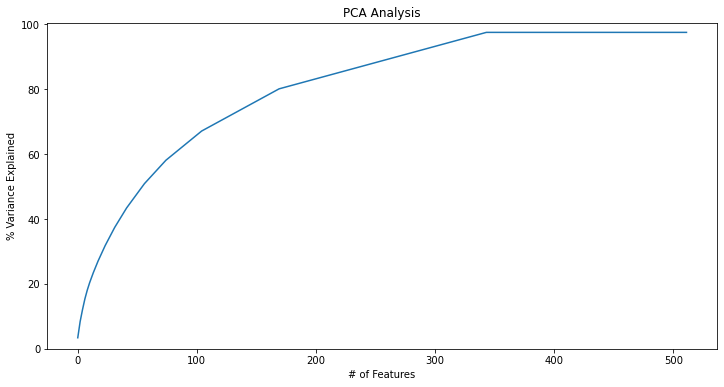

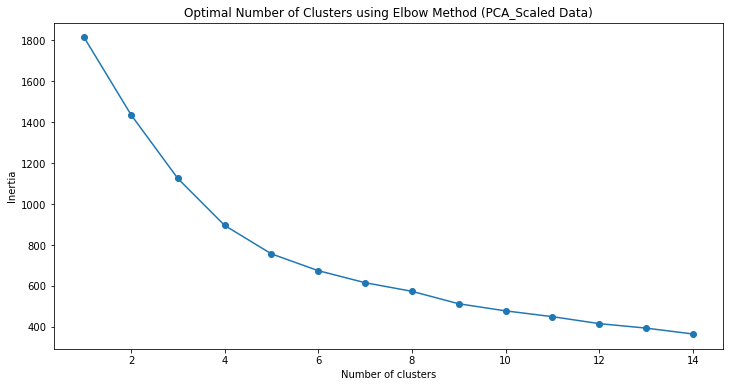

In [201]:
file = "test.json"
ListRecetteRaw = readJson(file)
print("le nombre de recettes raw",len(ListRecetteRaw))
listIngredient,listRecette = getListIngredient(ListRecetteRaw)
dataset = createVector(listIngredient, listRecette)
pca_scale = featureReduce(dataset)
elbowPCA(pca_scale)
silhouette(pca_scale)

In [202]:
def get_ingredients(recipes):
        dict = {}
        for r in recipes:
            for i in r.get('ingredients', []):
                id = i.get('id_ingre')
                if id in dict:
                    dict[id][1] += 1
                else:
                    dict[id] = [i.get('nom_ingre'), 1]
        return dict
def get_ingr_rank(recipes):
    dict = get_ingredients(recipes)
    return sorted(dict.items(), key=lambda i: i[1][1], reverse=True)
#         return {k: v for k, v in sorted(listIngre.items(), key=lambda item: item[1], reverse=True)}

In [203]:
def linkCluster(kmeans,dataset,recipes,n_clusters):
    print(dataset[0])
    recipes_db = []
    for label in range(n_clusters):
        label_index = [i for i, x in enumerate(kmeans.labels_) if x == label]
#         recipes_cluster = [recipes[index] for index in label_index]
        recipes_cluster = []
        for index in label_index:
            for recipe in recipes:
                 if(recipe['id'] == index):
                        recipes_cluster.append(recipe)
        ingredients_ranked = get_ingr_rank(recipes_cluster)
        print("\n\nCluster", label, ":")
        ranking_string = ""
        for index in range(len(ingredients_ranked)):
            ingredient = ingredients_ranked[index]
            if ingredient[1][1] != np.nan and ingredient[1][0] != np.nan:
                ranking_string += ingredient[1][0] + " (" + str(ingredient[1][1]) + "), "
        print(ranking_string + '\n')
        for index_recipe in label_index:
            for recipe in recipes:
                if(recipe['id_cluster'] == index_recipe):
                    recipe['cluster'] = label
                    recipe['coordonnees'] = dataset[index_recipe]
                    recipes_db.append(recipe)
#                     print("Id recette:",recipe['id'],'\n')
#                     print("Nom Recette:",recipe['nom'])
#                     print("List Ingredients:")
                    for ingrediet in recipe['ingredients']:
                        print(ingrediet['nom_ingre'])
    persisetDB(recipes_db)
    print("recipes_db",len(recipes_db))

len dataset 2576


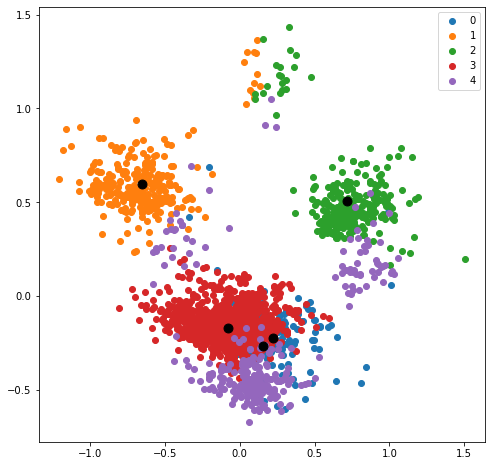

In [204]:
n_clusters = 5
k,d = kmeans(dataset,n_clusters)

In [205]:
linkCluster(k,d,listRecette,n_clusters)

-0.056924;-0.180624;-0.147283;-0.051987;-0.095714;0.048372;-0.092508;-0.126729;-0.055295;-0.113298;-0.059219;0.010835;-0.130158;-0.151611;-0.001469;-0.002019;-0.136215;-0.004516;0.140772;0.142009;-0.144353;-0.195079;-0.170812;-0.141293;-0.225190;0.003203;-0.099928;-0.330611;-0.055348;0.455879;-0.166211;0.107875;-0.084976;0.424209;0.017543;-0.064821;-0.058258;-0.177572;-0.011510;-0.128786;0.004615;-0.009021;-0.004866;0.019677;0.077321;0.041440;0.004211;0.054035;-0.032174;0.054381;-0.028774;0.019277;-0.053745;0.027113;-0.029927;-0.120067;-0.149836;0.045096;-0.008268;-0.020932;-0.054272;-0.029208;0.009061;-0.044134;0.032805;0.027641;-0.039715;-0.023184;-0.021950;-0.037961


Cluster 0 :
pomme de terre (161), huile d'olive (160), eau (159), poivre (156), sel (147), thym (132), rôti de boeuf (114), bouillon de légumes (91), saumon frais (68), avocats (53), mangue (32), sauce teriyaki (23), vin rouge (14), persil (10), sel (3), poivre (2), chevreuil (1), marrons (1), marrons (1), 

poireaux
c

flocons d'avoine
oignons
carotte
poivre
sel
muscade
oeuf
vin blanc
persil
oignons
poivre
sel
moutarde
huile d'olive
boudins blancs
pâtes feuilletées
jaune d'oeuf
courgettes
oignons
olives
oranges
sucre
cannelle
Ras el Hanout
cuisses de poulet
poivron rouge
semoule
oignons
vin rouge
maïzena
poivre
sel
persil
rognons
matière grasse
oignons
beurre
huile d'arachide
cube de bouillon
cannelle
miel
poivre
sel
cuisses de poulet
abricot
couteau
amandes
orange
oignons
ail
cumin
huile
poivre
sel
rôti de porc
clémentines
Alcool
échalotes
raisins secs
tomate
poivron
oignons
ail
vin blanc
bouquet garni
huile d'olive
sel
poivre
poulet
riz
chorizo
poivrons
tomate
oignons
ail
safran
bouillon de volaille
huile d'olive
poivre
sel
filet de poulet
calamar
moules
crevettes
carottes
courgette
poivron
oignons
ail
gingembre
sauce soja
lait de coco
sauce huître
huile de sésame
miel
nouilles
curcuma
boeuf haché
huile
beurre
oignons
carottes
ail
vin blanc
feuilles de laurier
thym
poivre
sel
rôti de veau
châtaigne

lait
farine
gruyère râpé
champignon de Paris
sel
oeufs
dés de jambon
farine
sucre
lait
rhum
sucre vanillé
beurre
pomme
oeufs
lait
farine
courgettes
sel
poivre
oeufs
gruyère
bleu
farine
sucre
beurre
lait
sel
oeufs
farine
levure
lait
gruyère râpé
chorizo
oeufs
tomates séchées
poivrons rouges
lait
beurre
farine
champignon de Paris
sauce tomate
fromage râpé
penne
farine
sucre
pépites de chocolat
nappage chocolat
banane
lait
beurre
oeufs
moules
lait
beurre
sel
poivre
petits pois
fraises
banane
beurre de cacahuètes SKIPPY®
lait
farine
beurre de cacahuètes SKIPPY®
beurre
levure de boulanger fraîche
oeuf
lait
sucre en poudre
sel
huile
copeaux de chocolat
huile de tournesol
lait
courgette
pomme de terre
comté
sel
poivre
oeufs
jambon blanc
carotte
comté
lait
tabasco
huile d'olive
pâte feuilletée
poivron jaune
poivron vert
oeufs
carottes
lait
eau
ail
poivre
poivron vert
fromage de chèvre
gruyère
ciboulette
farine
levure chimique
huile d'olive
lait
graines de tournesol
basilic
oeufs
coppa
mozzarel

gruyère râpé
poivre
sel
biscuits à la cuillère
lait
sucre
fruit confit
rhum
oeufs
raisins secs
lardons
beurre
farine
lait
chou-fleur
vanille
sucre
lait
raisins secs
farine
farine
lait
sucre
sucre
beurre
levure de boulanger
oeuf
poireaux
gruyère râpé
beurre
farine
lait
muscade
poivre
sel
jambon
farine
lait
levure
sel
sucre
beurre tendre
graines de lin
sésame
jaunes d'oeuf
beurre
farine
lait
sel
poivre
muscade
riz
riz
reblochon
oignons
chou-fleur
lardons fumés
ail
citron
huile d'olive
maïzena
lait
persil
sel
saumon
noix de saint-jacques
ciboulette
lait
huile d'olive
filet mignon
bleu des causses
ricotta
pâte feuilletée
semoule
jaune d'oeuf
poireaux
oignon
lait
farine
muscade
coriandre
gruyère râpé
blette
oeufs
lardons fumés
basilic frais
"Mix Pâtisserie" Mix C Schär
beurre tendre
oeufs
lait
sucre
sucre vanillé
sel
farine
levure
miel
noix
sucre
lait
farine
sucre
huile
lait
levure
yaourt aux fruits
farine de blé
beurre doux
lait
chocolat amer
crème fraîche liquide
farine
beurre doux
sucre 

oignon
persil
pain de mie
lait
poivre
sel
huile d'olive
boeuf haché
haché de veau
estragon
pain de mie
purée de tomate
champignon de Paris
oignon
persil
basilic
origan
huile d'olive
poivre
sel
viande hachée
oignon
persil
aneth
moutarde de Dijon
farine
huile
poivre
sel
viande hachée
boeuf haché
chapelure
oeuf
oignon
poivre
sel
viande hachée
biscotte
oeuf
ciboulette
pomme de terre
oignon
ail
persil
morue
oeufs
oignon
beurre
huile
ail
cannelle
sauce soja
poivre
sel
escalopes de poulet
miel liquide
oignon
poivre
sel
cumin
boeuf haché
oeufs
chapelure
coulis de tomate
menthe
Parmesan
piment
herbes de Provence
oignon
huile d'olive
poivre
sel
boeuf haché
viande hachée
pulpe de tomate
crêpes
oignon
emmental
jambon
porto
beurre
huile de tournesol
oignon
paprika
concentré de tomates
poivre
sel
sauté de porc
lardons fumés
olives noires
ketchup
cassonade
moutarde
oignon
oignon
ketchup
persil
sel
poivre
flocons d'avoine
oeuf
relish
boeuf haché
pomme de terre
oignon
ail
huile d'olive
poivre
sel
eau
c

huile d'olive
poivre
sel
lardons
pommes de terre
oignon
gruyère râpé
poivre
pâte feuilletée
oeufs
crème fraîche épaisse
reblochon
oignon
poivre
vin blanc
huile d'olive
lardons fumés
pains pour hamburger
pains pour hamburger
steaks
salade
cornichons
moutarde à l'ancienne
reblochon
pomme de terre
oignon
lardons
poivre
sel
huile
crème liquide
lait
oignon
vin blanc
poivre
pâte feuilletée
camembert
cancoillotte
lard
oeufs
ciboulette
oignon
carotte
pommes de terre
lardons
ail
thym
beurre
eau
sel
poivre
moutarde
oignons blancs
lentilles vertes
saucisses
laurier
crème épaisse
pomme de terre
oignon
persil
gruyère râpé
poivre
sel
huile d'olive
brick
jambon blanc
oeufs
oignon
tomates cerise
emmental
ketchup
vinaigre balsamique
huile d'olive
basilic
pain de mie
jambon
oignon
oignon
poireau
carotte
feuille de laurier
thym
coriandre
ail
cube de bouillon
poivre
sel
lentilles vertes
Foie gras
oignon
persil
moutarde
beurre tendre
poivre
sel
thon
anchois
oeuf
corn flakes
chapelure
mayonnaise
oignon
eau


ail
carré frais
basilic frais
beurre
riz sauvage
oignon
feuille de laurier
clou de girofle
aubergines
aubergines
sel
ciboulette
thym
origan
tome de brebis
tomates cerise
oeufs
huile d'olive
poivre
piment de Cayenne
tomate
sucre
mozzarella
haricots rouges
oignon
herbes de Provence
huile
piment de Cayenne
poivre
sel
farine
oeuf
oignon
sauce tomate
gruyère râpé
herbes de Provence
poivre
sel
huile d'olive
ail
canneloni
boeuf haché
chair à saucisse
fromage de chèvre
oignon
fécule de maïs
sauce soja
ail
épices
gingembre
sucre
huile
sel
poivre
viande hachée
oeuf
sauce barbecue
poivre de Cayenne
chapelure
carottes
beurre
ail
oignon
maïzena
sel
poivre
veau
bouillon
aubergines
persil
oignon
Ras el Hanout
huile d'olive
sel
poivre
haché de veau
pignons
pain de campagne
aubergine
pain de mie
oignon
cannelle
herbes de Provence
huile d'olive
boeuf haché
girofle
oignon
vinaigre
miel
cannelle
sel
poivre
jus de citron
thon
raisins secs
haricots rouges
carottes
oignon
clous de girofle
persil
thym
concent

basilic frais
sauce soja
huile d'olive
huile de sésame
vinaigre
miel liquide
riz
riz
filets de poulet
chocolat noir
sucre
beurre
noix
farine
oeufs
sucre
cacao
vanille
patate douce
farine de sarrasin
noix de pécan
dattes
huile de coco
amandes
huile d'olive
poivrons
poivre
sel
escalope de poulet
menthe
oignon blanc
citron vert
pain de mie
poivre
sel
aneth
citron
mascarpone
saumon fumé
tomates cerise
boursin
courgette
lait demi-écrémé
pâte feuilletée
crevettes
crème liquide
oeufs
beurre
sucre en poudre
vanille
cannelle
sel
patate douce
oeufs
citrons verts
sucre
cacao
vanille
patate douce
farine de sarrasin
noix de pécan
dattes
huile de coco
amandes
beurre
sucre glace
sucre semoule
farine de blé
calvados
sel
pommes
pâte sablée
amandes
oeufs
fructose
rhubarbe
crème liquide
ail
sel
poivre
huile d'olive
vinaigre
poivron rouge
poivron vert
poivron jaune
cacahuète grillée
sel
lait de coco
jus de citron
pâte de curry
sucre brun
coriandre
coriandre
curcuma
cumin en poudre
lait de coco
sucre brun


aubergine
jus de citron
tahiné
huile d'olive
ail
sel
poivre
vinaigre balsamique
huile de tournesol
miel
poivre
sel
curry
huile de noisette
échalote
lardons
lardons
tomates
lentilles
feta
lait concentré sucré
jaunes d'oeuf
blancs d'oeuf
arôme vanille
pomme de terre
huile de friture
pomme
miel
beurre
bûche de chèvre
brick
salade
sucre
lait entier
oeufs
miel
sel
poivre
fromage de chèvre
raisins secs
brick
jaunes d'oeuf
pâte brisée
pommes
cannelle
extrait de vanille liquide
beurre doux
sucre
oeuf
poudre d'amandes
noix de pécan
huile d'olive
farine de blé
poivre
sel
lait de chèvre
Parmesan
Parmesan
chou-fleur
aubergine
sauce tomate
paprika
herbes de Provence
basilic
poivre
sel
gros sel
huile d'olive
petits suisses
cancoillotte
olives noires
câpres
ail
huile d'olive
anchois
herbes de Provence
huile d'olive
farine
beurre
levure
sel
eau
sucre en poudre
cassonade
oeufs
crème fraîche liquide
pommes de terre
thon
oeuf
cornichons
vinaigrette
poivre
sel
beurre
brick
ciboulette
cerfeuil
chèvre frais

biscuit
eau
vanille
fructose
sucre
vermicelles
mangues
fruit de la passion
mascarpone
oeufs
fraises
citron
sucre semoule
eau
pâte sablée
gelée
riz
feuille de nori
sel
prune
saumon
takuan
tomate
paprika
vinaigre balsamique
avocat
rillettes
mayonnaise
crevettes
yaourt
fraises
banane
jus d'orange
yaourt nature
fraises
chocolat blanc
gélatine
maïzena
sucre en poudre
pâte sablée
crème liquide
poudre de noisette
pistaches
oeufs
sucre glace
cacao
blancs d'oeuf
chocolat pâtissier
sucre vanillé
sucre glace
beurre
génoise
jaune d'oeuf
vermicelles en chocolat
riz rond
nori
sel
thon
mayonnaise
miel
sauce soja
gingembre
citron
poivre
viande
farine
sucre roux
vanille
sel
beurre
miel
chocolat
oeuf
raisins secs
pâte brisée
bananes
citron
confiture de lait
noix de pécan
kiwis
ananas
cookie
chocolat
farine
beurre
sucre
levure
sucre vanillé
sel
oeufs
noisettes
vinaigre balsamique
huile d'olive
moutarde
sel
poivre
tomates
tomates
roquette
avocat
crevette rose
beurre
farine
bouillon de volaille
eau
fromage

poivre
vin blanc
topinambours
échalotes
asperge
cheddar
lardons
poudre de colombo
oeufs
citron
maïs
petits pois
poivron vert
ananas
avocat
laitue
olives noires
mayonnaise
tomates cerise
parmesan râpé
huile
pain de mie
jus de citron
sel
poivre
farine
romaine
anchois
filet de poulet
corn flakes
oeufs
oeufs
eau
raisin
vin rouge
sucre
cassis
sucre en poudre
eau
ananas
asperge
ail
pancetta
amandes
farine
lait demi-écrémé
huile
bière
oeufs
aubergine
tomate
pâte feuilletée
mozzarella
gruyère
champignon de Paris
ail
gruyère râpé
vin blanc sec
beurre
persil
farine
poivre
sel
escalopes de veau
crème fraîche épaisse
chapelure
asperge
lait demi-écrémé
parmesan râpé
poivre
sel
crème liquide
riz
beurre
vin blanc
parmesan râpé
asperge verte
échalotes
bouillon de légumes
pâtes
Parmesan
huile d'olive
ail
romarin
sel
poivre
camembert
épinards frais
beurre
sel
sucre
farine
levure
chocolat pâtissier
oeufs
oranges
pommes
carotte
kiwi
tomate
ketchup
sel
poivre
huile d'olive
pains pour hamburger
blancs de po

chocolat au lait
chocolat noir
beurre
pralinoise
crème liquide
corn flakes
griotte
griotte
beurre tendre
sucre glace
farine
cacao
beurre demi-sel
poudre d'amandes
jaunes d'oeuf
beurre tendre
beurre tendre
sucre glace
farine
beurre demi-sel
jaunes d'oeuf
poudre d'amandes
beurre
champignon de Paris
vin blanc
thym
poivre
sel
coquilles saint-jacques
échalote
crème
estragon
chocolat noir
fruit confit
beurre
céréale
abricot
farine
cassonade
fromage blanc
oeufs
céréale
carotte
huile d'olive
vin blanc sec
herbes de Provence
fleur de sel
poivre
citron
maquereau
échalotes
fond
crème fraîche épaisse
saumon
Pâte Brisée HERTA® TARTE EN OR®
oeufs
poireaux
crème liquide
muscade
farine
sucre
oeufs
moules
persil
oignons jaunes
vin blanc
beurre
sel
poivre
coquilles saint-jacques
chapelure
tagliatelles fraîches
tomate
concentré de tomates
mascarpone
saumon fumé
fraises
chocolat
cornets
raisin blanc
pêche
pastèque
crème
chocolat noir
beurre
sucre roux
abricot
datte
poudre d'amandes
oeufs
thé matcha
emment

sucre
eau
myrtilles
poivrons
pain de mie
basilic
herbes de Provence
persil
ail
sel
poivre
steaks
fromage râpé
pâte feuilletée
jambon
beurre
jus de citron
herbes de Provence
moutarde
poivre
sel
maïzena
crème liquide
huile d'olive
citrons
thym
beurre
vin blanc
olives
sucre
sel
poivre
beurre
daurade
fenouil
ciboulette
tomates cerise
poivre
sel
pâte feuilletée
fromage de chèvre
basilic frais
comté
beaufort
emmental
vin blanc sec
muscade
maïzena
liqueur
ail
poivre
oeuf
riz
ail
coriandre
tomates
gingembre
cumin
piment
poivre
sel
oignon blanc
coulis de tomate
huile
vinaigre
poivre
sel
tomates
tomates
haricot
knacki
gruyère
poivron vert
moutarde de Dijon
huile de tournesol
vinaigre de vin
aneth
poivre
sel
moutarde à l'ancienne
vergeoise
gros sel
gros sel
sucre
aneth
poivre
saumon
riz
persil
curcuma
sel
huile d'olive
citron
lentilles
ciboulette
eau
sucre en morceaux
myrtilles
myrtilles
poireaux
riz
bouillon de volaille
huile d'olive
gruyère râpé
poivre
sel
beurre
poivre
sel
canard
persil
citron

sucre
crème
beurre demi-sel
sucre
chocolat noir
chocolat au lait
cacao
beurre demi-sel
crème fraîche épaisse
chocolat au lait
spéculoos
sucre en poudre
mascarpone
oeufs
beurre demi-sel
crème liquide
chocolat blanc
lait de coco
pâte sablée
sucre en poudre
farine
huile de tournesol
sirop d'érable
oeufs
chocolat noir
beurre
sucre
farine
oeufs
sucre
sucre
fleur de sel
crème liquide
beurre demi-sel
bar
échalotes
vanille
crème liquide
beurre
sucre
patate douce
rutabaga
topinambours
panais
semoule moyenne
eau
sel
huile d'olive
beurre
champignon
beurre
porto
poivre
sel
escalopes de poulet
échalotes
crème fraîche épaisse
sucre semoule
vanille
lait entier
semoule
pain
porto
cognac
cannelle
muscade
sirop de canne
oeuf
glaçons
chocolat noir
sucre fin
beurre tendre
crème liquide
sucre en poudre
sucre en poudre
sucre vanillé
beurre tendre
vanille
fleur de sel
lait entier
jaunes d'oeuf
crème liquide
beurre demi-sel
sucre fin
sucre fin
farine
maïzena
bicarbonate
beurre
oeufs
vin rouge
étoiles de badia

tomate
origan
huile d'olive
pain de campagne
mozzarella
sucre
crème de marron
blancs d'oeuf
chorizo
fromage râpé
huile d'olive
ail
baguette
poivron vert
farine
sucre vanillé
beurre tendre
sucre semoule
confiture
sucre glace
oeuf
amandes
fromage blanc
sucre en poudre
citrons
farine
beurre
palets bretons
mascarpone
oeufs
tagliatelles fraîches
poivre
sel
crème liquide
thon
petits pois
Framboises Tul’Panach’®
biscuits secs
beurre
fromage frais
yaourt nature
sucre en poudre
extrait de vanille
gélatine en poudre
eau
Framboises Tul’Panach’®
Framboises Tul’Panach’®
sucre
eau
sucre glace
sucre vanillé
beurre tendre
fraises
citron
mascarpone
sablés
fromage frais
fruits secs
chocolat
gâteaux
margarine
golden syrup
pesto
pain de campagne
sardines
poivron rouge
chocolat
beurre
sucre
farine
gingembre confit
sel
oeufs
poudre d'amandes
spéculoos
chocolat noir
sucre en poudre
cacao amer
beurre salé
jaunes d'oeuf
fromage blanc
cacao amer
crème de marron
farine
beurre
sel
chocolat noir
oeuf
crème de marr

tomate
purée de tomate
thym
sauge
romarin
huile d'olive
pâte feuilletée
saumon
crème fraîche épaisse
moutarde à l'ancienne
sucre
coing
lardons
herbes de Provence
poivre
sel
camemberts
crème fraîche épaisse
salade
vinaigrette
tomates
huile d'olive
vinaigre balsamique
concombre
melon
jambon
feta
menthe
farine
beurre
vergeoise brune
pomme
pomme
banane
coings
framboises
bagel
brie de meaux
miel liquide
cerneau de noix
salade
miel
gingembre
sel
poivre
escalopes de dinde
salade
beurre
homards
flétan
saumon
blancs d'oeuf
crème fraîche épaisse
baies roses
cresson
noix
huile d'olive
eau
sel
poivre
courgettes
lardons
comté
huile d'olive
farine
poivre
sel
oeufs
crème liquide
canneloni
tomates pelées
gruyère
carottes
courgettes
aubergine
ail
piments
concentré de tomates
curcuma
piment d'Espelette
curry
poivre
sel
steaks
navets
chou
poivron vert
poivron rouge
bouillon de légumes
sucre
coing
farine
levure chimique
sel
sucre
crème liquide
pâte brisée
poivre
sel
cresson
thon
oeufs
brique
tomate
fromag

oeufs
biscuit
biscuit
beurre doux
muscade
lait
chocolat noir
crème fraîche
sucre
extrait de vanille
cannelle
chocolat au lait
crème fraîche
lait entier
crème chantilly
crème fraîche
bouillon de volaille
huile
poivre
sel
poulet
citrons verts
échalote
sucre
crème fraîche
oeufs
ananas
beurre
beurre tendre
sucre fin
sucre vanillé
citron
crème fraîche
gélatine
eau
miel liquide
sucre brun
fromage frais
framboises
sucre vanillé
kirsch
pomme
pomme
sucre vanillé
gélatine
crème fraîche
ananas
farine
farine
sucre
huile de tournesol
levure chimique
vanille
beurre
oeufs
ananas
ananas
confiture d'abricot
amandes
sucre en poudre
fromage blanc
crème fraîche
oeufs
fromage frais
framboises
myrtilles
beurre
beurre
biscuits secs
citron
poivre
sel
persil
crème fraîche
huile d'olive
saumon frais
chocolat noir
chocolat blanc
chocolat blanc
chocolat blanc
crème fraîche
gélatine
blancs d'oeuf
chocolat noir
chocolat noir
beurre
oeufs
moutarde
crème fraîche
thym
sel
poivre
eau
huile
cuisses de poulet
sucre
crème

pâte brisée
banane
citron
beurre
noix de coco rapée
sucre vanillé
cannelle
chocolat noir
crème fraîche
oeufs
miel liquide
crème fraîche
sucre glace
sucre vanillé
oeufs
meringues
pâte à pizza
griottes
crème fraîche
sucre en poudre
crème fraîche
sucre
spéculoos
sucre vanillé
extrait de vanille
chocolat blanc
oeufs
meringues
sucre
noix de coco rapée
chocolat
crème fraîche
chocolat noir
beurre
blancs d'oeuf
crème fraîche
sucre
citron
sucre glace
oeufs
meringues
framboises
crème fleurette
ail
crème fraîche
moutarde
poivre
sel
escalopes de poulet
échalotes
sucre glace
sucre
sucre
farine
lait
jaunes d'oeuf
sucre
sucre
crème fraîche
beurre salé
eau
eau
beurre
farine
sel
oeufs
jaune d'oeuf
crème fraîche
sucre semoule
beurre salé
miel liquide
sucre
citron
crème fraîche
gélatine
myrtilles
oeufs
crème fraîche
sucre vanillé
sucre glace
spéculoos
oeufs
blancs d'oeuf
mascarpone
nutella
oignon
carotte
calvados
bouquet garni
bouillon de volaille
crème fraîche
beurre
poivre
sel
lapin
échalote
cidre
toma

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("boyau","317","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("bois\ d'Inde","318","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("jus\ d'ananas","319","https://assets\.afcdn\.com/recipe/20170621/69082_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("glace\ fraise","320","https://assets\.afcdn\.com/recipe/20180823/81887_w96h96c1cx2500cy2500cxb5000cyb5000\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("limonade","321","https://assets\.afcdn\.com/recipe/20170621/69087_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("cive","530","https://assets\.afcdn\.com/recipe/20180719/81513_w96h96c1cx1900cy1900cxb3800cyb3800\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("girofle","531","https://assets\.afcdn\.com/recipe/20170607/67529_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("HERTA®\ LE\ BON\ VEGETAL®\ Pavés\ Gourmands\ Courgette\ et\ Fromage","532","https://assets\.afcdn\.com/recipe/20210318/118684_w96h96c1cx250cy250cxb500cyb500\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("tomates\ séchées","533","https://assets\.afcdn\.com/recipe/20201029/115106_w96h96c1cx2808cy1872cxb5616cyb3744\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("escalopes\ de\ veau","534","https://assets\.afcdn\.com/recipe/20211019/122861_w96h96c1cx41

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("jambon\ fumé","852","https://assets\.afcdn\.com/recipe/20170607/67351_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("gouda","853","https://assets\.afcdn\.com/recipe/20170607/67762_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("sirop\ de\ fraise","854","https://assets\.afcdn\.com/recipe/20210309/118453_w96h96c1cx457cy454cxb914cyb908\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("sirop\ de\ glucose","855","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("pêche","856","https://assets\.afcdn\.com/recipe/20170607/67708_w96h96c1cx3000cy2600\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,u

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("muscade","1140","https://assets\.afcdn\.com/recipe/20170607/67662_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("sucre\ vanillé","1141","https://assets\.afcdn\.com/recipe/20170607/67644_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("origan","1142","https://assets\.afcdn\.com/recipe/20170607/67405_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("paprika","1143","https://assets\.afcdn\.com/recipe/20170607/67557_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("pommes","1144","https://assets\.afcdn\.com/recipe/20170607/67365_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("scampis","1145

None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("137","Amour de tarte aux fruits de mer ","Recettes","https://assets.afcdn.com/recipe/20100120/1532_w1000h1000.jpg","0","NO VALUES","15 min","30 min","-","très facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("138","Pâtes à l'italienne","Plat principal;Pâtes  riz  semoule;Autres pâtes","https://assets.afcdn.com/recipe/20160225/65113_w1000h1000.jpg","0","NO VALUES","15 min","15 min","-","très facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,

None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("358","Vite fait aux fruits","Recettes","https://assets.afcdn.com/recipe/20130311/9926_w1000h1000.jpg","1","NO VALUES","5 min","40 min","-","très facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("359","Pâte à gaufre","Dessert;Gaufre","https://assets.afcdn.com/recipe/20130627/64001_w1000h1000.jpg","1","NO VALUES","10 min","15 min","-","facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,bud

None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("610","Endives à l'avocat et au saumon","Recettes","https://assets.afcdn.com/recipe/20100120/878_w1000h1000.jpg","2","NO VALUES","10 min","-","-","très facile","moyen","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("611","Sauté de porc à la bière","Plat principal;Viande;Viande en sauce;Sauté de porc","https://assets.afcdn.com/recipe/20201228/116796_w1000h1000.jpg","2","NO VALUES","20 min","1 h 30 min","-","facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
   

None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("691","Blanquette végétarienne facile","Plat principal;Viande;Viande en sauce;Blanquette","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w1000h1000.jpg","2","NO VALUES","20 min","15 min","-","très facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("692","Rôti de veau aux marrons et échalotes","Accompagnement;Marrons","https://assets.afcdn.com/recipe/20130719/55566_w1000h1000.jpg","2","NO VALUES","15 min","1 h","-","très facile","moyen","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_p

None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("879","Purée de pommes de terre de Joël Robuchon","Accompagnement;Purée","https://assets.afcdn.com/recipe/20191210/104059_w1000h1000.jpg","3","NO VALUES","10 min","40 min","-","facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("880","Gigue de chevreuil","Plat principal;Viande;Viande rôtie;Gibier","https://assets.afcdn.com/recipe/20191124/102920_w1000h1000.jpg","3","NO VALUES","1 h","40 min","-","moyenne","assez cher","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_t

None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1084","Salade de choux blanc, ananas, pomme","Recettes","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w1000h1000.jpg","3","NO VALUES","10 min","-","-","très facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1085","Salade de chou blanc à la pomme et raisins secs","Salade;Salade de chou","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w1000h1000.jpg","3","NO VALUES","15 min","-","-","très facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_p

None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1203","Gâteau pommes, noix et cannelle","Dessert;Gâteau;Gâteau aux noix","https://assets.afcdn.com/recipe/20160404/30122_w1000h1000.jpg","3","NO VALUES","25 min","1 h","-","très facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1204","Frites au micro-ondes","Accompagnement;Frites","https://assets.afcdn.com/recipe/20190110/85802_w1000h1000.jpg","3","NO VALUES","5 min","15 min","-","très facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
    

None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1408","Verrines exotiques","Recettes","https://assets.afcdn.com/recipe/20140725/53773_w1000h1000.jpg","3","NO VALUES","40 min","30 min","-","moyenne","moyen","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1409","Cookies caramel et m&ms","Dessert;Sauce sucrée;Caramel","https://assets.afcdn.com/recipe/20140303/19349_w1000h1000.jpg","3","NO VALUES","10 min","10 min","-","très facile","moyen","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_ti

None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1596","Stick de mozzarella","Recettes","https://assets.afcdn.com/recipe/20161213/6593_w1000h1000.jpg","3","NO VALUES","10 min","10 min","-","très facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1597","Filet de colin sous son lit de carottes de ma Maman","Plat principal;Poisson;Filets de poisson","https://assets.afcdn.com/recipe/20110930/24985_w1000h1000.jpg","3","NO VALUES","15 min","45 min","-","facile","bon marché","1","None");
(1406, "Data too long for column 'name' at row 1")
None
RECIPE :: insert into recipe (id_recipe,name,categ

None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1805","Concombres farcis pommes avocats et crevettes","Plat principal;Fruits de mer;Crevettes","https://assets.afcdn.com/recipe/20140604/35274_w1000h1000.jpg","3","NO VALUES","30 min","-","-","facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1806","Mont aux châtaignes","Recettes","https://assets.afcdn.com/recipe/20161103/20029_w1000h1000.jpg","3","NO VALUES","50 min","20 min","-","moyenne","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
       

None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1984","jambon au porto","Recettes","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w1000h1000.jpg","3","NO VALUES","20 min","15 min","-","très facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1985","Tartelette aux fruits secs et glace à la vanille","Dessert;Dessert glacé;Glace;Glace à la vanille","https://assets.afcdn.com/recipe/20150623/43340_w1000h1000.jpg","3","NO VALUES","15 min","-","-","facile","moyen","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directio

None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("2133","Tarte tatin aux endives et chavignol","Pizza  tarte  quiche;Tarte salée;Tarte tatin salée","https://assets.afcdn.com/recipe/20180219/77624_w1000h1000.jpg","3","NO VALUES","25 min","40 min","-","facile","moyen","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("2134","Gâteau au yaourt et au chocolat","Dessert;Gâteau;Gâteau au yaourt","https://assets.afcdn.com/recipe/20160728/22743_w1000h1000.jpg","3","NO VALUES","15 min","45 min","-","facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,di

None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("2358","Verrines aux fraises Tagada","Recettes","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w1000h1000.jpg","4","NO VALUES","45 min","10 min","-","facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("2359","gâteau aux fraises et chocolat","Dessert;Gâteau;Gâteau au chocolat","https://assets.afcdn.com/recipe/20140316/24264_w1000h1000.jpg","4","NO VALUES","20 min","35 min","-","facile","bon marché","1","None");
None
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,c

CLE PRIMAIRE ING =  966
Title Ingredient =  boeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","966","500g");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Pot-au-feu";
CLE PRIMAIRE ING =  966
Title Ingredient =  boeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","966","500g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "os\ à\ moelle";
GET ID RECIPE : select id_recipe from recipe where name= "Pot-au-feu";
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","0","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au four

CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("6","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Lotte marinière";
CLE PRIMAIRE RECIPE : 6
TITRE RECIPE ::::: Lotte marinière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("6","1276","");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Lotte marinière";
CLE PRIMAIRE RECIPE : 6
TITRE RECIPE ::::: Lotte marinière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient = 


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Lotte au curry";
CLE PRIMAIRE RECIPE : 10
TITRE RECIPE ::::: Lotte au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("10","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Lotte au curry";
CLE PRIMAIRE RECIPE : 10
TITRE RECIPE ::::: Lotte au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("10","1281","");
6morceaux
SQL GET ID INGRE ::::::::: se

LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("14","0","500g");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "porc";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de sanglier rapide";
CLE PRIMAIRE RECIPE : 14
TITRE RECIPE ::::: Terrine de sanglier rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  764
Title Ingredient =  porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("14","764","1kg");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de sanglier rapide";
CLE PRIMAIRE RECIPE : 14
TITRE RECIPE ::::: Terrine de sanglier rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Ras\ el\ Hanout";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de veau aux citrons confits et au safran";
CLE PRIMAIRE RECIPE : 20
TITRE RECIPE ::::: Tajine de veau aux citrons confits et au safran
++++++++++++++++++++++++
CLE PRIMAIRE ING =  524
Title Ingredient =  Ras\ el\ Hanout
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("20","524","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de veau aux citrons confits et au safran";
CLE PRIMAIRE RECIPE : 20
TITRE RECIPE ::::: Tajine de veau aux citrons confits et au safran
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1069
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values(

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc fondant en cocotte";
CLE PRIMAIRE RECIPE : 24
TITRE RECIPE ::::: Filet mignon de porc fondant en cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("24","1273","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc fondant en cocotte";
CLE PRIMAIRE RECIPE : 24
TITRE RECIPE ::::: Filet mignon de porc fondant en cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  17
Title Ingredient =  thym
CLE PRIMAIRE ING =  1214
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,qua

CLE PRIMAIRE ING =  12
Title Ingredient =  jambon
CLE PRIMAIRE ING =  1162
Title Ingredient =  jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("28","1162","2tranches");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riz";
GET ID RECIPE : select id_recipe from recipe where name= "Ailerons de dinde au curry à l'indienne";
CLE PRIMAIRE RECIPE : 29
TITRE RECIPE ::::: Ailerons de dinde au curry à l'indienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1046
Title Ingredient =  riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("29","1046","200g");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "raisins\ secs";
GET ID RECIPE : select id_recipe from recipe where name= "Ailerons de dinde au curry à l'indienne";
CLE PRIMAIRE RECIPE : 29
TITRE RECIPE ::::: Ailerons de dinde au cur

CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("33","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes végétariennes (facile)";
CLE PRIMAIRE RECIPE : 33
TITRE RECIPE ::::: Lasagnes végétariennes (facile)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("33","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "herbes\ de\ Provence";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes végétariennes (facile)";
CLE PRIMAIRE RECIPE : 33
TITRE RECIPE ::::: Lasagnes végét

CLE PRIMAIRE RECIPE : 37
TITRE RECIPE ::::: Soupe de courge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1277
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("37","1277","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de courge";
CLE PRIMAIRE RECIPE : 37
TITRE RECIPE ::::: Soupe de courge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("37","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de courge";
CLE PRIMAIRE RECIPE : 37
TITRE RECIPE ::::: Soupe de courge
+++++++++++++++++++

CLE PRIMAIRE ING =  1
Title Ingredient =  oignons
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("40","1115","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf Bourguignon Aldi";
CLE PRIMAIRE RECIPE : 40
TITRE RECIPE ::::: Boeuf Bourguignon Aldi
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1061
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("40","1061","2");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons\ Le\ Marsigny\ ®";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf Bourguignon Aldi";
CLE PRIMAIRE RECIPE : 40
TITRE RECIPE ::::: Boeuf Bourguignon Aldi
++++++++++++++++++++++++
LIAISON INGREDIENT

CLE PRIMAIRE ING =  95
Title Ingredient =  pecorino
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("44","95","1sachet");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aubergines";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagne d'aubergines aux noix";
CLE PRIMAIRE RECIPE : 45
TITRE RECIPE ::::: Lasagne d'aubergines aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  585
Title Ingredient =  aubergines
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("45","585","4");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagne d'aubergines aux noix";
CLE PRIMAIRE RECIPE : 45
TITRE RECIPE ::::: Lasagne d'aubergines aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  

CLE PRIMAIRE ING =  1
Title Ingredient =  oignons
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("50","1115","2");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Chili con carne facile au Cooking Chef";
CLE PRIMAIRE RECIPE : 50
TITRE RECIPE ::::: Chili con carne facile au Cooking Chef
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("50","1276","2gousses");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Chili con carne facile au Cooking Chef";
CLE PRIMAIRE RECIPE : 50
TITRE

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au potimarron";
CLE PRIMAIRE RECIPE : 55
TITRE RECIPE ::::: Poulet au potimarron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("55","1281","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au potimarron";
CLE PRIMAIRE RECIPE : 55
TITRE RECIPE ::::: Poulet au potimarron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("55","1248","1");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ing

CLE PRIMAIRE ING =  1053
Title Ingredient =  sel\ et\ poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("60","1053","");
4tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cheddar";
GET ID RECIPE : select id_recipe from recipe where name= "Grilled cheese";
CLE PRIMAIRE RECIPE : 60
TITRE RECIPE ::::: Grilled cheese
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1118
Title Ingredient =  cheddar
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("60","1118","4tranches");
1poignée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "épinards";
GET ID RECIPE : select id_recipe from recipe where name= "Grilled cheese";
CLE PRIMAIRE RECIPE : 60
TITRE RECIPE ::::: Grilled cheese
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1252
Title Ingredient =  épinards
LIAISON INGREDIENT :  insert into con


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe à l'oignon au camembert";
CLE PRIMAIRE RECIPE : 64
TITRE RECIPE ::::: Soupe à l'oignon au camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1068
Title Ingredient =  pain
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("64","1068","");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échine\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "Colombo de porc";
CLE PRIMAIRE RECIPE : 65
TITRE RECIPE ::::: Colombo de porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  échine\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("65","909","1kg");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
           

CLE PRIMAIRE RECIPE : 69
TITRE RECIPE ::::: Boeuf surprise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1003
Title Ingredient =  clou\ de\ girofle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("69","1003","1");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf surprise";
CLE PRIMAIRE RECIPE : 69
TITRE RECIPE ::::: Boeuf surprise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1218
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("69","1218","1pincée");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre\ balsamique";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf surprise";
CLE PRIMAIRE RECIPE : 69
TITRE RECIPE ::::: Boeuf surprise
++++++++++++++++++++++++
C

CLE PRIMAIRE ING =  1
Title Ingredient =  oignons
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("73","1115","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Dorades royales à la croûte au sel";
CLE PRIMAIRE RECIPE : 73
TITRE RECIPE ::::: Dorades royales à la croûte au sel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1277
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("73","1277","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Dorades royales à la croûte au sel";
CLE PRIMAIRE RECIPE : 73
TITRE RECIPE ::::: Dorades royales à la croûte au sel
++++++++++++++++++++++++


CLE PRIMAIRE RECIPE : 76
TITRE RECIPE ::::: Croûtes aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("76","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "paprika";
GET ID RECIPE : select id_recipe from recipe where name= "Croûtes aux champignons";
CLE PRIMAIRE RECIPE : 76
TITRE RECIPE ::::: Croûtes aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1143
Title Ingredient =  paprika
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("76","1143","");
1.5dl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème";
GET ID RECIPE : select id_recipe from recipe where name= "Croûtes aux champignons";
CLE PRIMAIRE RECIPE : 76
TITRE RECIPE ::::: 

CLE PRIMAIRE RECIPE : 81
TITRE RECIPE ::::: Porc à l'ananas et aux poivrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("81","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "paprika";
GET ID RECIPE : select id_recipe from recipe where name= "Porc à l'ananas et aux poivrons";
CLE PRIMAIRE RECIPE : 81
TITRE RECIPE ::::: Porc à l'ananas et aux poivrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1143
Title Ingredient =  paprika
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("81","1143","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment";
GET ID RECIPE : select id_recipe from recipe where name= "Porc à l'ananas et aux poivrons";
CLE PRIMAIRE REC

510g21gousse1bouquet211500g150g1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Wok de porc sautés à la coriandre";
CLE PRIMAIRE RECIPE : 86
TITRE RECIPE ::::: Wok de porc sautés à la coriandre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1061
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("86","1061","510g21gousse1bouquet211500g150g1");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Wok de porc sautés à la coriandre";
CLE PRIMAIRE RECIPE : 86
TITRE RECIPE ::::: Wok de porc sautés à la coriandre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1061
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  value

CLE PRIMAIRE ING =  1177
Title Ingredient =  pâtes\ feuilletées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("90","1177","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaune\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte au boudin blanc et vin blanc";
CLE PRIMAIRE RECIPE : 90
TITRE RECIPE ::::: Tourte au boudin blanc et vin blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1229
Title Ingredient =  jaune\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("90","1229","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de poulet aux oranges";
CLE PRIMAIRE RECIPE : 91
TITRE RECIPE ::::: Tajine de poulet aux oranges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1212
T

1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet basquaise";
CLE PRIMAIRE RECIPE : 95
TITRE RECIPE ::::: Poulet basquaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1170
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("95","1170","1kg");
700g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet basquaise";
CLE PRIMAIRE RECIPE : 95
TITRE RECIPE ::::: Poulet basquaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1247
Title Ingredient =  poivron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("95","1247","700g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";


Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("98","1061","2");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de veau aux châtaignes";
CLE PRIMAIRE RECIPE : 98
TITRE RECIPE ::::: Rôti de veau aux châtaignes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("98","1276","2gousses");
1verre
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de veau aux châtaignes";
CLE PRIMAIRE RECIPE : 98
TITRE RECIPE ::::: Rôti de veau aux châtaignes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1148
Title In

CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("103","1280","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "paupiettes\ de\ veau";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de veau au curry";
CLE PRIMAIRE RECIPE : 103
TITRE RECIPE ::::: Paupiettes de veau au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1023
Title Ingredient =  paupiettes\ de\ veau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("103","1023","4");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carotte";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de veau aux marrons";
CLE PRIMAIRE RECIPE : 104
TITRE RECIPE ::::: Noix de veau aux marrons
++++++++++++++++++++

CLE PRIMAIRE RECIPE : 108
TITRE RECIPE ::::: Noix de veau aux olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("108","1281","");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ veau";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de veau aux olives";
CLE PRIMAIRE RECIPE : 108
TITRE RECIPE ::::: Noix de veau aux olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  860
Title Ingredient =  noix\ de\ veau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("108","860","1kg");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "olives\ vertes";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de veau aux olives";
CLE PRIMAIRE R

CLE PRIMAIRE RECIPE : 112
TITRE RECIPE ::::: Riz pilaf aux knackis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1046
Title Ingredient =  riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("112","1046","2verres");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cube\ de\ bouillon";
GET ID RECIPE : select id_recipe from recipe where name= "Riz pilaf aux knackis";
CLE PRIMAIRE RECIPE : 112
TITRE RECIPE ::::: Riz pilaf aux knackis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  cube\ de\ bouillon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("112","1268","1");
10
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "knackis";
GET ID RECIPE : select id_recipe from recipe where name= "Riz pilaf aux knackis";
CLE PRIMAIRE RECIPE : 112
TITRE RECIPE ::::: Riz pilaf aux knacki

CLE PRIMAIRE ING =  1
Title Ingredient =  oignons
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("117","1115","3");
1petite boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pois\ chiches";
GET ID RECIPE : select id_recipe from recipe where name= "Pilaf ouzbek";
CLE PRIMAIRE RECIPE : 117
TITRE RECIPE ::::: Pilaf ouzbek
++++++++++++++++++++++++
CLE PRIMAIRE ING =  886
Title Ingredient =  pois\ chiches
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("117","886","1petite boîte");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Pilaf ouzbek";
CLE PRIMAIRE RECIPE : 117
TITRE RECIPE ::::: Pilaf ouzbek
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail

CLE PRIMAIRE RECIPE : 121
TITRE RECIPE ::::: Keftedes (boulettes de viande au citron) (Grèce)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  837
Title Ingredient =  viande\ hachée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("121","837","600g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Keftedes (boulettes de viande au citron) (Grèce)";
CLE PRIMAIRE RECIPE : 121
TITRE RECIPE ::::: Keftedes (boulettes de viande au citron) (Grèce)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("121","1260","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ouzo";
GET ID RECIPE : select id_recipe from recipe where name= "Keftedes (boulettes de viande au c

CLE PRIMAIRE RECIPE : 126
TITRE RECIPE ::::: Thon rôti aux champignons et aux tomates
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("126","1281","");
4morceaux
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Thon rôti aux champignons et aux tomates";
CLE PRIMAIRE RECIPE : 126
TITRE RECIPE ::::: Thon rôti aux champignons et aux tomates
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1116
Title Ingredient =  thon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("126","1116","4morceaux");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon\ frais";
GET ID RECIPE : select id_recipe from recipe where

CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("132","1269","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée de pommes de terre au vin rouge";
CLE PRIMAIRE RECIPE : 132
TITRE RECIPE ::::: Poêlée de pommes de terre au vin rouge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("132","1264","1");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée de pommes de terre au vin rouge";
CLE PRIMAIRE RECIPE : 132
TITRE

CLE PRIMAIRE RECIPE : 136
TITRE RECIPE ::::: Soupe de légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  899
Title Ingredient =  céleri
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("136","899","1botte");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de légumes";
CLE PRIMAIRE RECIPE : 136
TITRE RECIPE ::::: Soupe de légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1065
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("136","1065","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de légumes";
CLE PRIMAIRE RECIPE : 136
TITRE RECIPE ::::: Soupe de légumes
++++++++++++++++++++++++
CL

CLE PRIMAIRE RECIPE : 139
TITRE RECIPE ::::: Papillottes de poulet à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1198
Title Ingredient =  mozzarella
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("139","1198","250g");
8feuilles
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brick";
GET ID RECIPE : select id_recipe from recipe where name= "Papillottes de poulet à l'italienne";
CLE PRIMAIRE RECIPE : 139
TITRE RECIPE ::::: Papillottes de poulet à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  953
Title Ingredient =  brick
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("139","953","8feuilles");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "soja";
GET ID RECIPE : select id_recipe from recipe where name= "Papillottes de poulet à l'italienne";
CLE PRIMAIRE RECIPE : 

GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles fraîches au chorizo et légumes d'été";
CLE PRIMAIRE RECIPE : 144
TITRE RECIPE ::::: Tagliatelles fraîches au chorizo et légumes d'été
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1061
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("144","1061","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chorizo";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles fraîches au chorizo et légumes d'été";
CLE PRIMAIRE RECIPE : 144
TITRE RECIPE ::::: Tagliatelles fraîches au chorizo et légumes d'été
++++++++++++++++++++++++
CLE PRIMAIRE ING =  912
Title Ingredient =  chorizo
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("144","912","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                wh

CLE PRIMAIRE ING =  933
Title Ingredient =  ananas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("147","933","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon au vin blanc, pommes de terre et lardons";
CLE PRIMAIRE ING =  1
Title Ingredient =  oignons
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1115","2");
1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon au vin blanc, pommes de terre et lardons";
CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  

CLE PRIMAIRE RECIPE : 151
TITRE RECIPE ::::: Crevettes à la noix de coco et combava
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1205
Title Ingredient =  safran
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("151","1205","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Crevettes à la noix de coco et combava";
CLE PRIMAIRE RECIPE : 151
TITRE RECIPE ::::: Crevettes à la noix de coco et combava
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("151","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Crevettes à la noix de c

CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("155","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tiéboudiène (riz au poisson sénégalais)";
CLE PRIMAIRE RECIPE : 155
TITRE RECIPE ::::: Tiéboudiène (riz au poisson sénégalais)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("155","1280","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "feuilles\ de\ laurier";
GET ID RECIPE : select id_recipe from recipe where name= "Tiéboudiène (riz au poisson sénégalais)";
CLE PRIMAIRE RECIPE : 155


CLE PRIMAIRE RECIPE : 158
TITRE RECIPE ::::: Boeuf carottes au cidre brut
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1105
Title Ingredient =  bouquet\ garni
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("158","1105","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf carottes au cidre brut";
CLE PRIMAIRE RECIPE : 158
TITRE RECIPE ::::: Boeuf carottes au cidre brut
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("158","1264","4");
800g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bourguignon";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf carottes au cidre brut";
C

CLE PRIMAIRE RECIPE : 163
TITRE RECIPE ::::: Ragoût d'aubergine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("163","1148","1verre");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût d'aubergine";
CLE PRIMAIRE RECIPE : 163
TITRE RECIPE ::::: Ragoût d'aubergine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1
Title Ingredient =  oignons
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("163","1115","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "céleri";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût d'aubergine";
CLE PRIMAIRE RECIPE : 163
TITRE RECIPE ::::: 

CLE PRIMAIRE RECIPE : 168
TITRE RECIPE ::::: Salade de haricots cornilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("168","1281","");
10branches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de haricots cornilles";
CLE PRIMAIRE RECIPE : 168
TITRE RECIPE ::::: Salade de haricots cornilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("168","1256","10branches");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "haricot";
GET ID RECIPE : select id_recipe from re

CLE PRIMAIRE RECIPE : 173
TITRE RECIPE ::::: Bouchées à la reine facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  cube\ de\ bouillon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("173","1268","1");
50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Bouchées à la reine facile";
CLE PRIMAIRE RECIPE : 173
TITRE RECIPE ::::: Bouchées à la reine facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("173","1262","50cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe 

CLE PRIMAIRE RECIPE : 178
TITRE RECIPE ::::: Gâteau allemand au fromage blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("178","1262","⁄l");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau allemand au fromage blanc";
CLE PRIMAIRE RECIPE : 178
TITRE RECIPE ::::: Gâteau allemand au fromage blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1152
Title Ingredient =  fromage\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("178","1152","500g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_

CLE PRIMAIRE RECIPE : 184
TITRE RECIPE ::::: Cake courgettes et parmesan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1002
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("184","1002","250g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select id_recipe from recipe where name= "Cake courgettes et parmesan";
CLE PRIMAIRE RECIPE : 184
TITRE RECIPE ::::: Cake courgettes et parmesan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  Parmesan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("184","1250","100g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "basilic";
GET ID RECIPE : select id_recipe from recipe where name= "Cake courgettes et parmesan";
CLE PRIMAIRE RECIPE : 184
TITRE RECIPE ::::: Cake cour

30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche au poireaux fondant";
CLE PRIMAIRE RECIPE : 190
TITRE RECIPE ::::: Quiche au poireaux fondant
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("190","1264","30g");
30cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche au poireaux fondant";
CLE PRIMAIRE RECIPE : 190
TITRE RECIPE ::::: Quiche au poireaux fondant
++++++++++++++++++++++++
CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recip

CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("193","1269","1petit morceau");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Pastitsio, gratin de macaronis et bolognaise";
CLE PRIMAIRE RECIPE : 193
TITRE RECIPE ::::: Pastitsio, gratin de macaronis et bolognaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  11
Title Ingredient =  muscade
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("193","1140","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Pastitsio, gratin de macaronis et bolognaise";
CLE P

CLE PRIMAIRE RECIPE : 195
TITRE RECIPE ::::: Quiche sans pâte aux brocolis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("195","1281","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte aux brocolis";
CLE PRIMAIRE RECIPE : 195
TITRE RECIPE ::::: Quiche sans pâte aux brocolis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("195","1245","2");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Macaronis gratinés à la béchamel et aux oeuf

CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("200","1269","200g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie qui épatera vos amis";
CLE PRIMAIRE RECIPE : 200
TITRE RECIPE ::::: Brownie qui épatera vos amis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("200","1264","100g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie qui épatera vos amis";
CLE PRIMAIRE RECIPE : 200
TITRE RECIPE ::::: Brownie q

1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine de crème au chocolat blanc sur lit de Prince de Lu";
CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1262","1l");
15g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine de crème au chocolat blanc sur lit de Prince de Lu";
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1269","15g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingre

CLE PRIMAIRE RECIPE : 210
TITRE RECIPE ::::: Muffins aux fruits rouges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("210","1281","1pincée");
⁄paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins aux fruits rouges";
CLE PRIMAIRE RECIPE : 210
TITRE RECIPE ::::: Muffins aux fruits rouges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("210","937","⁄paquet");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins aux fruits rouges";


1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche aux poireaux et à la feta";
CLE PRIMAIRE RECIPE : 213
TITRE RECIPE ::::: Quiche aux poireaux et à la feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("213","1281","1pincée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche aux poireaux et à la feta";
CLE PRIMAIRE RECIPE : 213
TITRE RECIPE ::::: Quiche aux poireaux et à la feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe

CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1245","3");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes végétariennes";
CLE PRIMAIRE RECIPE : 217
TITRE RECIPE ::::: Lasagnes végétariennes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("217","1264","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes végétariennes";
CLE PRIMAIRE RECIPE : 217
TITRE RECIPE ::::: Lasagnes végétariennes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  10
Title Ingredient =  lait


Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1141","1sachet");
80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Pain brioché aux fruits secs à la map (machine à pain)";
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1269","80g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Pain brioché aux fruits secs à la map (machine à pain)";
CLE PRIMAIRE ING =  1218
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1218","1"

CLE PRIMAIRE RECIPE : 223
TITRE RECIPE ::::: Pain d'épices et son glaçage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("223","937","⁄");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bicarbonate";
GET ID RECIPE : select id_recipe from recipe where name= "Pain d'épices et son glaçage";
CLE PRIMAIRE RECIPE : 223
TITRE RECIPE ::::: Pain d'épices et son glaçage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  831
Title Ingredient =  bicarbonate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("223","831","⁄");
2morceaux
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Pain d'épices et son glaçage";
CLE PRIMAIRE RECIPE : 223
TITRE RECIPE 

3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaunes\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël crème pâtissière et chocolat";
CLE PRIMAIRE RECIPE : 228
TITRE RECIPE ::::: Bûche de Noël crème pâtissière et chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1267
Title Ingredient =  jaunes\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("228","1267","3");
150g120g1sachet1pincée6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël crème pâtissière et chocolat";
CLE PRIMAIRE RECIPE : 228
TITRE RECIPE ::::: Bûche de Noël crème pâtissière et chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_re

Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("233","1264","1");
2.5verres
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Spaghetti au thon vraiment facile!";
CLE PRIMAIRE RECIPE : 233
TITRE RECIPE ::::: Spaghetti au thon vraiment facile!
++++++++++++++++++++++++
CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("233","1262","2.5verres");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Spaghetti au thon vraiment facile!";
CLE PRIMAIRE RECIPE : 233
TITRE RECIPE ::::: Spaghetti au 

CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("238","1269","25g");
25g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de chou romanesco";
CLE PRIMAIRE RECIPE : 238
TITRE RECIPE ::::: Gratin de chou romanesco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("238","1264","25g");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de chou romanesco";
CLE PRIMAIRE RECIPE : 238
TITRE RECIPE ::::: Gratin de chou romanesco


1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule";
CLE PRIMAIRE RECIPE : 244
TITRE RECIPE ::::: Gâteau de semoule
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("244","1260","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "arôme\ vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule";
CLE PRIMAIRE RECIPE : 244
TITRE RECIPE ::::: Gâteau de semoule
++++++++++++++++++++++++
CLE PRIMAIRE ING =  478
Title Ingredient =  arôme\ vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("244","478","");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "far

CLE PRIMAIRE ING =  1158
Title Ingredient =  lardons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1158","100g");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon\ de\ Paris";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte aux champignons, lardons, jambon et fromage";
CLE PRIMAIRE ING =  1230
Title Ingredient =  champignon\ de\ Paris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1230","400g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte aux champignons, lardons, jambon et fromage";
CLE PRIMAIRE ING =  9
Title Ingredient =  gruyère\ râpé
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into conta

CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("255","1245","3");
12
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ séchées";
GET ID RECIPE : select id_recipe from recipe where name= "Cake rouge (chorizo, tomate séchée, poivron rouge)";
CLE PRIMAIRE RECIPE : 255
TITRE RECIPE ::::: Cake rouge (chorizo, tomate séchée, poivron rouge)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  533
Title Ingredient =  tomates\ séchées
CLE PRIMAIRE ING =  895
Title Ingredient =  tomates\ séchées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("255","895","12");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivrons\ rouges";
GET ID RECIPE : select id_recipe from recipe where name= "Cake rouge (chorizo, tomate séchée, poivron rouge)";
CLE PRIMA

CLE PRIMAIRE ING =  1065
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1065","600g");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "comté";
GET ID RECIPE : select id_recipe from recipe where name= "Galette de pommes de terre et courgettes, roulée au jambon blanc";
CLE PRIMAIRE ING =  1213
Title Ingredient =  comté
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1213","300g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Galette de pommes de terre et courgettes, roulée au jambon blanc";
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,qu

25g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte Bourguignonne";
CLE PRIMAIRE RECIPE : 266
TITRE RECIPE ::::: Tarte Bourguignonne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("266","1269","25g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte Bourguignonne";
CLE PRIMAIRE RECIPE : 266
TITRE RECIPE ::::: Tarte Bourguignonne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  9
Title Ingredient =  gruyère\ râpé
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  value

CLE PRIMAIRE ING =  1003
Title Ingredient =  clou\ de\ girofle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("270","1003","1cuillère");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaunes\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Pain d'épices de Noël";
CLE PRIMAIRE RECIPE : 270
TITRE RECIPE ::::: Pain d'épices de Noël
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1267
Title Ingredient =  jaunes\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("270","1267","2");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Pain d'épice sans gluten";
CLE PRIMAIRE RECIPE : 271
TITRE RECIPE ::::: Pain d'épice sans gluten
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1069
Title Ingredient =  miel
LI

CLE PRIMAIRE RECIPE : 278
TITRE RECIPE ::::: Chaudeau (recette créole)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("278","1245","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron\ vert";
GET ID RECIPE : select id_recipe from recipe where name= "Chaudeau (recette créole)";
CLE PRIMAIRE RECIPE : 278
TITRE RECIPE ::::: Chaudeau (recette créole)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1183
Title Ingredient =  citron\ vert
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("278","1183","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bananes";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets à la banane de l'île Maurice";
CLE PRIMAIRE RECIPE : 279
TITRE RECIPE ::::: Beignets à 

CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("282","1262","⁄l");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de bananes jaunes (bananes plantain)";
CLE PRIMAIRE RECIPE : 282
TITRE RECIPE ::::: Gratin de bananes jaunes (bananes plantain)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("282","1264","3");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de bananes j

CLE PRIMAIRE ING =  1132
Title Ingredient =  poudre\ d'amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("285","1132","300g");
12
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Fraisier à la crème pâtissière";
CLE PRIMAIRE RECIPE : 285
TITRE RECIPE ::::: Fraisier à la crème pâtissière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1101
Title Ingredient =  blancs\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("285","1101","12");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fraises";
GET ID RECIPE : select id_recipe from recipe where name= "Fraisier à la crème pâtissière";
CLE PRIMAIRE RECIPE : 285
TITRE RECIPE ::::: Fraisier à la crème pâtissière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  11

CLE PRIMAIRE RECIPE : 290
TITRE RECIPE ::::: Brioche aux pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("290","1260","1");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maïzena";
GET ID RECIPE : select id_recipe from recipe where name= "Crème patissière aux pêches";
CLE PRIMAIRE RECIPE : 291
TITRE RECIPE ::::: Crème patissière aux pêches
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1193
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("291","1193","30g");
⁄l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Crème patissière aux pêches";
CLE PRIMAIRE RECIPE : 291
TITRE RECIPE ::::: Crème patissière a

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "délices pomme banane";
CLE PRIMAIRE RECIPE : 296
TITRE RECIPE ::::: délices pomme banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("296","1208","150ml");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "délices pomme banane";
CLE PRIMAIRE RECIPE : 296
TITRE RECIPE ::::: délices pomme banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1144
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("296","1144","3");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ba

CLE PRIMAIRE RECIPE : 303
TITRE RECIPE ::::: Gâteau de semoule caramélisé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("303","1262","50cl");
40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule caramélisé";
CLE PRIMAIRE RECIPE : 303
TITRE RECIPE ::::: Gâteau de semoule caramélisé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1096
Title Ingredient =  sucre\ semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("303","1096","40g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select i

CLE PRIMAIRE RECIPE : 305
TITRE RECIPE ::::: Beignets de pommes marinés à la fleur d'oranger
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("305","1245","2");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets aux pommes à la vanille de Bourbon";
CLE PRIMAIRE RECIPE : 306
TITRE RECIPE ::::: Beignets aux pommes à la vanille de Bourbon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("306","1264","300g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe wher

CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("310","1245","2");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bière\ blonde";
GET ID RECIPE : select id_recipe from recipe where name= "Beignet à l'ananas";
CLE PRIMAIRE RECIPE : 310
TITRE RECIPE ::::: Beignet à l'ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1024
Title Ingredient =  bière\ blonde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("310","1024","150g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Beignet à l'ananas";
CLE PRIMAIRE RECIPE : 310
TITRE RECIPE ::::: Beignet à l'ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1101
Title Ingredient =  blancs\ d'oeuf
LIAISON INGREDIENT 

CLE PRIMAIRE ING =  943
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","943","");
45cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Génoise à la crème pâtissière nappé au chocolat et ses meringues";
CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1262","45cl");
80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Génoise à la crème pâtissière nappé au chocolat et ses meringues";
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe

CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("318","1262","20cl");
20
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "biscuits\ thé\ de\ lu";
GET ID RECIPE : select id_recipe from recipe where name= "Mini Charlotte au cream cheese";
CLE PRIMAIRE RECIPE : 318
TITRE RECIPE ::::: Mini Charlotte au cream cheese
++++++++++++++++++++++++
CLE PRIMAIRE ING =  61
Title Ingredient =  biscuits\ thé\ de\ lu
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("318","61","20");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Saint\ Morêt";
GET ID RECIPE : select id_recipe from recipe where name= "Mini Charlotte au cream cheese";
CLE PRIMAIRE RECIPE : 318

CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("323","1262","1l");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aux aubergines et mozzarella";
CLE PRIMAIRE RECIPE : 323
TITRE RECIPE ::::: Lasagnes aux aubergines et mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  11
Title Ingredient =  muscade
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("323","1140","1pincée");
500g1.5kg500g2250g1gousse21kg5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lasagnes";
GET ID RECIPE : select id_recipe from recipe 

CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("327","1269","60g60g1l");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes à étages";
CLE PRIMAIRE RECIPE : 327
TITRE RECIPE ::::: Crêpes à étages
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("327","1269","60g");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes à étages";
CLE PRIMAIRE RECIPE : 327
TITRE RECIPE ::::: Crêpes à étages
++++++++++++++++++++++++
CLE P

CLE PRIMAIRE RECIPE : 331
TITRE RECIPE ::::: Pâte à crêpes légère   ; -)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("331","1208","1");
50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à crêpes légère   ; -)";
CLE PRIMAIRE RECIPE : 331
TITRE RECIPE ::::: Pâte à crêpes légère   ; -)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("331","1262","50cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhum";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes fourrées gratinées jambon poireaux au reblochon";
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1208","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes fourrées gratinées jambon poireaux au reblochon";
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1269","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes f

++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("341","1245","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carotte";
GET ID RECIPE : select id_recipe from recipe where name= "Pâté à tartiner";
CLE PRIMAIRE RECIPE : 342
TITRE RECIPE ::::: Pâté à tartiner
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1104
Title Ingredient =  carotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("342","1104","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Pâté à tartiner";
CLE PRIMAIRE RECIPE : 342
TITRE RECIPE ::::: Pâté à tartiner
++++++++++++++++++++++++
CLE PRIMAIRE ING =  17
Title Ingredient =  thym
CLE PRIMAIRE ING =  1214
Title Ingredient =  th

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au sucre";
CLE PRIMAIRE RECIPE : 348
TITRE RECIPE ::::: Tarte au sucre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("348","1245","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au sucre";
CLE PRIMAIRE RECIPE : 348
TITRE RECIPE ::::: Tarte au sucre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("348","1245","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select

CLE PRIMAIRE RECIPE : 354
TITRE RECIPE ::::: Quiche au saumon et champignons 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("354","1269","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche au saumon et champignons ";
CLE PRIMAIRE RECIPE : 354
TITRE RECIPE ::::: Quiche au saumon et champignons 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("354","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where

CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("358","1245","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fruits";
GET ID RECIPE : select id_recipe from recipe where name= "Vite fait aux fruits";
CLE PRIMAIRE RECIPE : 358
TITRE RECIPE ::::: Vite fait aux fruits
++++++++++++++++++++++++
CLE PRIMAIRE ING =  459
Title Ingredient =  fruits
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("358","459","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Vite fait aux fruits";
CLE PRIMAIRE RECIPE : 358
TITRE RECIPE ::::: Vite fait aux fruits
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingr

150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "La recette de la Pâte à Crêpes parfaite";
CLE PRIMAIRE RECIPE : 364
TITRE RECIPE ::::: La recette de la Pâte à Crêpes parfaite
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("364","1264","150g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Fleur\ de\ Maïs\ Maïzena®";
GET ID RECIPE : select id_recipe from recipe where name= "La recette de la Pâte à Crêpes parfaite";
CLE PRIMAIRE RECIPE : 364
TITRE RECIPE ::::: La recette de la Pâte à Crêpes parfaite
++++++++++++++++++++++++
CLE PRIMAIRE ING =  600
Title Ingredient =  Fleur\ de\ Maïs\ Maïzena®
LIAISON INGREDIENT :  insert into contain_recipe

25g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes à l'ancienne";
CLE PRIMAIRE RECIPE : 369
TITRE RECIPE ::::: Crêpes à l'ancienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1058
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("369","1058","25g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ fin";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes à l'ancienne";
CLE PRIMAIRE RECIPE : 369
TITRE RECIPE ::::: Crêpes à l'ancienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  930
Title Ingredient =  sucre\ fin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("369","930","1");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where n

CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("373","1256","1petit bouquet");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "merlan";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes de poisson, sauce poisson";
CLE PRIMAIRE RECIPE : 373
TITRE RECIPE ::::: Croquettes de poisson, sauce poisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1157
Title Ingredient =  merlan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("373","1157","400g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes de poisson, sauce poisson";
CLE PRIMAIRE RECIPE : 373
TITRE RECIPE ::::: Croquettes de poisson, sauce

CLE PRIMAIRE ING =  959
Title Ingredient =  herbes\ de\ Provence
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("378","959","");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bolet";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilleté aux champignons et tomates séchées";
CLE PRIMAIRE RECIPE : 378
TITRE RECIPE ::::: Feuilleté aux champignons et tomates séchées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  68
Title Ingredient =  bolet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("378","68","150g");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilleté aux champignons et tomates séchées";
CLE PRIMAIRE RECIPE : 378
TITRE RECIPE ::::: Feuilleté aux champignons et tomates séchées
++++++++++++++

50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé d'épinards au gruyère";
CLE PRIMAIRE RECIPE : 382
TITRE RECIPE ::::: Soufflé d'épinards au gruyère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  9
Title Ingredient =  gruyère\ râpé
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("382","1232","50g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé d'épinards au gruyère";
CLE PRIMAIRE RECIPE : 382
TITRE RECIPE ::::: Soufflé d'épinards au gruyère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (

CLE PRIMAIRE RECIPE : 388
TITRE RECIPE ::::: Cake aux olives vertes et au saucisson à l'ail
++++++++++++++++++++++++
CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("388","937","1sachet");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux olives vertes et au saucisson à l'ail";
CLE PRIMAIRE RECIPE : 388
TITRE RECIPE ::::: Cake aux olives vertes et au saucisson à l'ail
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("388","1245","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saucisson\ à\ l'ail";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux olives ve

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Fromage\ Saint\ Agur";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte Poulet Courgettes Roquefort";
CLE PRIMAIRE RECIPE : 392
TITRE RECIPE ::::: Tarte Poulet Courgettes Roquefort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  128
Title Ingredient =  Fromage\ Saint\ Agur
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("392","128","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte Poulet Courgettes Roquefort";
CLE PRIMAIRE RECIPE : 392
TITRE RECIPE ::::: Tarte Poulet Courgettes Roquefort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("392","1245","3");
150g
SQL GET ID INGRE 

8cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcake à la courge";
CLE PRIMAIRE RECIPE : 399
TITRE RECIPE ::::: Cupcake à la courge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("399","1262","8cl");
12.5cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcake à la courge";
CLE PRIMAIRE RECIPE : 399
TITRE RECIPE ::::: Cupcake à la courge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("399","1208","12.5cl")

200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gaufres au Thermomix";
CLE PRIMAIRE RECIPE : 403
TITRE RECIPE ::::: Gaufres au Thermomix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("403","1264","200g");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gaufres au Thermomix";
CLE PRIMAIRE RECIPE : 403
TITRE RECIPE ::::: Gaufres au Thermomix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("403","1263","75g");
80g
SQL GET ID INGRE ::::::::: select id

CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("407","1262","50cl");
80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte chocolat-poire";
CLE PRIMAIRE RECIPE : 407
TITRE RECIPE ::::: Tarte chocolat-poire
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("407","1264","80g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte chocolat-poire";
CLE PRIMAIRE RECIPE : 407
TITRE RECIP

CLE PRIMAIRE RECIPE : 411
TITRE RECIPE ::::: \'The\' Gaufre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("411","1264","600g");
80cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "\'The\' Gaufre";
CLE PRIMAIRE RECIPE : 411
TITRE RECIPE ::::: \'The\' Gaufre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("411","1262","80cl");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe wh

CLE PRIMAIRE ING =  1274
Title Ingredient =  yaourt
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("416","1274","1pot");
2pots
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Mon gateau au yaourt façon gateau d'anniversaire";
CLE PRIMAIRE RECIPE : 416
TITRE RECIPE ::::: Mon gateau au yaourt façon gateau d'anniversaire
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("416","1164","2pots");
3pots
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Mon gateau au yaourt façon gateau d'anniversaire";
CLE PRIMAIRE RECIPE : 416
TITRE RECIPE ::::: Mon gateau au yaourt fa

CLE PRIMAIRE RECIPE : 422
TITRE RECIPE ::::: la semoule au lait facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  381
Title Ingredient =  semoule\ fine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("422","381","20g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cassonade";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au sucre (Nord de la France) MAP";
CLE PRIMAIRE RECIPE : 423
TITRE RECIPE ::::: Tarte au sucre (Nord de la France) MAP
++++++++++++++++++++++++
CLE PRIMAIRE ING =  844
Title Ingredient =  cassonade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("423","844","200g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au sucre (Nord de la France) MAP";
CLE PRIMAIRE RECIPE : 4

10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au pommes au caramel au beurre salé";
CLE PRIMAIRE RECIPE : 428
TITRE RECIPE ::::: Tarte au pommes au caramel au beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  16
Title Ingredient =  eau
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("428","1153","10cl");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au pommes au caramel au beurre salé";
CLE PRIMAIRE RECIPE : 428
TITRE RECIPE ::::: Tarte au pommes au caramel au beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =

CLE PRIMAIRE ING =  1077
Title Ingredient =  cacao
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("432","1077","35g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Cookie tout chocolat noix de macadamia";
CLE PRIMAIRE RECIPE : 432
TITRE RECIPE ::::: Cookie tout chocolat noix de macadamia
++++++++++++++++++++++++
CLE PRIMAIRE ING =  279
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1092
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("432","1092","150g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Cookie tout chocolat noix de macadamia";
CLE PRIMAIRE RECIPE : 432
TITRE RECIPE ::::: Cookie tout

CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("437","1256","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes au maïs";
CLE PRIMAIRE RECIPE : 437
TITRE RECIPE ::::: Crêpes au maïs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1247
Title Ingredient =  poivron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("437","1247","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes au maïs";
CLE PRIMAIRE RECIPE : 437
TITRE RECIPE ::::: Crêpes au maïs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  in

CLE PRIMAIRE ING =  1058
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("443","1058","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Pain à la courge";
CLE PRIMAIRE RECIPE : 443
TITRE RECIPE ::::: Pain à la courge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("443","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courge";
GET ID RECIPE : select id_recipe from recipe where name= "Pain à la courge";
CLE PRIMAIRE RECIPE : 443
TITRE RECIPE ::::: Pain à la courge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1054
Title Ingredient =  courge
LIAISON INGREDIENT :  ins

CLE PRIMAIRE RECIPE : 449
TITRE RECIPE ::::: Gnocchis à la romaine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  11
Title Ingredient =  muscade
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("449","1140","1pincée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Gnocchis à la romaine";
CLE PRIMAIRE RECIPE : 449
TITRE RECIPE ::::: Gnocchis à la romaine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("449","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gnocchis à la ro

4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Mug cake sans oeuf, beurre ni sucre";
CLE PRIMAIRE RECIPE : 454
TITRE RECIPE ::::: Mug cake sans oeuf, beurre ni sucre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("454","1262","4");
10g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Mug cake sans oeuf, beurre ni sucre";
CLE PRIMAIRE RECIPE : 454
TITRE RECIPE ::::: Mug cake sans oeuf, beurre ni sucre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  644
Title Ingredient =  chocolat
CLE PRIMAIRE ING =  1091
Title Ingredient =  chocolat
LIAISON I

CLE PRIMAIRE ING =  799
Title Ingredient =  crème\ fraîche\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("460","799","1briquette");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche au Nutella";
CLE PRIMAIRE RECIPE : 461
TITRE RECIPE ::::: Brioche au Nutella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("461","1264","500g");
70g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche au Nutella";
CLE PRIMAIRE RECIPE : 461
TITRE RECIPE ::::: Brioche au Nutella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263


CLE PRIMAIRE RECIPE : 466
TITRE RECIPE ::::: Béchamel express inratable
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("466","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Béchamel express inratable";
CLE PRIMAIRE RECIPE : 466
TITRE RECIPE ::::: Béchamel express inratable
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("466","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Béchamel exp

CLE PRIMAIRE ING =  791
Title Ingredient =  raisins\ secs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("470","791","150g");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de chou-fleur";
CLE PRIMAIRE RECIPE : 471
TITRE RECIPE ::::: Gratin de chou-fleur
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1158
Title Ingredient =  lardons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("471","1158","500g");
40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de chou-fleur";
CLE PRIMAIRE RECIPE : 471
TITRE RECIPE ::::: Gratin de chou-fleur
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title

CLE PRIMAIRE ING =  1046
Title Ingredient =  riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("475","1046","200g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "reblochon";
GET ID RECIPE : select id_recipe from recipe where name= "Richouflette : chou-fleur et riz au reblochon";
CLE PRIMAIRE RECIPE : 475
TITRE RECIPE ::::: Richouflette : chou-fleur et riz au reblochon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1048
Title Ingredient =  reblochon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("475","1048","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Richouflette : chou-fleur et riz au reblochon";
CLE PRIMAIRE RECIPE : 475
TITRE RECIPE ::::: Richouflette : chou-fleur et riz au reblochon
++++++++++++++++

1poignée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au miel et aux noix sans oeufs";
CLE PRIMAIRE RECIPE : 480
TITRE RECIPE ::::: Gâteau au miel et aux noix sans oeufs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1203
Title Ingredient =  noix
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("480","1203","1poignée");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au miel et aux noix sans oeufs";
CLE PRIMAIRE RECIPE : 480
TITRE RECIPE ::::: Gâteau au miel et aux noix sans oeufs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("480","1263","100g");
20cl
SQL GET ID 

CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("486","1273","10cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Pain au lait";
CLE PRIMAIRE RECIPE : 486
TITRE RECIPE ::::: Pain au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("486","1281","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaune\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Pain au lait";
CLE PRIMAIRE RECIPE : 486
TITRE RECIPE ::::: Pain au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1229
Title Ingredient =  jaune\ d'oeuf
LIAISON INGR

CLE PRIMAIRE ING =  577
Title Ingredient =  tomates\ concassées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("492","577","1boîte de 400 g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carotte";
GET ID RECIPE : select id_recipe from recipe where name= "Osso bucco de veau";
CLE PRIMAIRE RECIPE : 492
TITRE RECIPE ::::: Osso bucco de veau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1104
Title Ingredient =  carotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("492","1104","200g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Osso bucco de veau";
CLE PRIMAIRE RECIPE : 492
TITRE RECIPE ::::: Osso bucco de veau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT

20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Bouchées marinières";
CLE PRIMAIRE RECIPE : 497
TITRE RECIPE ::::: Bouchées marinières
++++++++++++++++++++++++
CLE PRIMAIRE ING =  799
Title Ingredient =  crème\ fraîche\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("497","799","20cl");
1petite poignée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ciboulette";
GET ID RECIPE : select id_recipe from recipe where name= "Bouchées marinières";
CLE PRIMAIRE RECIPE : 497
TITRE RECIPE ::::: Bouchées marinières
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1199
Title Ingredient =  ciboulette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("497","1199","1petite poignée");
8
SQL GET ID INGRE :::::::::

6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes Bolognaises";
CLE PRIMAIRE RECIPE : 503
TITRE RECIPE ::::: Lasagnes Bolognaises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  Parmesan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("503","1250","6");
60g500g1112gousses1verre1bouquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes Bolognaises";
CLE PRIMAIRE RECIPE : 503
TITRE RECIPE ::::: Lasagnes Bolognaises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  90
Title Ingredient =  vin\ rouge
CLE PRIMAIRE ING =  762
Title Ingredient =  vin\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("503","762","60g500g1

CLE PRIMAIRE ING =  723
Title Ingredient =  laurier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("506","723","");
10
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "genièvre";
GET ID RECIPE : select id_recipe from recipe where name= "Chevreuil à l' allemande";
CLE PRIMAIRE RECIPE : 506
TITRE RECIPE ::::: Chevreuil à l' allemande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  405
Title Ingredient =  genièvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("506","405","10");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgette";
GET ID RECIPE : select id_recipe from recipe where name= "Civet de chevreuil à l'estragon";
CLE PRIMAIRE RECIPE : 507
TITRE RECIPE ::::: Civet de chevreuil à l'estragon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1002
Title Ingredient =  courgette
LIAIS

CLE PRIMAIRE ING =  726
Title Ingredient =  pâtes\ à\ lasagne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("511","726","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagne aux courgettes et chèvre frais";
CLE PRIMAIRE RECIPE : 511
TITRE RECIPE ::::: Lasagne aux courgettes et chèvre frais
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("511","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagne aux courgettes et chèvre frais";
CLE PRIMAIRE RECIPE : 511
TITRE RECIPE ::::: Lasagne aux courgettes et chèvre frais

CLE PRIMAIRE RECIPE : 516
TITRE RECIPE ::::: Filet mignon de porc à l'ananas simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1186
Title Ingredient =  filet\ mignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("516","1186","1");
1petite boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ananas";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc à l'ananas simple";
CLE PRIMAIRE RECIPE : 516
TITRE RECIPE ::::: Filet mignon de porc à l'ananas simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  933
Title Ingredient =  ananas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("516","933","1petite boîte");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouillon\ de\ légumes";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc

CLE PRIMAIRE ING =  822
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("520","822","15cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de macaronis à la provençale";
CLE PRIMAIRE RECIPE : 520
TITRE RECIPE ::::: Gratin de macaronis à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("520","1260","1");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ pelées";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de macaronis à la provençale";
CLE PRIMAIRE RECIPE : 520
TITRE RECIPE ::::: Gratin de macaronis à la provençale
++++++++++++++++++++++++
CLE PRIMAI

1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "tarte provençale originale";
CLE PRIMAIRE RECIPE : 526
TITRE RECIPE ::::: tarte provençale originale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("526","1276","1gousse");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "tarte provençale originale";
CLE PRIMAIRE RECIPE : 526
TITRE RECIPE ::::: tarte provençale originale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1182
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("526","1182","2");
1
SQL GET ID INGRE 

CLE PRIMAIRE ING =  1212
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("530","1212","6");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de Courgettes à la viande";
CLE PRIMAIRE RECIPE : 530
TITRE RECIPE ::::: Gratin de Courgettes à la viande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("530","1253","1");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de Courgettes à la viande";
CLE PRIMAIRE RECIPE : 530
TITRE RECIPE ::::: Gratin de Courgettes à la viande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  9
Title Ingre


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Samossas à la courgette";
CLE PRIMAIRE RECIPE : 535
TITRE RECIPE ::::: Samossas à la courgette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("535","1249","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Samossas à la courgette";
CLE PRIMAIRE RECIPE : 535
TITRE RECIPE ::::: Samossas à la courgette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,qu

CLE PRIMAIRE RECIPE : 539
TITRE RECIPE ::::: Gratin de pâtes lardons et champignons 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("539","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pâtes lardons et champignons ";
CLE PRIMAIRE RECIPE : 539
TITRE RECIPE ::::: Gratin de pâtes lardons et champignons 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("539","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe fr

CLE PRIMAIRE ING =  1279
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("543","1279","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe potiron et radis noir";
CLE PRIMAIRE RECIPE : 543
TITRE RECIPE ::::: Soupe potiron et radis noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("543","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe potiron et radis noir";
CLE PRIMAIRE RECIPE : 543
TITRE RECIPE ::::: Soupe potiron et radis noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title I

CLE PRIMAIRE ING =  800
Title Ingredient =  olives\ vertes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("545","800","50g");
10feuilles
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brick";
GET ID RECIPE : select id_recipe from recipe where name= "Pastilla aux fruits de mer";
CLE PRIMAIRE RECIPE : 545
TITRE RECIPE ::::: Pastilla aux fruits de mer
++++++++++++++++++++++++
CLE PRIMAIRE ING =  953
Title Ingredient =  brick
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("545","953","10feuilles");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Marinade pour viandes blanches";
CLE PRIMAIRE RECIPE : 546
TITRE RECIPE ::::: Marinade pour viandes blanches
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient = 

CLE PRIMAIRE RECIPE : 549
TITRE RECIPE ::::: Boeuf bourguignon au vin blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("549","1208","1filet");
75cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon au vin blanc";
CLE PRIMAIRE RECIPE : 549
TITRE RECIPE ::::: Boeuf bourguignon au vin blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("549","1148","75cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon au vin blanc";
CLE PRIMAIRE RECIPE : 549
TITRE RECIPE :::::

CLE PRIMAIRE RECIPE : 551
TITRE RECIPE ::::: Boeuf bourguignon régime
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("551","1281","");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon régime";
CLE PRIMAIRE RECIPE : 551
TITRE RECIPE ::::: Boeuf bourguignon régime
++++++++++++++++++++++++
CLE PRIMAIRE ING =  966
Title Ingredient =  boeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("551","966","500g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "laurier";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon régime";
CLE PRIMAIRE RECIPE : 551
TITRE RECIP

1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aux aubergines";
CLE PRIMAIRE RECIPE : 555
TITRE RECIPE ::::: Lasagnes aux aubergines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1170
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("555","1170","1kg");
3gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aux aubergines";
CLE PRIMAIRE RECIPE : 555
TITRE RECIPE ::::: Lasagnes aux aubergines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("555","1276","3gousses");
12tranches
SQL GET ID INGRE

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles aux courgettes et bacon";
CLE PRIMAIRE RECIPE : 559
TITRE RECIPE ::::: Tagliatelles aux courgettes et bacon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("559","1253","1");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles aux courgettes et bacon";
CLE PRIMAIRE RECIPE : 559
TITRE RECIPE ::::: Tagliatelles aux courgettes et bacon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  Parmesan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("559","1250","50g");
100g
SQL GET ID INGRE ::::


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Champignons farcis à la chair à saucisse";
CLE PRIMAIRE RECIPE : 565
TITRE RECIPE ::::: Champignons farcis à la chair à saucisse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("565","1249","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Champignons farcis à la chair à saucisse";
CLE PRIMAIRE RECIPE : 565
TITRE RECIPE ::::: Champignons farcis à la chair à saucisse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT 

CLE PRIMAIRE ING =  1014
Title Ingredient =  bouillon\ de\ légumes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("570","1014","2.5dl");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "airelles";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes aux champignons et aux airelles";
CLE PRIMAIRE RECIPE : 570
TITRE RECIPE ::::: Pâtes aux champignons et aux airelles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  308
Title Ingredient =  airelles
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("570","308","60g");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée de légumes (pommes de terre, courgettes, carottes, champignons)";
CLE PRIMAIRE ING =  1254
Title Ingredient =  pommes\ de\ terre
LIAISO

CLE PRIMAIRE RECIPE : 575
TITRE RECIPE ::::: Flageolets cuisinés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  16
Title Ingredient =  eau
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("575","1153","1l");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "flageolet";
GET ID RECIPE : select id_recipe from recipe where name= "Flageolets cuisinés";
CLE PRIMAIRE RECIPE : 575
TITRE RECIPE ::::: Flageolets cuisinés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1257
Title Ingredient =  flageolet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("575","1257","1kg");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons\ blancs";
GET ID RECIPE : select id_recipe from recipe where name= "Flageolets c

40cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Méli mélo de légumes d'automne";
CLE PRIMAIRE RECIPE : 580
TITRE RECIPE ::::: Méli mélo de légumes d'automne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("580","1148","40cl");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riz";
GET ID RECIPE : select id_recipe from recipe where name= "Méli mélo de légumes d'automne";
CLE PRIMAIRE RECIPE : 580
TITRE RECIPE ::::: Méli mélo de légumes d'automne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1046
Title Ingredient =  riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("580","1046","50g");
500g
SQL GET ID INGRE ::::::::: select id_ingr

CLE PRIMAIRE ING =  1279
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("585","1279","1pincée");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "pâtes carbonara allégées";
CLE PRIMAIRE RECIPE : 585
TITRE RECIPE ::::: pâtes carbonara allégées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  11
Title Ingredient =  muscade
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("585","1140","1pincée");
350g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâtes";
GET ID RECIPE : select id_recipe from recipe where name= "pâtes carbonara allégées";
CLE PRIMAIRE RECIPE : 585
TITRE RECIPE ::::: pâtes carbonara allégées
++++++++++++++++++++++++
CLE PR

CLE PRIMAIRE RECIPE : 589
TITRE RECIPE ::::: Chili con carne au chorizo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  834
Title Ingredient =  haricots\ rouges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("589","834","500g100g45gousses500g750g2800g3");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "haricots\ rouges";
GET ID RECIPE : select id_recipe from recipe where name= "Chili con carne au chorizo";
CLE PRIMAIRE RECIPE : 589
TITRE RECIPE ::::: Chili con carne au chorizo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  834
Title Ingredient =  haricots\ rouges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("589","834","500g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chorizo";
GET ID RECIPE : select id_recipe from recipe where name= "Chili con carne au chorizo";
CLE PRIM

CLE PRIMAIRE RECIPE : 593
TITRE RECIPE ::::: Pintade à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1142
Title Ingredient =  origan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("593","1142","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Pintade à l'italienne";
CLE PRIMAIRE RECIPE : 593
TITRE RECIPE ::::: Pintade à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("593","1276","1gousse");
2cuillères
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Pintade à l'italienne";
CLE PRIMAIRE RECIPE : 59

CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("596","1256","");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ doux";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potimarron, poireaux, pois chiches";
CLE PRIMAIRE RECIPE : 596
TITRE RECIPE ::::: Velouté de potimarron, poireaux, pois chiches
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1012
Title Ingredient =  beurre\ doux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("596","1012","20g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potimarron, poireaux, pois chiches";
CLE PRIMAIRE RECIPE : 596
TITRE RECIPE ::

6tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain\ d'épices";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potimarron au pain d'épices";
CLE PRIMAIRE RECIPE : 599
TITRE RECIPE ::::: Velouté de potimarron au pain d'épices
++++++++++++++++++++++++
CLE PRIMAIRE ING =  332
Title Ingredient =  pain\ d'épices
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("599","332","6tranches");
1.5l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potimarron au pain d'épices";
CLE PRIMAIRE RECIPE : 599
TITRE RECIPE ::::: Velouté de potimarron au pain d'épices
++++++++++++++++++++++++
CLE PRIMAIRE ING =  16
Title Ingredient =  eau
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  inse

Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("603","1263","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "yakiniku (Japon)";
CLE PRIMAIRE RECIPE : 603
TITRE RECIPE ::::: yakiniku (Japon)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1190
Title Ingredient =  poivron\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("603","1190","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron\ vert";
GET ID RECIPE : select id_recipe from recipe where name= "yakiniku (Japon)";
CLE PRIMAIRE RECIPE : 603
TITRE RECIPE ::::: yakiniku (Japon)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  904
Title Ingredient =  poivron\ vert
LIAISON INGREDIENT :  insert into contain_recipe_ingredient

CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("607","1249","");
1petite boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "concentré\ de\ tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin d'aubergine à la sicilienne";
CLE PRIMAIRE RECIPE : 607
TITRE RECIPE ::::: Gratin d'aubergine à la sicilienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  975
Title Ingredient =  concentré\ de\ tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("607","975","1petite boîte");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin d'aubergine à la sicilienne";
CLE PRIMAIRE RECIPE

CLE PRIMAIRE RECIPE : 611
TITRE RECIPE ::::: Sauté de porc à la bière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1024
Title Ingredient =  bière\ blonde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("611","1024","50cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aubergine";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes d'aubergine légères";
CLE PRIMAIRE RECIPE : 612
TITRE RECIPE ::::: Lasagnes d'aubergine légères
++++++++++++++++++++++++
CLE PRIMAIRE ING =  824
Title Ingredient =  aubergine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("612","824","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes d'aubergine légères";
CLE PRIMAIRE RECIPE : 612
TITRE RECIPE ::::: Lasagnes 

CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("616","1253","1kg");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "soupe à l'oignon caramélisé";
CLE PRIMAIRE RECIPE : 616
TITRE RECIPE ::::: soupe à l'oignon caramélisé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("616","1269","30g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "soupe à l'oignon caramélisé";
CLE PRIMAIRE RECIPE : 616
TITRE RECIPE ::::: soupe à l'oignon caramélisé
++++++++++++++++++++++++
CLE PRIM

4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche aux oignons caramélisés, aux épinards et au bleu";
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1245","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf en sauce (facile et rapide)";
CLE PRIMAIRE RECIPE : 622
TITRE RECIPE ::::: Boeuf en sauce (facile et rapide)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("622","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name=

CLE PRIMAIRE RECIPE : 625
TITRE RECIPE ::::: Langue de boeuf  sauce Eric
++++++++++++++++++++++++
CLE PRIMAIRE ING =  430
Title Ingredient =  langue
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("625","430","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "navet";
GET ID RECIPE : select id_recipe from recipe where name= "Langue de boeuf  sauce Eric";
CLE PRIMAIRE RECIPE : 625
TITRE RECIPE ::::: Langue de boeuf  sauce Eric
++++++++++++++++++++++++
CLE PRIMAIRE ING =  897
Title Ingredient =  navet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("625","897","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "viandox";
GET ID RECIPE : select id_recipe from recipe where name= "Langue de boeuf  sauce Eric";
CLE PRIMAIRE RECIPE : 625
TITRE RECIPE ::::: Langue de boeuf  sauce Eric
++

CLE PRIMAIRE RECIPE : 628
TITRE RECIPE ::::: Boulettes porc et boeuf sauce tomates
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1279
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("628","1279","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouquet\ garni";
GET ID RECIPE : select id_recipe from recipe where name= "Boulettes porc et boeuf sauce tomates";
CLE PRIMAIRE RECIPE : 628
TITRE RECIPE ::::: Boulettes porc et boeuf sauce tomates
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1105
Title Ingredient =  bouquet\ garni
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("628","1105","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "herbes\ de\ Provence";
GET ID RECIPE : select id_recipe from recipe where name= "Boulettes porc et boeuf sauce tomates";
C

CLE PRIMAIRE RECIPE : 632
TITRE RECIPE ::::: Pain de viande (veau et boeuf)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  756
Title Ingredient =  haché\ de\ veau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("632","756","300g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "estragon";
GET ID RECIPE : select id_recipe from recipe where name= "Pain de viande (veau et boeuf)";
CLE PRIMAIRE RECIPE : 632
TITRE RECIPE ::::: Pain de viande (veau et boeuf)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1020
Title Ingredient =  estragon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("632","1020","1");
2tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain\ de\ mie";
GET ID RECIPE : select id_recipe from recipe where name= "Pain de viande champignons et tomates";
CLE PRIMAIRE RECIPE : 

CLE PRIMAIRE RECIPE : 637
TITRE RECIPE ::::: Emincé de poulet aux épices et au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("637","1281","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "escalopes\ de\ poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Emincé de poulet aux épices et au miel";
CLE PRIMAIRE RECIPE : 637
TITRE RECIPE ::::: Emincé de poulet aux épices et au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1189
Title Ingredient =  escalopes\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("637","1189","3");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel\ liquide";
GET ID RECIPE : select id_recipe from recipe 

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Pain de viande 'five roses'";
CLE PRIMAIRE RECIPE : 642
TITRE RECIPE ::::: Pain de viande 'five roses'
++++++++++++++++++++++++
CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("642","1256","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Pain de viande 'five roses'";
CLE PRIMAIRE RECIPE : 642
TITRE RECIPE ::::: Pain de viande 'five roses'
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  value


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet à l'ananas (et poivron, concombre, céleri, tomate)";
CLE PRIMAIRE ING =  766
Title Ingredient =  vinaigre
CLE PRIMAIRE ING =  1111
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1111","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet à l'ananas (et poivron, concombre, céleri, tomate)";
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1248","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where nam

CLE PRIMAIRE ING =  1242
Title Ingredient =  crabe
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("651","1242","");
4l15grains1pincée14
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Araignées de mer du pêcheur";
CLE PRIMAIRE RECIPE : 651
TITRE RECIPE ::::: Araignées de mer du pêcheur
++++++++++++++++++++++++
CLE PRIMAIRE ING =  16
Title Ingredient =  eau
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("651","1153","4l15grains1pincée14");
4l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Araignées de mer du pêcheur";
CLE PRIMAIRE RECIPE : 651
TITRE RECIPE ::::: Ar

1bouquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potiron aux marrons";
CLE PRIMAIRE RECIPE : 655
TITRE RECIPE ::::: Velouté de potiron aux marrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("655","1256","1bouquet");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potiron aux marrons";
CLE PRIMAIRE RECIPE : 655
TITRE RECIPE ::::: Velouté de potiron aux marrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  11
Title Ingredient =  muscade
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredie

CLE PRIMAIRE ING =  1207
Title Ingredient =  champignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("661","1207","1petite boîte");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment";
GET ID RECIPE : select id_recipe from recipe where name= "Fricassée de crevettes";
CLE PRIMAIRE RECIPE : 661
TITRE RECIPE ::::: Fricassée de crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("661","1272","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Fricassée de crevettes";
CLE PRIMAIRE RECIPE : 661
TITRE RECIPE ::::: Fricassée de crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280


CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1253","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux poireaux et saumon fumé version provençale";
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux poireaux et saumon fumé version provençale";
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingred

CLE PRIMAIRE RECIPE : 670
TITRE RECIPE ::::: Rouelle de porc à déguster chaude ou froide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("670","1269","30g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre";
GET ID RECIPE : select id_recipe from recipe where name= "Rouelle de porc à déguster chaude ou froide";
CLE PRIMAIRE RECIPE : 670
TITRE RECIPE ::::: Rouelle de porc à déguster chaude ou froide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  766
Title Ingredient =  vinaigre
CLE PRIMAIRE ING =  1111
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("670","1111","2");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET 

CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("674","1253","1");
12
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crêpes";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de crêpes jambon/ fromage";
CLE PRIMAIRE RECIPE : 675
TITRE RECIPE ::::: Gratin de crêpes jambon/ fromage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  428
Title Ingredient =  crêpes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("675","428","12");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "emmental";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de crêpes jambon/ fromage";
CLE PRIMAIRE RECIPE : 675
TITRE RECIPE ::::: Gratin de crêpes jambon/ fromage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1055
Title Ingredient =  emme

CLE PRIMAIRE RECIPE : 678
TITRE RECIPE ::::: Petits pois à la Julien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1005
Title Ingredient =  petits\ pois
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("678","1005","800g");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème";
GET ID RECIPE : select id_recipe from recipe where name= "Petits pois à la Julien";
CLE PRIMAIRE RECIPE : 678
TITRE RECIPE ::::: Petits pois à la Julien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1007
Title Ingredient =  crème
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("678","1007","20cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouillon\ de\ légumes";
GET ID RECIPE : select id_recipe from recipe where name= "Petits pois à la Julien";
CLE PRIMAIRE RECIPE : 678
TITRE RECIPE ::::: Petits pois à 

CLE PRIMAIRE RECIPE : 682
TITRE RECIPE ::::: Chou farci au foie gras et aux dattes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1068
Title Ingredient =  pain
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("682","1068","6tranches");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Chou farci au foie gras et aux dattes";
CLE PRIMAIRE RECIPE : 682
TITRE RECIPE ::::: Chou farci au foie gras et aux dattes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("682","1245","2");
1350cl113tranches épaisses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Chou farci au foie gras et aux dattes";
C

CLE PRIMAIRE RECIPE : 686
TITRE RECIPE ::::: Blanquette de veau à ma façon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("686","1253","1");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de veau à ma façon";
CLE PRIMAIRE RECIPE : 686
TITRE RECIPE ::::: Blanquette de veau à ma façon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("686","1264","30g");
5cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fond\ de\ veau";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de veau à ma façon"

CLE PRIMAIRE RECIPE : 689
TITRE RECIPE ::::: Moules basquaises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("689","1256","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment";
GET ID RECIPE : select id_recipe from recipe where name= "Moules basquaises";
CLE PRIMAIRE RECIPE : 689
TITRE RECIPE ::::: Moules basquaises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("689","1272","");
2l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moules";
GET ID RECIPE : select id_recipe from recipe where name= "Moules basquaises";
CLE PRIMAIRE RECIPE : 689
TITRE RECIPE ::::: Moules basquaises

CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("693","1253","1");
40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de volaille";
CLE PRIMAIRE RECIPE : 693
TITRE RECIPE ::::: Blanquette de volaille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("693","1269","40g");
40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de volaille";
CLE PRIMAIRE RECIPE : 693
TITRE RECIPE ::::: Blanquette de volaille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingre

CLE PRIMAIRE RECIPE : 697
TITRE RECIPE ::::: Curry d'agneau facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("697","1253","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme";
GET ID RECIPE : select id_recipe from recipe where name= "Curry d'agneau facile";
CLE PRIMAIRE RECIPE : 697
TITRE RECIPE ::::: Curry d'agneau facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1019
Title Ingredient =  pomme
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("697","1019","1");
1bol
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Curry d'agneau facile";
CLE PRIMAIRE RECIPE : 697
TITRE RECIPE ::::: Curry d'agneau facile
++++++++++++++++++++++++
CLE

CLE PRIMAIRE ING =  1218
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("701","1218","1");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux oignons et aux raisins secs";
CLE PRIMAIRE RECIPE : 701
TITRE RECIPE ::::: Poulet aux oignons et aux raisins secs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("701","1263","50g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux oignons et aux raisins secs";
CLE PRIMAIRE RECIPE : 701
TITRE RECIPE ::::: Poulet aux oignons et aux raisins secs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  6


CLE PRIMAIRE RECIPE : 705
TITRE RECIPE ::::: Moules au jambon cru et à la tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  599
Title Ingredient =  Fleurs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("705","599","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de dinde bourguignonne";
CLE PRIMAIRE RECIPE : 706
TITRE RECIPE ::::: Paupiettes de dinde bourguignonne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("706","1253","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de dinde bourguignonne";
CLE PRIMAIRE RECIPE : 706
TITRE RECIPE :::::

CLE PRIMAIRE ING =  1182
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("711","1182","2");
1verre
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc\ sec";
GET ID RECIPE : select id_recipe from recipe where name= "Juvetsi (Grèce)";
CLE PRIMAIRE RECIPE : 711
TITRE RECIPE ::::: Juvetsi (Grèce)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  20
Title Ingredient =  vin\ blanc\ sec
CLE PRIMAIRE ING =  1185
Title Ingredient =  vin\ blanc\ sec
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("711","1185","1verre");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piments";
GET ID RECIPE : select id_recipe from recipe where name= "Juvetsi (Grèce)";
CLE PRIMAIRE RECIPE : 711
TITRE RECIPE ::::: Juvetsi (Grèce)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  825
Title

CLE PRIMAIRE RECIPE : 714
TITRE RECIPE ::::: Gratin riz-courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("714","1260","1");
2tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "Jarret de porc et saucisse aux lentilles";
CLE PRIMAIRE RECIPE : 715
TITRE RECIPE ::::: Jarret de porc et saucisse aux lentilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1158
Title Ingredient =  lardons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("715","1158","2tranches");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Jarret de porc et saucisse aux lentilles";
CLE PRIMAIRE RECIPE

CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("719","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon sauce aux crevettes et curry";
CLE PRIMAIRE RECIPE : 719
TITRE RECIPE ::::: Saumon sauce aux crevettes et curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("719","1281","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon sauce aux crevettes et curry";
CLE PRIMAIRE RECIPE : 719
TITRE RECIPE ::::: Saumon sauc


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Riz aux crevettes et au curry";
CLE PRIMAIRE RECIPE : 724
TITRE RECIPE ::::: Riz aux crevettes et au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1277
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("724","1277","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Riz aux crevettes et au curry";
CLE PRIMAIRE RECIPE : 724
TITRE RECIPE ::::: Riz aux crevettes et au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("724","1280","");

SQL GET ID INGRE 

CLE PRIMAIRE ING =  1158
Title Ingredient =  lardons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("728","1158","100g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tartiflette sans porc";
CLE PRIMAIRE RECIPE : 728
TITRE RECIPE ::::: Tartiflette sans porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("728","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tartiflette sans porc";
CLE PRIMAIRE RECIPE : 728
TITRE RECIPE ::::: Tartiflette sans porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel

CLE PRIMAIRE RECIPE : 732
TITRE RECIPE ::::: Croque-tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  7
Title Ingredient =  pain\ de\ mie
CLE PRIMAIRE ING =  939
Title Ingredient =  pain\ de\ mie
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("732","939","6tranches");
3tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon";
GET ID RECIPE : select id_recipe from recipe where name= "Croque-tomate";
CLE PRIMAIRE RECIPE : 732
TITRE RECIPE ::::: Croque-tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  12
Title Ingredient =  jambon
CLE PRIMAIRE ING =  1162
Title Ingredient =  jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("732","1162","3tranches");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe d

CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("736","1281","1pincée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Mini pizzas sans gluten";
CLE PRIMAIRE RECIPE : 736
TITRE RECIPE ::::: Mini pizzas sans gluten
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("736","1280","");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Mini pizzas sans gluten";
CLE PRIMAIRE RECIPE : 736
TITRE RECIPE ::::: Mini pizzas sans gluten
++++++++

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Choux apéritifs aux oignons et cancoillotte";
CLE PRIMAIRE RECIPE : 740
TITRE RECIPE ::::: Choux apéritifs aux oignons et cancoillotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("740","1249","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Choux apéritifs aux oignons et cancoillotte";
CLE PRIMAIRE RECIPE : 740
TITRE RECIPE ::::: Choux apéritifs aux oignons et cancoillotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGRED

CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("744","1253","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fond\ de\ veau";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de veau facile aux légumes";
CLE PRIMAIRE RECIPE : 744
TITRE RECIPE ::::: Sauté de veau facile aux légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1255
Title Ingredient =  fond\ de\ veau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("744","1255","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouquet\ garni";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de veau facile aux légumes";
CLE PRIMAIRE RECIPE : 744
TITRE RECIPE ::::: Sauté de veau facile aux légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1105
T

CLE PRIMAIRE ING =  799
Title Ingredient =  crème\ fraîche\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("748","799","30cl");
1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs durs façon grand mère";
CLE PRIMAIRE RECIPE : 749
TITRE RECIPE ::::: Oeufs durs façon grand mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("749","1262","1l");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs durs façon grand mère";
CLE PRIMAIRE RECIPE : 749
TITRE RECIPE ::::: Oeufs durs 

CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("752","1281","1pincée");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "avocats";
GET ID RECIPE : select id_recipe from recipe where name= "Guacamole mexicain nature";
CLE PRIMAIRE RECIPE : 752
TITRE RECIPE ::::: Guacamole mexicain nature
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1181
Title Ingredient =  avocats
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("752","1181","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "petit\ piment";
GET ID RECIPE : select id_recipe from recipe where name= "Guacamole mexicain nature";
CLE PRIMAIRE RECIPE : 752
TITRE RECIPE ::::: Guacamole mexicain nature
++++++++++++++++++++++++
CLE PRIMAIRE ING = 

CLE PRIMAIRE RECIPE : 756
TITRE RECIPE ::::: Salade sucrée-salée 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("756","1249","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre";
GET ID RECIPE : select id_recipe from recipe where name= "Salade sucrée-salée ";
CLE PRIMAIRE RECIPE : 756
TITRE RECIPE ::::: Salade sucrée-salée 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  766
Title Ingredient =  vinaigre
CLE PRIMAIRE ING =  1111
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("756","1111","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Salad

CLE PRIMAIRE RECIPE : 759
TITRE RECIPE ::::: Rillettes de maquereaux parfumées à l'oignon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1211
Title Ingredient =  aneth
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("759","1211","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de maquereaux parfumées à l'oignon";
CLE PRIMAIRE RECIPE : 759
TITRE RECIPE ::::: Rillettes de maquereaux parfumées à l'oignon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("759","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Rillett

CLE PRIMAIRE RECIPE : 764
TITRE RECIPE ::::: Marinade de sardines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  17
Title Ingredient =  thym
CLE PRIMAIRE ING =  1214
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("764","1214","2brins");
2tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Marinade de sardines";
CLE PRIMAIRE RECIPE : 764
TITRE RECIPE ::::: Marinade de sardines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("764","1248","2tranches");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre";
GET ID RECIPE : select id_recipe from recipe where name= "Marinade de sardines";
CLE PRIMAIRE RECIPE : 764
TIT

CLE PRIMAIRE RECIPE : 767
TITRE RECIPE ::::: Potée au choux et saucisse de Morteau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("767","1281","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chou";
GET ID RECIPE : select id_recipe from recipe where name= "Potée au choux et saucisse de Morteau";
CLE PRIMAIRE RECIPE : 767
TITRE RECIPE ::::: Potée au choux et saucisse de Morteau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  828
Title Ingredient =  chou
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("767","828","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saucisses\ de\ morteau";
GET ID RECIPE : select id_recipe from recipe where name= "Potée au choux et

CLE PRIMAIRE RECIPE : 772
TITRE RECIPE ::::: Samoussa rapide au boeuf
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1277
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("772","1277","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Samoussa rapide au boeuf";
CLE PRIMAIRE RECIPE : 772
TITRE RECIPE ::::: Samoussa rapide au boeuf
++++++++++++++++++++++++
CLE PRIMAIRE ING =  956
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("772","956","1");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Samoussa rapide au boeuf";
CLE PRIMAIRE RECIPE : 772
TITRE RECIPE ::::: Samoussa rapide au boeuf
++++

CLE PRIMAIRE ING =  743
Title Ingredient =  travers\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("775","743","500g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde\ de\ Dijon";
GET ID RECIPE : select id_recipe from recipe where name= "Steak tartare";
CLE PRIMAIRE RECIPE : 776
TITRE RECIPE ::::: Steak tartare
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1156
Title Ingredient =  moutarde\ de\ Dijon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("776","1156","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Steak tartare";
CLE PRIMAIRE RECIPE : 776
TITRE RECIPE ::::: Steak tartare
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into co

CLE PRIMAIRE RECIPE : 780
TITRE RECIPE ::::: Wok de chou-fleur
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("780","1276","1gousse");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Wok de chou-fleur";
CLE PRIMAIRE RECIPE : 780
TITRE RECIPE ::::: Wok de chou-fleur
++++++++++++++++++++++++
CLE PRIMAIRE ING =  956
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("780","956","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "quatre\-épices";
GET ID RECIPE : select id_recipe from recipe where name= "Wok de chou-fleur";
CLE PRIMAIRE RECIPE : 780
TITRE RECIPE ::::: Wok d

CLE PRIMAIRE RECIPE : 783
TITRE RECIPE ::::: Poulet aux Noix de Cajou et Ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1190
Title Ingredient =  poivron\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("783","1190","⁄");
320g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ananas";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux Noix de Cajou et Ananas";
CLE PRIMAIRE RECIPE : 783
TITRE RECIPE ::::: Poulet aux Noix de Cajou et Ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  933
Title Ingredient =  ananas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("783","933","320g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons\ nouveaux";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux Noix de Cajou et Ananas";
CLE PRIMAIRE RECIPE

CLE PRIMAIRE RECIPE : 787
TITRE RECIPE ::::: Crevettes et noix de pétoncle au vin blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1284
Title Ingredient =  crevettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("787","1284","600g");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ pétoncle";
GET ID RECIPE : select id_recipe from recipe where name= "Crevettes et noix de pétoncle au vin blanc";
CLE PRIMAIRE RECIPE : 787
TITRE RECIPE ::::: Crevettes et noix de pétoncle au vin blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  noix\ de\ pétoncle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("787","947","120g");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron";
GET ID RECIPE : select id_recipe from recipe where name= "Fajitas Végétarienne

CLE PRIMAIRE RECIPE : 791
TITRE RECIPE ::::: Jardinière de légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1254
Title Ingredient =  pommes\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("791","1254","4");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Jardinière de légumes";
CLE PRIMAIRE RECIPE : 791
TITRE RECIPE ::::: Jardinière de légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1061
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("791","1061","6");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Jardinière de légumes";
CLE PRIMAIRE RECIPE : 791
TITRE RECIPE ::::: Jardinière de légumes
+++++++++

CLE PRIMAIRE RECIPE : 796
TITRE RECIPE ::::: Filet mignon de porc aux pommes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("796","1269","20g");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc aux pommes";
CLE PRIMAIRE RECIPE : 796
TITRE RECIPE ::::: Filet mignon de porc aux pommes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  956
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("796","956","1pincée");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes au poulet et au curry";
CLE PRIMAIRE RECIPE : 800
TITRE RECIPE ::::: Pâtes au poulet et au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("800","1280","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "escalopes\ de\ poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes au poulet et au curry";
CLE PRIMAIRE RECIPE : 800
TITRE RECIPE ::::: Pâtes au poulet et au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1189
Title Ingredient =  escalopes\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("800","1189

CLE PRIMAIRE RECIPE : 804
TITRE RECIPE ::::: Filet mignon de porc en croûte auvergnate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("804","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc en croûte auvergnate";
CLE PRIMAIRE RECIPE : 804
TITRE RECIPE ::::: Filet mignon de porc en croûte auvergnate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("804","1280","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_

CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("808","1264","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Boulettes de viandes simplissimes";
CLE PRIMAIRE RECIPE : 808
TITRE RECIPE ::::: Boulettes de viandes simplissimes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("808","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Boulettes de viandes simplissimes";
CLE PRIMAIRE RECIPE : 808
TITRE RECIPE ::::: Boulettes d

CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("813","1276","1gousse");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "comté";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelloni aux épinards";
CLE PRIMAIRE RECIPE : 813
TITRE RECIPE ::::: Cannelloni aux épinards
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1213
Title Ingredient =  comté
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("813","1213","150g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelloni aux épinards";
CLE PRIMAIRE RECIPE : 813
TITRE RECIPE ::::: Cannelloni aux épinards
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingr


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelloni de viande";
CLE PRIMAIRE RECIPE : 815
TITRE RECIPE ::::: Cannelloni de viande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("815","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelloni de viande";
CLE PRIMAIRE RECIPE : 815
TITRE RECIPE ::::: Cannelloni de viande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("815","1281","");

SQL GET ID

LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("818","1249","3");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Aubergines farcies";
CLE PRIMAIRE RECIPE : 818
TITRE RECIPE ::::: Aubergines farcies
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("818","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment\ de\ Cayenne";
GET ID RECIPE : select id_recipe from recipe where name= "Aubergines farcies";
CLE PRIMAIRE RECIPE : 818
TITRE RECIPE ::::: Aubergines farcies
++++++++++++++++++++++++
CLE PRIMAIRE ING =  989
Title Ingredient =  piment\ de\ Cayenne
LIAISON INGREDIENT :  insert into 

CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("822","1253","1gousse");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maïzena";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût de veau de grand-mère Joe";
CLE PRIMAIRE RECIPE : 822
TITRE RECIPE ::::: Ragoût de veau de grand-mère Joe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1193
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("822","1193","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût de veau de grand-mère Joe";
CLE PRIMAIRE RECIPE : 822
TITRE RECIPE ::::: Ragoût de veau de grand-mère Joe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel

3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saucisses\ de\ morteau";
GET ID RECIPE : select id_recipe from recipe where name= "Haricots rouges et palette de porc";
CLE PRIMAIRE RECIPE : 826
TITRE RECIPE ::::: Haricots rouges et palette de porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  624
Title Ingredient =  saucisses\ de\ morteau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("826","624","3");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "laurier";
GET ID RECIPE : select id_recipe from recipe where name= "Haricots rouges et palette de porc";
CLE PRIMAIRE RECIPE : 826
TITRE RECIPE ::::: Haricots rouges et palette de porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  723
Title Ingredient =  laurier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("826","723","");
1
SQL GET ID I


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Pomme de terre au barbecue";
CLE PRIMAIRE RECIPE : 834
TITRE RECIPE ::::: Pomme de terre au barbecue
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("834","1280","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Pomme de terre au barbecue";
CLE PRIMAIRE RECIPE : 834
TITRE RECIPE ::::: Pomme de terre au barbecue
++++++++++++++++++++++++
CLE PRIMAIRE ING =  744
Title Ingredient =  crème\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("834","744","1");

SQL GET ID 

CLE PRIMAIRE RECIPE : 841
TITRE RECIPE ::::: Salade de riz marinière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1190
Title Ingredient =  poivron\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("841","1190","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron\ vert";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de riz marinière";
CLE PRIMAIRE RECIPE : 841
TITRE RECIPE ::::: Salade de riz marinière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  904
Title Ingredient =  poivron\ vert
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("841","904","1");
1botte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "radis";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de riz marinière";
CLE PRIMAIRE RECIPE : 841
TITRE RECIPE ::::: Salade de riz mar

CLE PRIMAIRE RECIPE : 847
TITRE RECIPE ::::: Pâte brisée aux pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  16
Title Ingredient =  eau
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("847","1153","5cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Purée (brocolis/pomme de terre) pour bébé";
CLE PRIMAIRE RECIPE : 848
TITRE RECIPE ::::: Purée (brocolis/pomme de terre) pour bébé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1065
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("848","1065","1");
20ml
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID R

CLE PRIMAIRE RECIPE : 853
TITRE RECIPE ::::: Petit soufflé de pommes de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1254
Title Ingredient =  pommes\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("853","1254","3");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Petit soufflé de pommes de terre";
CLE PRIMAIRE RECIPE : 853
TITRE RECIPE ::::: Petit soufflé de pommes de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("853","1269","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Petit soufflé de pommes de 

CLE PRIMAIRE ING =  1284
Title Ingredient =  crevettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("860","1284","1sachet");
10
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "olives\ noires";
GET ID RECIPE : select id_recipe from recipe where name= "marinade de crevettes";
CLE PRIMAIRE RECIPE : 860
TITRE RECIPE ::::: marinade de crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  801
Title Ingredient =  olives\ noires
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("860","801","10");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "soja";
GET ID RECIPE : select id_recipe from recipe where name= "marinade de crevettes";
CLE PRIMAIRE RECIPE : 860
TITRE RECIPE ::::: marinade de crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  952
Title Ingredient =  soja
LIAISON INGREDIENT :  i

CLE PRIMAIRE RECIPE : 867
TITRE RECIPE ::::: Filet de saumon et purée de brocolis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  960
Title Ingredient =  brocoli
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("867","960","250g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Filet de saumon et purée de brocolis";
CLE PRIMAIRE RECIPE : 867
TITRE RECIPE ::::: Filet de saumon et purée de brocolis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  799
Title Ingredient =  crème\ fraîche\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("867","799","50g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Filet de saumon et purée de broc

CLE PRIMAIRE RECIPE : 873
TITRE RECIPE ::::: Pizza au thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("873","1249","1");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au thon";
CLE PRIMAIRE RECIPE : 873
TITRE RECIPE ::::: Pizza au thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1152
Title Ingredient =  fromage\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("873","1152","50g");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "câpres";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au thon";
CLE PRIMAIRE RECIPE : 873
TITRE RECIPE

CLE PRIMAIRE RECIPE : 877
TITRE RECIPE ::::: Tarte poire, chocolat, amande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("877","1245","2");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte poire, chocolat, amande";
CLE PRIMAIRE RECIPE : 877
TITRE RECIPE ::::: Tarte poire, chocolat, amande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  822
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("877","822","20cl");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte poire, chocolat, amande";
CLE PRIMAIRE RECIPE : 

CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("881","1276","2gousses");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cumin";
GET ID RECIPE : select id_recipe from recipe where name= "Pois chiche au cumin";
CLE PRIMAIRE RECIPE : 881
TITRE RECIPE ::::: Pois chiche au cumin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1047
Title Ingredient =  cumin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("881","1047","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment";
GET ID RECIPE : select id_recipe from recipe where name= "Pois chiche au cumin";
CLE PRIMAIRE RECIPE : 881
TITRE RECIPE ::::: Pois chiche au cumin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  pimen

CLE PRIMAIRE ING =  279
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1092
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("887","1092","200g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Le truffé au chocolat";
CLE PRIMAIRE RECIPE : 887
TITRE RECIPE ::::: Le truffé au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  644
Title Ingredient =  chocolat
CLE PRIMAIRE ING =  1091
Title Ingredient =  chocolat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("887","1091","");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Le truffé au chocolat";
CLE PRIMAIRE RECIPE : 887
TITRE RECIPE ::::: Le truffé au c

450g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de thon faciles";
CLE PRIMAIRE RECIPE : 893
TITRE RECIPE ::::: Rillettes de thon faciles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1116
Title Ingredient =  thon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("893","1116","450g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mayonnaise";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de thon faciles";
CLE PRIMAIRE RECIPE : 893
TITRE RECIPE ::::: Rillettes de thon faciles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1117
Title Ingredient =  mayonnaise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("893","1117","1");
15g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ coco\ rapée";
GET ID RECIPE : select id_recipe from recipe where name= "Truffes chocolat aux fruits secs";
CLE PRIMAIRE RECIPE : 899
TITRE RECIPE ::::: Truffes chocolat aux fruits secs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1090
Title Ingredient =  noix\ de\ coco\ rapée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("899","1090","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc en croûte tout simple";
CLE PRIMAIRE RECIPE : 900
TITRE RECIPE ::::: Filet mignon de porc en croûte tout simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_i

Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("904","1245","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cognac";
GET ID RECIPE : select id_recipe from recipe where name= "Crème de marrons au cognac";
CLE PRIMAIRE RECIPE : 905
TITRE RECIPE ::::: Crème de marrons au cognac
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1147
Title Ingredient =  cognac
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("905","1147","2");
1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ anglaise";
GET ID RECIPE : select id_recipe from recipe where name= "Crème de marrons au cognac";
CLE PRIMAIRE RECIPE : 905
TITRE RECIPE ::::: Crème de marrons au cognac
++++++++++++++++++++++++
CLE PRIMAIRE ING =  639
Title Ingredient =  crème\ anglaise
LIAISON INGREDIENT :  insert i

CLE PRIMAIRE RECIPE : 910
TITRE RECIPE ::::: croquettes de macaronis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("910","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "croquettes de macaronis";
CLE PRIMAIRE RECIPE : 910
TITRE RECIPE ::::: croquettes de macaronis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("910","1281","");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "macaroni";
GET ID RECIPE : select id_recipe from recipe where name= "croquettes de macar

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chèvres";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc et chèvre";
CLE PRIMAIRE RECIPE : 915
TITRE RECIPE ::::: Tarte au fromage blanc et chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  197
Title Ingredient =  chèvres
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("915","197","2");
1rouleau
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte poireaux, crevettes et saumon";
CLE PRIMAIRE RECIPE : 916
TITRE RECIPE ::::: Tarte poireaux, crevettes et saumon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1226
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("916","1226","1rouleau");
4
SQL GET ID INGRE

1paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc et crème épaisse";
CLE PRIMAIRE RECIPE : 922
TITRE RECIPE ::::: Tarte au fromage blanc et crème épaisse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("922","1141","1paquet");
12cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc et crème épaisse";
CLE PRIMAIRE RECIPE : 922
TITRE RECIPE ::::: Tarte au fromage blanc et crème épaisse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  744
Title Ingredient =  crème\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  va

CLE PRIMAIRE RECIPE : 928
TITRE RECIPE ::::: Mousse chocolat blanc et chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  687
Title Ingredient =  chocolat\ blanc
CLE PRIMAIRE ING =  1089
Title Ingredient =  chocolat\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("928","1089","100g");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse chocolat blanc et chocolat noir";
CLE PRIMAIRE RECIPE : 928
TITRE RECIPE ::::: Mousse chocolat blanc et chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("928","1164","20g");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select i

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de fromages blancs façon Fleurlise";
CLE PRIMAIRE RECIPE : 932
TITRE RECIPE ::::: Gâteau de fromages blancs façon Fleurlise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  943
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("932","943","1");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de fromages blancs façon Fleurlise";
CLE PRIMAIRE RECIPE : 932
TITRE RECIPE ::::: Gâteau de fromages blancs façon Fleurlise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("932","1263","6");
1sachet
SQL GET ID

CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Fricassée de porc à la langue de boeuf (champignon) et au Corbières";
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1281","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Fricassée de porc à la langue de boeuf (champignon) et au Corbières";
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingre

CLE PRIMAIRE RECIPE : 944
TITRE RECIPE ::::: Oeufs mimosa
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("944","1281","");
1⁄l41petit bol1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs mimosa";
CLE PRIMAIRE RECIPE : 944
TITRE RECIPE ::::: Oeufs mimosa
++++++++++++++++++++++++
CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("944","1256","1⁄l41petit bol1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs mimosa";
CLE PRIMAI

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "grand\-marnier";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte amandine aux mirabelles";
CLE PRIMAIRE RECIPE : 949
TITRE RECIPE ::::: Tarte amandine aux mirabelles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  238
Title Ingredient =  grand\-marnier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("949","238","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte amandine aux mirabelles rapide";
CLE PRIMAIRE RECIPE : 950
TITRE RECIPE ::::: Tarte amandine aux mirabelles rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1226
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("950","1226","1");
80g
SQL GET ID INGRE :::

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux prunes ou aux mirabelles";
CLE PRIMAIRE RECIPE : 952
TITRE RECIPE ::::: Cake aux prunes ou aux mirabelles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("952","1141","1sachet");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux prunes ou aux mirabelles";
CLE PRIMAIRE RECIPE : 952
TITRE RECIPE ::::: Cake aux prunes ou aux mirabelles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity) 

250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ cerise";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes au chèvre et tomates cerises";
CLE PRIMAIRE RECIPE : 956
TITRE RECIPE ::::: Tartelettes au chèvre et tomates cerises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  2
Title Ingredient =  tomates\ cerise
CLE PRIMAIRE ING =  1108
Title Ingredient =  tomates\ cerise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("956","1108","250g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes au chèvre et tomates cerises";
CLE PRIMAIRE RECIPE : 956
TITRE RECIPE ::::: Tartelettes au chèvre et tomates cerises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  17
Title Ingredient =  thym
CLE PRIMAIRE ING =  1214
Title Ingredient =  thym
LIAISON INGRED

CLE PRIMAIRE RECIPE : 962
TITRE RECIPE ::::: Brownie aux noisettes entières (rapide)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("962","1269","120g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie aux noisettes entières (rapide)";
CLE PRIMAIRE RECIPE : 962
TITRE RECIPE ::::: Brownie aux noisettes entières (rapide)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("962","1264","50g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : 

CLE PRIMAIRE RECIPE : 969
TITRE RECIPE ::::: Brochettes de poulet mariné à la menthe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1029
Title Ingredient =  poivrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("969","1029","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Brochettes de poulet mariné à la menthe";
CLE PRIMAIRE RECIPE : 969
TITRE RECIPE ::::: Brochettes de poulet mariné à la menthe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("969","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Brochettes de poul

80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies a la patate douce";
CLE PRIMAIRE RECIPE : 974
TITRE RECIPE ::::: Brownies a la patate douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1133
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("974","1133","80g");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Amandine aux pommes de Fanfoi";
CLE PRIMAIRE RECIPE : 975
TITRE RECIPE ::::: Amandine aux pommes de Fanfoi
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("975","1269","125g");
100g
S

CLE PRIMAIRE RECIPE : 980
TITRE RECIPE ::::: Roulés de concombre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  581
Title Ingredient =  fromage\ ail\ et\ fines\ herbes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("980","581","1boîte");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgette";
GET ID RECIPE : select id_recipe from recipe where name= "soupe de courgette";
CLE PRIMAIRE RECIPE : 981
TITRE RECIPE ::::: soupe de courgette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1002
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("981","1002","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cube\ de\ bouillon";
GET ID RECIPE : select id_recipe from recipe where name= "soupe de courgette";
CLE PRIMAIRE RECIPE : 981
TITRE RECIPE ::::: soupe de courg

CLE PRIMAIRE RECIPE : 987
TITRE RECIPE ::::: Terrine de fromage blanc, concombres et menthe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1099
Title Ingredient =  gélatine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("987","1099","4feuilles");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de fromage blanc, concombres et menthe";
CLE PRIMAIRE RECIPE : 987
TITRE RECIPE ::::: Terrine de fromage blanc, concombres et menthe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("987","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe wh

CLE PRIMAIRE RECIPE : 996
TITRE RECIPE ::::: Makis saumon, concombre, avocat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("996","1281","1");
3l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Vin de rhubarbe";
CLE PRIMAIRE RECIPE : 997
TITRE RECIPE ::::: Vin de rhubarbe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  16
Title Ingredient =  eau
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("997","1153","3l");
3kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from reci

CLE PRIMAIRE ING =  1197
Title Ingredient =  noix\ de\ saint\-jacques
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1003","1197","32");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boursin";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilletés saumon et noix de Saint-Jacques";
CLE PRIMAIRE RECIPE : 1003
TITRE RECIPE ::::: Feuilletés saumon et noix de Saint-Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1246
Title Ingredient =  boursin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1003","1246","4");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fleurette";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilletés saumon et noix de Saint-Jacques";
CLE PRIMAIRE RECIPE : 1003
TITRE RECIPE ::::: Feuilletés saumon et noix de Saint-Jacques


CLE PRIMAIRE RECIPE : 1009
TITRE RECIPE ::::: courgettes farcies au poulet et aux herbes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  942
Title Ingredient =  blanc\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1009","942","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "courgettes farcies au poulet et aux herbes";
CLE PRIMAIRE RECIPE : 1009
TITRE RECIPE ::::: courgettes farcies au poulet et aux herbes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1009","1260","1");
2cuillères
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "courgettes farcies au poulet et au

1zeste
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au yaourt au Cookeo";
CLE PRIMAIRE RECIPE : 1014
TITRE RECIPE ::::: Gâteau au yaourt au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1014","1248","1zeste");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au yaourt au Cookeo";
CLE PRIMAIRE RECIPE : 1014
TITRE RECIPE ::::: Gâteau au yaourt au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1014","1245","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredie

CLE PRIMAIRE RECIPE : 1020
TITRE RECIPE ::::: Rôti de porc cuit dans une sauce moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1020","1148","10cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maïzena";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de porc cuit dans une sauce moutarde";
CLE PRIMAIRE RECIPE : 1020
TITRE RECIPE ::::: Rôti de porc cuit dans une sauce moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1193
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1020","1193","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de porc cuit dans une sauce moutarde";
CLE 

CLE PRIMAIRE ING =  700
Title Ingredient =  gâteaux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1023","700","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaunes\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau d'anniversaire mousse chocolat-framboise";
CLE PRIMAIRE RECIPE : 1023
TITRE RECIPE ::::: Gâteau d'anniversaire mousse chocolat-framboise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1267
Title Ingredient =  jaunes\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1023","1267","3");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau d'anniversaire mousse chocolat-framboise";
CLE PRIMAIRE RECIPE : 1023
TITRE RECIPE ::::: Gâteau d'anniversaire mousse chocolat

CLE PRIMAIRE ING =  943
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1029","943","3gouttes");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Milk shake à la vanille";
CLE PRIMAIRE RECIPE : 1029
TITRE RECIPE ::::: Milk shake à la vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  644
Title Ingredient =  chocolat
CLE PRIMAIRE ING =  1091
Title Ingredient =  chocolat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1029","1091","");
50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ entier";
GET ID RECIPE : select id_recipe from recipe where name= "Milk shake à la vanille";
CLE PRIMAIRE RECIPE : 1029
TITRE RECIPE ::::: Milk shake à la vanille
++++++++++++++++++++++++
CLE PRIMAIRE

CLE PRIMAIRE ING =  919
Title Ingredient =  jus\ d'orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1037","919","1l");
2verres
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sirop\ de\ sucre\ de\ canne";
GET ID RECIPE : select id_recipe from recipe where name= "Punch délicieux";
CLE PRIMAIRE RECIPE : 1037
TITRE RECIPE ::::: Punch délicieux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  474
Title Ingredient =  sirop\ de\ sucre\ de\ canne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1037","474","2verres");
1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Lait d'amande maison";
CLE PRIMAIRE RECIPE : 1038
TITRE RECIPE ::::: Lait d'amande maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  16
Title Ingredient =  eau
C

1.5l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhum\ vieux";
GET ID RECIPE : select id_recipe from recipe where name= "Punch variés";
CLE PRIMAIRE RECIPE : 1044
TITRE RECIPE ::::: Punch variés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  234
Title Ingredient =  rhum\ vieux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1044","234","1.5l");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron\ vert";
GET ID RECIPE : select id_recipe from recipe where name= "Punch variés";
CLE PRIMAIRE RECIPE : 1044
TITRE RECIPE ::::: Punch variés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1183
Title Ingredient =  citron\ vert
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1044","1183","");
1l3l2l1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= 

CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1050","1269","120g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux fruits confits maison";
CLE PRIMAIRE RECIPE : 1050
TITRE RECIPE ::::: Cake aux fruits confits maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1050","1141","1sachet");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux fruits confits maison";
CLE PRIMAIRE RECIPE : 1050
TITRE RECIPE ::::: Cake aux frui

CLE PRIMAIRE RECIPE : 1061
TITRE RECIPE ::::: Bébé des neiges, cocktail Martini blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1061","1248","1belle tranche");
7cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "martini\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Bébé des neiges, cocktail Martini blanc";
CLE PRIMAIRE RECIPE : 1061
TITRE RECIPE ::::: Bébé des neiges, cocktail Martini blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  641
Title Ingredient =  martini\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1061","641","7cl");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "limonade";
GET ID RECIPE : select id_recipe from recipe where name= "Bébé des neiges, cocktai

CLE PRIMAIRE RECIPE : 1066
TITRE RECIPE ::::: Bûche de Noël
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1066","1164","90g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël";
CLE PRIMAIRE RECIPE : 1066
TITRE RECIPE ::::: Bûche de Noël
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1066","1245","2");
2l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc\ sec";
GET ID RECIPE : select id_recipe from recipe where name= "Cocktail apéritif ";
CLE PRIMAIRE RECIPE : 1067
TITRE RECIPE ::::: Cocktail apéritif 
++++++++++++++++++++++++
CLE PR

60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Financier minute (pour utiliser des blancs d'oeuf)";
CLE PRIMAIRE RECIPE : 1074
TITRE RECIPE ::::: Financier minute (pour utiliser des blancs d'oeuf)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1074","1264","60g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Financier minute (pour utiliser des blancs d'oeuf)";
CLE PRIMAIRE RECIPE : 1074
TITRE RECIPE ::::: Financier minute (pour utiliser des blancs d'oeuf)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient 

CLE PRIMAIRE RECIPE : 1082
TITRE RECIPE ::::: Bûche à l'orange glaçage chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1082","1263","50g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche à l'orange glaçage chocolat";
CLE PRIMAIRE RECIPE : 1082
TITRE RECIPE ::::: Bûche à l'orange glaçage chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1082","1269","50g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche à l'orange glaçage


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Ravioli lardons champignons";
CLE PRIMAIRE RECIPE : 1087
TITRE RECIPE ::::: Ravioli lardons champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1087","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Ravioli lardons champignons";
CLE PRIMAIRE RECIPE : 1087
TITRE RECIPE ::::: Ravioli lardons champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  value

CLE PRIMAIRE RECIPE : 1090
TITRE RECIPE ::::: Cake au citron pavot vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1090","1208","70g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "graines\ de\ pavot";
GET ID RECIPE : select id_recipe from recipe where name= "Cake au citron pavot vegan";
CLE PRIMAIRE RECIPE : 1090
TITRE RECIPE ::::: Cake au citron pavot vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  499
Title Ingredient =  graines\ de\ pavot
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1090","499","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "margarine";
GET ID RECIPE : select id_recipe from recipe where name= "Cake au citron pavot vegan";
CLE PRIMAIRE RECIPE : 1090
TITRE RECIPE :::::


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de poissons";
CLE PRIMAIRE RECIPE : 1097
TITRE RECIPE ::::: Terrine de poissons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1097","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de poissons";
CLE PRIMAIRE RECIPE : 1097
TITRE RECIPE ::::: Terrine de poissons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1097","1276","");
3
SQL GET ID INGRE :

CLE PRIMAIRE RECIPE : 1102
TITRE RECIPE ::::: Marinade d'oignon rouge et radis noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1102","1249","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre\ de\ cidre";
GET ID RECIPE : select id_recipe from recipe where name= "Marinade d'oignon rouge et radis noir";
CLE PRIMAIRE RECIPE : 1102
TITRE RECIPE ::::: Marinade d'oignon rouge et radis noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  769
Title Ingredient =  vinaigre\ de\ cidre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1102","769","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe fr

CLE PRIMAIRE RECIPE : 1109
TITRE RECIPE ::::: Lasagnes végétariennes Corses
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1109","1263","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes végétariennes Corses";
CLE PRIMAIRE RECIPE : 1109
TITRE RECIPE ::::: Lasagnes végétariennes Corses
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1069
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1109","1069","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes végétariennes Corses";
CLE PRIMAIRE RECIPE : 1109
TITRE RECIPE ::::: Lasagnes végéta

CLE PRIMAIRE RECIPE : 1116
TITRE RECIPE ::::: Les pancakes de Nanou
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1058
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1116","1058","1.5");
1.5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bicarbonate";
GET ID RECIPE : select id_recipe from recipe where name= "Les pancakes de Nanou";
CLE PRIMAIRE RECIPE : 1116
TITRE RECIPE ::::: Les pancakes de Nanou
++++++++++++++++++++++++
CLE PRIMAIRE ING =  831
Title Ingredient =  bicarbonate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1116","831","1.5");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Les pancakes de Nanou";
CLE PRIMAIRE RECIPE : 1116
TITRE RECIPE ::::: Les pancakes de Nanou
+++++++

CLE PRIMAIRE ING =  16
Title Ingredient =  eau
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1122","1153","1l");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "choucroute";
GET ID RECIPE : select id_recipe from recipe where name= "Confiture de choucroûte";
CLE PRIMAIRE RECIPE : 1122
TITRE RECIPE ::::: Confiture de choucroûte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  259
Title Ingredient =  choucroute
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1122","259","1kg");
600g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ brun";
GET ID RECIPE : select id_recipe from recipe where name= "Confiture de choucroûte";
CLE PRIMAIRE RECIPE : 1122
TITRE RECIPE ::::: Confiture de choucro

CLE PRIMAIRE ING =  1265
Title Ingredient =  levure\ de\ boulanger
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1128","1265","1sachet");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à pizza sans gluten";
CLE PRIMAIRE RECIPE : 1128
TITRE RECIPE ::::: Pâte à pizza sans gluten
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1128","1281","2");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine\ de\ riz";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à pizza sans gluten";
CLE PRIMAIRE RECIPE : 1128
TITRE RECIPE ::::: Pâte à pizza sans gluten
++++++++++++++++++++++++
CLE 

1.5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre";
GET ID RECIPE : select id_recipe from recipe where name= "Vinaigrette maison";
CLE PRIMAIRE RECIPE : 1134
TITRE RECIPE ::::: Vinaigrette maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  766
Title Ingredient =  vinaigre
CLE PRIMAIRE ING =  1111
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1134","1111","1.5");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Vinaigrette maison";
CLE PRIMAIRE RECIPE : 1134
TITRE RECIPE ::::: Vinaigrette maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1231
Title Ingredient =  moutarde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1134","1231","⁄");

SQL GET ID INGRE ::::::::: select id

CLE PRIMAIRE RECIPE : 1137
TITRE RECIPE ::::: Parillade de poissons et fruits de mer
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1191
Title Ingredient =  salade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1137","1191","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mayonnaise";
GET ID RECIPE : select id_recipe from recipe where name= "Parillade de poissons et fruits de mer";
CLE PRIMAIRE RECIPE : 1137
TITRE RECIPE ::::: Parillade de poissons et fruits de mer
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1117
Title Ingredient =  mayonnaise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1137","1117","");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Pastilla au chocolat";
CLE PRIMAIRE RECIPE : 1138
TIT

CLE PRIMAIRE RECIPE : 1143
TITRE RECIPE ::::: Coquillages gratinés au beurre anisé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1143","1276","2gousses");
⁄bouquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Coquillages gratinés au beurre anisé";
CLE PRIMAIRE RECIPE : 1143
TITRE RECIPE ::::: Coquillages gratinés au beurre anisé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1143","1256","⁄bouquet");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pastis";
GET ID RECIP

CLE PRIMAIRE RECIPE : 1149
TITRE RECIPE ::::: Boeuf bourguignon aux épices
++++++++++++++++++++++++
CLE PRIMAIRE ING =  266
Title Ingredient =  anis\ étoilé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1149","266","2");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon aux épices";
CLE PRIMAIRE RECIPE : 1149
TITRE RECIPE ::::: Boeuf bourguignon aux épices
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1277
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1149","1277","1pincée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon aux épices";
CLE PRIMAIRE RECIPE : 1149
TITRE RECIPE ::::: Boe

CLE PRIMAIRE RECIPE : 1153
TITRE RECIPE ::::: Boeuf bourguignon à ma façon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  810
Title Ingredient =  oignon\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1153","810","100g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "navets";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon à ma façon";
CLE PRIMAIRE RECIPE : 1153
TITRE RECIPE ::::: Boeuf bourguignon à ma façon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  827
Title Ingredient =  navets
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1153","827","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "laurier";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon à ma façon";
CLE PRIMAIRE RECIPE : 1153
TITRE RECIPE ::::: Boeuf bour

CLE PRIMAIRE RECIPE : 1160
TITRE RECIPE ::::: Tagliatelle à la truffe blanche
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1160","1148","20cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelle à la truffe blanche";
CLE PRIMAIRE RECIPE : 1160
TITRE RECIPE ::::: Tagliatelle à la truffe blanche
++++++++++++++++++++++++
CLE PRIMAIRE ING =  11
Title Ingredient =  muscade
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1160","1140","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelle à la truffe bla

CLE PRIMAIRE RECIPE : 1167
TITRE RECIPE ::::: Gâteau minute au Lait Concentré Sucré
++++++++++++++++++++++++
CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1167","937","1sachet");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux noix du Périgord par Laurent Mariotte";
CLE PRIMAIRE RECIPE : 1168
TITRE RECIPE ::::: Tarte aux noix du Périgord par Laurent Mariotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  273
Title Ingredient =  pâte
CLE PRIMAIRE ING =  518
Title Ingredient =  pâte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1168","518","1");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix";
GET ID RECIPE : select id_recipe from recipe w

CLE PRIMAIRE RECIPE : 1172
TITRE RECIPE ::::: Délicieuse tarte aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  822
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1172","822","2cuillères");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Roulé au saumon, frais et savoureux !";
CLE PRIMAIRE RECIPE : 1173
TITRE RECIPE ::::: Roulé au saumon, frais et savoureux !
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1173","1248","");
1.5pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Roulé au saumon, frais et savoureux !";
CLE PRIMAIR

CLE PRIMAIRE RECIPE : 1179
TITRE RECIPE ::::: Tarte aux aubergines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1179","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "herbes\ de\ Provence";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux aubergines";
CLE PRIMAIRE RECIPE : 1179
TITRE RECIPE ::::: Tarte aux aubergines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  959
Title Ingredient =  herbes\ de\ Provence
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1179","959","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux aubergines";
CLE PRIMAIRE RECI

1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ entier";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs au lait";
CLE PRIMAIRE RECIPE : 1186
TITRE RECIPE ::::: Oeufs au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  927
Title Ingredient =  lait\ entier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1186","927","1l");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs au lait";
CLE PRIMAIRE RECIPE : 1186
TITRE RECIPE ::::: Oeufs au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1186","1245","6");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RE

CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1192","1164","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cassonade";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la cassonade belge";
CLE PRIMAIRE RECIPE : 1192
TITRE RECIPE ::::: Tarte à la cassonade belge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  844
Title Ingredient =  cassonade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1192","844","3");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la cassonade belge";
CLE PRIMAIRE RECIPE : 1192
TITRE RECIPE ::::: Tarte à la cassonade belge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAIS

CLE PRIMAIRE ING =  1211
Title Ingredient =  aneth
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1199","1211","");
1paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brick";
GET ID RECIPE : select id_recipe from recipe where name= "börek turcs (à base de brick et chèvre)";
CLE PRIMAIRE RECIPE : 1199
TITRE RECIPE ::::: börek turcs (à base de brick et chèvre)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  953
Title Ingredient =  brick
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1199","953","1paquet");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ de\ chèvre";
GET ID RECIPE : select id_recipe from recipe where name= "börek turcs (à base de brick et chèvre)";
CLE PRIMAIRE RECIPE : 1199
TITRE RECIPE ::::: börek turcs (à base de brick et chèvre)
++++++++++++++++++++++++

CLE PRIMAIRE RECIPE : 1206
TITRE RECIPE ::::: Brick au chèvre, jambon, tomate et persil (light)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1182
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1206","1182","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Brick au chèvre, jambon, tomate et persil (light)";
CLE PRIMAIRE RECIPE : 1206
TITRE RECIPE ::::: Brick au chèvre, jambon, tomate et persil (light)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1206","1256","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from re

1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fèves";
GET ID RECIPE : select id_recipe from recipe where name= "Semoule aux féves";
CLE PRIMAIRE RECIPE : 1212
TITRE RECIPE ::::: Semoule aux féves
++++++++++++++++++++++++
CLE PRIMAIRE ING =  773
Title Ingredient =  fèves
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1212","773","1kg");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aubergines";
GET ID RECIPE : select id_recipe from recipe where name= "Caviar d'aubergine aux noix";
CLE PRIMAIRE RECIPE : 1213
TITRE RECIPE ::::: Caviar d'aubergine aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  585
Title Ingredient =  aubergines
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1213","585","2");
2petites gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient

CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1218","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Champignons farcis au chèvre";
CLE PRIMAIRE RECIPE : 1218
TITRE RECIPE ::::: Champignons farcis au chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1218","1281","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromages\ de\ chèvre";
GET ID RECIPE : select id_recipe from recipe where name= "Champignons farcis au chèvre";
CLE PRIMAIRE RECIPE : 1218
TITRE RECIPE ::::: Champignons fa

CLE PRIMAIRE RECIPE : 1223
TITRE RECIPE ::::: Fèves au chorizo et aux lardons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  20
Title Ingredient =  vin\ blanc\ sec
CLE PRIMAIRE ING =  1185
Title Ingredient =  vin\ blanc\ sec
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1223","1185","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Fèves au chorizo et aux lardons";
CLE PRIMAIRE RECIPE : 1223
TITRE RECIPE ::::: Fèves au chorizo et aux lardons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1223","1249","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail

CLE PRIMAIRE RECIPE : 1229
TITRE RECIPE ::::: Cookies Oreo et beurre de cacahuète
++++++++++++++++++++++++
CLE PRIMAIRE ING =  666
Title Ingredient =  beurre\ demi\-sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1229","666","100g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies Oreo et beurre de cacahuète";
CLE PRIMAIRE RECIPE : 1229
TITRE RECIPE ::::: Cookies Oreo et beurre de cacahuète
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1229","1260","1");
10
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Oréo";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies Oreo et beurre de cacahuète";
CLE PRIMAIRE RECIPE : 1229


CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1235","1141","2sachets");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pêche";
GET ID RECIPE : select id_recipe from recipe where name= "gratin léger aux framboises et aux pêches";
CLE PRIMAIRE RECIPE : 1235
TITRE RECIPE ::::: gratin léger aux framboises et aux pêches
++++++++++++++++++++++++
CLE PRIMAIRE ING =  856
Title Ingredient =  pêche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1235","856","1kg");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "framboises";
GET ID RECIPE : select id_recipe from recipe where name= "gratin léger aux framboises et aux pêches";
CLE PRIMAIRE RECIPE : 1235
TITRE RECIPE ::::: gratin léger aux framboises et aux pêches
+++++++++++++

CLE PRIMAIRE ING =  644
Title Ingredient =  chocolat
CLE PRIMAIRE ING =  1091
Title Ingredient =  chocolat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1091","60g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhum";
GET ID RECIPE : select id_recipe from recipe where name= "cake aux pépites de chocolat et aux écorces d'orange";
CLE PRIMAIRE ING =  1078
Title Ingredient =  rhum
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1078","2");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "cake aux pépites de chocolat et aux écorces d'orange";
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_reci

CLE PRIMAIRE ING =  1021
Title Ingredient =  romarin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1247","1021","");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Selle d'agneau marinée à l'ail et au romarin";
CLE PRIMAIRE RECIPE : 1247
TITRE RECIPE ::::: Selle d'agneau marinée à l'ail et au romarin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1247","1276","1gousse");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Selle d'agneau marinée à l'ail et au romarin";
CLE PRIMAIRE RECIPE : 1247
TITRE RECIPE ::::: Selle d'agneau m

CLE PRIMAIRE RECIPE : 1253
TITRE RECIPE ::::: Smoothie bowl au beurre de cacahuètes SKIPPY 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  291
Title Ingredient =  lait\ de\ noisettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1253","291","50g");
40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ de\ cacahuètes\ SKIPPY®";
GET ID RECIPE : select id_recipe from recipe where name= "Smoothie bowl au beurre de cacahuètes SKIPPY ";
CLE PRIMAIRE RECIPE : 1253
TITRE RECIPE ::::: Smoothie bowl au beurre de cacahuètes SKIPPY 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  295
Title Ingredient =  beurre\ de\ cacahuètes\ SKIPPY®
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1253","295","40g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muesli";
GET ID RECIPE : select id_recipe fr

1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Raclette ";
CLE PRIMAIRE RECIPE : 1258
TITRE RECIPE ::::: Raclette 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1065
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1258","1065","1kg");
800g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ à\ raclette";
GET ID RECIPE : select id_recipe from recipe where name= "Raclette ";
CLE PRIMAIRE RECIPE : 1258
TITRE RECIPE ::::: Raclette 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1137
Title Ingredient =  fromage\ à\ raclette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1258","1137","800g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
           

15cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ de\ coco";
GET ID RECIPE : select id_recipe from recipe where name= "Blanc de poulet sauté sauce satay au beurre de cacahuètes SKIPPY ";
CLE PRIMAIRE ING =  310
Title Ingredient =  lait\ de\ coco
CLE PRIMAIRE ING =  1275
Title Ingredient =  lait\ de\ coco
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1275","15cl");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ de\ poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Blanc de poulet sauté sauce satay au beurre de cacahuètes SKIPPY ";
CLE PRIMAIRE ING =  767
Title Ingredient =  blancs\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","767","4");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where 

CLE PRIMAIRE RECIPE : 1269
TITRE RECIPE ::::: Cookies à la banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1269","1281","1pincée");
130g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies à la banane";
CLE PRIMAIRE RECIPE : 1269
TITRE RECIPE ::::: Cookies à la banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1269","1164","130g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies à la banane";
CLE PRIMAIRE RECIPE


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet mariné à la sauce soja";
CLE PRIMAIRE RECIPE : 1274
TITRE RECIPE ::::: Poulet mariné à la sauce soja
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1274","1280","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ de\ poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet mariné à la sauce soja";
CLE PRIMAIRE RECIPE : 1274
TITRE RECIPE ::::: Poulet mariné à la sauce soja
++++++++++++++++++++++++
CLE PRIMAIRE ING =  767
Title Ingredient =  blancs\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1274",

CLE PRIMAIRE RECIPE : 1281
TITRE RECIPE ::::: Punch alsacien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  919
Title Ingredient =  jus\ d'orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1281","919","2l");
1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ d'ananas";
GET ID RECIPE : select id_recipe from recipe where name= "Punch alsacien";
CLE PRIMAIRE RECIPE : 1281
TITRE RECIPE ::::: Punch alsacien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  319
Title Ingredient =  jus\ d'ananas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1281","319","1l");
50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sirop\ de\ sucre\ de\ canne";
GET ID RECIPE : select id_recipe from recipe where name= "Punch alsacien";
CLE PRIMAIRE RECIPE : 1281
TITRE RECIPE ::::: Punch alsacien
+++++++++++++

CLE PRIMAIRE RECIPE : 1289
TITRE RECIPE ::::: Oeufs pochés sur fondue de poireaux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1289","1281","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs pochés sur fondue de poireaux";
CLE PRIMAIRE RECIPE : 1289
TITRE RECIPE ::::: Oeufs pochés sur fondue de poireaux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1289","1245","4");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mozzarella";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs pochés sur fondue d

CLE PRIMAIRE RECIPE : 1295
TITRE RECIPE ::::: Fondue de poireaux aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  987
Title Ingredient =  poireaux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1295","987","3");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon";
GET ID RECIPE : select id_recipe from recipe where name= "Fondue de poireaux aux champignons";
CLE PRIMAIRE RECIPE : 1295
TITRE RECIPE ::::: Fondue de poireaux aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1207
Title Ingredient =  champignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1295","1207","500g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Fondue de poireaux aux champignons";
CLE PRIMAIRE RECIPE : 1295

2sachets
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coulis\ framboise";
GET ID RECIPE : select id_recipe from recipe where name= "Milk-shake aux framboises";
CLE PRIMAIRE RECIPE : 1298
TITRE RECIPE ::::: Milk-shake aux framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  681
Title Ingredient =  coulis\ framboise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1298","681","2sachets");
1pot
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Milk-shake aux framboises";
CLE PRIMAIRE RECIPE : 1298
TITRE RECIPE ::::: Milk-shake aux framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  16
Title Ingredient =  eau
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,

50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "limonade";
GET ID RECIPE : select id_recipe from recipe where name= "Punch aux fruits sans alcool";
CLE PRIMAIRE RECIPE : 1305
TITRE RECIPE ::::: Punch aux fruits sans alcool
++++++++++++++++++++++++
CLE PRIMAIRE ING =  321
Title Ingredient =  limonade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1305","321","50cl");
1.5l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ d'orange";
GET ID RECIPE : select id_recipe from recipe where name= "Punch aux fruits sans alcool";
CLE PRIMAIRE RECIPE : 1305
TITRE RECIPE ::::: Punch aux fruits sans alcool
++++++++++++++++++++++++
CLE PRIMAIRE ING =  919
Title Ingredient =  jus\ d'orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1305","919","1.5l");
1.5l
SQL GET ID INGRE ::::::::: sele

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cube\ de\ bouillon";
GET ID RECIPE : select id_recipe from recipe where name= "Potimarron à la cocotte";
CLE PRIMAIRE RECIPE : 1311
TITRE RECIPE ::::: Potimarron à la cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  cube\ de\ bouillon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1311","1268","1");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Potimarron à la cocotte";
CLE PRIMAIRE RECIPE : 1311
TITRE RECIPE ::::: Potimarron à la cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  90
Title Ingredient =  vin\ rouge
CLE PRIMAIRE ING =  762
Title Ingredient =  vin\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1311","762","

CLE PRIMAIRE ING =  692
Title Ingredient =  Foie\ gras
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1318","692","600g");
5cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Alcool";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de foie gras rapide";
CLE PRIMAIRE RECIPE : 1318
TITRE RECIPE ::::: Terrine de foie gras rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  872
Title Ingredient =  Alcool
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1318","872","5cl");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilletés de pommes caramélisées et boudins blancs";
CLE PRIMAIRE ING =  1144
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredie

CLE PRIMAIRE RECIPE : 1324
TITRE RECIPE ::::: Bûche de Noël au Nutella®
++++++++++++++++++++++++
CLE PRIMAIRE ING =  927
Title Ingredient =  lait\ entier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1324","927","300ml2g45g465g90g");
300ml
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ entier";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël au Nutella®";
CLE PRIMAIRE RECIPE : 1324
TITRE RECIPE ::::: Bûche de Noël au Nutella®
++++++++++++++++++++++++
CLE PRIMAIRE ING =  927
Title Ingredient =  lait\ entier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1324","927","300ml");
2g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël au Nutella®";
CLE PRIMAIRE RECIPE : 1324
TITRE R

4g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de foie gras au Micro-Onde";
CLE PRIMAIRE RECIPE : 1331
TITRE RECIPE ::::: Terrine de foie gras au Micro-Onde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1331","1280","4g");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de foie gras au Micro-Onde";
CLE PRIMAIRE RECIPE : 1331
TITRE RECIPE ::::: Terrine de foie gras au Micro-Onde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  11
Title Ingredient =  muscade
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_i

CLE PRIMAIRE ING =  1234
Title Ingredient =  lait\ concentré\ non\ sucré
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1336","1234","1boîte");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Flan aux pommes caramélisées";
CLE PRIMAIRE RECIPE : 1336
TITRE RECIPE ::::: Flan aux pommes caramélisées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1336","1245","3");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ demi\-sel";
GET ID RECIPE : select id_recipe from recipe where name= "Flan aux pommes caramélisées";
CLE PRIMAIRE RECIPE : 1336
TITRE RECIPE ::::: Flan aux pommes caramélisées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  666
Titl

1rouleau
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes aux pommes caramélisées";
CLE PRIMAIRE RECIPE : 1340
TITRE RECIPE ::::: Tartelettes aux pommes caramélisées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1226
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1340","1226","1rouleau");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ roux";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes aux pommes caramélisées";
CLE PRIMAIRE RECIPE : 1340
TITRE RECIPE ::::: Tartelettes aux pommes caramélisées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1059
Title Ingredient =  sucre\ roux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1340","1059","4")

CLE PRIMAIRE RECIPE : 1345
TITRE RECIPE ::::: Foie gras au micro-ondes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1345","1281","2g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "porto";
GET ID RECIPE : select id_recipe from recipe where name= "Foie gras au micro-ondes";
CLE PRIMAIRE RECIPE : 1345
TITRE RECIPE ::::: Foie gras au micro-ondes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1217
Title Ingredient =  porto
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1345","1217","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Foie gras au micro-ondes";
CLE PRIMAIRE RECIPE : 1345
TITRE REC

CLE PRIMAIRE ING =  1220
Title Ingredient =  gelée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1352","1220","1");
3l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Sangria au citron";
CLE PRIMAIRE RECIPE : 1353
TITRE RECIPE ::::: Sangria au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  90
Title Ingredient =  vin\ rouge
CLE PRIMAIRE ING =  762
Title Ingredient =  vin\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1353","762","3l");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Sangria au citron";
CLE PRIMAIRE RECIPE : 1353
TITRE RECIPE ::::: Sangria au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =

CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1361","1269","150g");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Fondant chocolat et marrons";
CLE PRIMAIRE RECIPE : 1361
TITRE RECIPE ::::: Fondant chocolat et marrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1361","1269","125g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Fondant chocolat et marrons";
CLE PRIMAIRE RECIPE : 1361
TITRE RECIPE :::::

CLE PRIMAIRE RECIPE : 1367
TITRE RECIPE ::::: Fraisier maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1367","1264","125g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Fraisier maison";
CLE PRIMAIRE RECIPE : 1367
TITRE RECIPE ::::: Fraisier maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1367","937","1sachet");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Fraisier maison";
CLE PRIMAIRE RECIPE : 1367
TI

CLE PRIMAIRE RECIPE : 1374
TITRE RECIPE ::::: Cookies Moelleux Au Pépites De Chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1097
Title Ingredient =  beurre\ salé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1374","1097","168g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies Moelleux Au Pépites De Chocolat";
CLE PRIMAIRE RECIPE : 1374
TITRE RECIPE ::::: Cookies Moelleux Au Pépites De Chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1374","1245","2");
26g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ roux\ \(cassonade\)";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies Moelleux Au Pépites De 

CLE PRIMAIRE RECIPE : 1381
TITRE RECIPE ::::: Cookies moelleux à souhait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1088
Title Ingredient =  extrait\ de\ vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1381","1088","");
175g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies moelleux à souhait";
CLE PRIMAIRE RECIPE : 1381
TITRE RECIPE ::::: Cookies moelleux à souhait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1381","1264","175g");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies moelleux à souhait"

CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1386","1248","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises";
CLE PRIMAIRE RECIPE : 1386
TITRE RECIPE ::::: Tarte aux fraises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1096
Title Ingredient =  sucre\ semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1386","1096","2");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises";
CLE PRIMAIRE RECIPE : 1386
TITRE RECIPE ::::: Tarte aux fraises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  16
Title Ingredient =  eau
CLE PRIMAIRE ING =  823
Title Ingredient =  ea

CLE PRIMAIRE RECIPE : 1393
TITRE RECIPE ::::: Onigiri Thon et Mayonnaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  362
Title Ingredient =  nori
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1393","362","1feuille");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Onigiri Thon et Mayonnaise";
CLE PRIMAIRE RECIPE : 1393
TITRE RECIPE ::::: Onigiri Thon et Mayonnaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1393","1281","1pincée");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Onigiri Thon et Mayonnaise";
CLE PRIMAIRE 

CLE PRIMAIRE ING =  980
Title Ingredient =  crevette\ rose
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","980","100g");
25g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de chou-fleur léger";
CLE PRIMAIRE RECIPE : 1399
TITRE RECIPE ::::: Gratin de chou-fleur léger
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1399","1269","25g");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de chou-fleur léger";
CLE PRIMAIRE RECIPE : 1399
TITRE RECIPE ::::: Gratin de chou-fleur léger
++++++++++++++++++++++++
CLE PRIM

CLE PRIMAIRE RECIPE : 1406
TITRE RECIPE ::::: Confiture de lait aux amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1406","1281","1pincée");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Confiture de lait aux amandes";
CLE PRIMAIRE RECIPE : 1406
TITRE RECIPE ::::: Confiture de lait aux amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1406","1141","1sachet");
1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ entier";
GET ID RECIPE : select id_recipe from recipe where name= "Confi

200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ de\ couverture";
GET ID RECIPE : select id_recipe from recipe where name= "délice des îles chocolaté";
CLE PRIMAIRE RECIPE : 1411
TITRE RECIPE ::::: délice des îles chocolaté
++++++++++++++++++++++++
CLE PRIMAIRE ING =  376
Title Ingredient =  chocolat\ de\ couverture
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1411","376","200g");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la fraise avec montage";
CLE PRIMAIRE RECIPE : 1412
TITRE RECIPE ::::: Gâteau à la fraise avec montage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantit

CLE PRIMAIRE ING =  1231
Title Ingredient =  moutarde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1418","1231","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Mayonnaise diététique sans huile";
CLE PRIMAIRE RECIPE : 1418
TITRE RECIPE ::::: Mayonnaise diététique sans huile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1418","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Mayonnaise diététique sans huile";
CLE PRIMAIRE RECIPE : 1418
TITRE RECIPE ::::: Mayonnaise diététique sans huile
++++++++++++++++++++++++


200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets de courgettes";
CLE PRIMAIRE RECIPE : 1423
TITRE RECIPE ::::: Beignets de courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1423","1264","200g");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets de courgettes";
CLE PRIMAIRE RECIPE : 1423
TITRE RECIPE ::::: Beignets de courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  16
Title Ingredient =  eau
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (

CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1429","1269","125g");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Marbré aux m&m's";
CLE PRIMAIRE RECIPE : 1429
TITRE RECIPE ::::: Marbré aux m&m's
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1429","1263","125g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Marbré aux m&m's";
CLE PRIMAIRE RECIPE : 1429
TITRE RECIPE ::::: Marbré aux m&m's
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1058
Title Ingredient =  le

CLE PRIMAIRE RECIPE : 1434
TITRE RECIPE ::::: Layer cake chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1434","937","1sachet");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cacao\ amer";
GET ID RECIPE : select id_recipe from recipe where name= "Layer cake chocolat";
CLE PRIMAIRE RECIPE : 1434
TITRE RECIPE ::::: Layer cake chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  873
Title Ingredient =  cacao\ amer
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1434","873","20g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Layer cake chocolat";
CLE PRIMAIRE RECIPE : 1434
TITRE RECIPE ::::: Layer cake chocolat
+++++++

Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1442","1248","1zeste");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake sans cuisson";
CLE PRIMAIRE RECIPE : 1442
TITRE RECIPE ::::: Cheesecake sans cuisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  3
Title Ingredient =  jus\ de\ citron
CLE PRIMAIRE ING =  1278
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1442","1278","1");
5feuilles
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gélatine";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake sans cuisson";
CLE PRIMAIRE RECIPE : 1442
TITRE RECIPE ::::: Cheesecake sans cuisson
++++++++++++++++++++++++
CLE PRIMAIRE ING

CLE PRIMAIRE ING =  585
Title Ingredient =  aubergines
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1445","585","3");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin d'aubergine ultra léger à la feta";
CLE PRIMAIRE RECIPE : 1445
TITRE RECIPE ::::: Gratin d'aubergine ultra léger à la feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1445","1276","2gousses");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin d'aubergine ultra léger à la feta";
CLE PRIMAIRE RECIPE : 1445
TITRE RECIPE ::::: Gratin d'aubergine ult

CLE PRIMAIRE RECIPE : 1447
TITRE RECIPE ::::: Tarte à l'ananas très facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1447","1245","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Tomates à la mozzarella";
CLE PRIMAIRE RECIPE : 1448
TITRE RECIPE ::::: Tomates à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1182
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1448","1182","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Tomates à la mozzarella";
CLE PRIMAIRE RECIPE : 1448
TITRE RECIPE ::::: Tomates à la mozzarella

300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourt\ nature";
GET ID RECIPE : select id_recipe from recipe where name= "Cheese cake (sans cuisson)";
CLE PRIMAIRE RECIPE : 1453
TITRE RECIPE ::::: Cheese cake (sans cuisson)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  994
Title Ingredient =  yaourt\ nature
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1453","994","300g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gélatine\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Cheese cake (sans cuisson)";
CLE PRIMAIRE RECIPE : 1453
TITRE RECIPE ::::: Cheese cake (sans cuisson)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1085
Title Ingredient =  gélatine\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1453","1085","1sachet");
150g85g
SQ

CLE PRIMAIRE ING =  1029
Title Ingredient =  poivrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1458","1029","3");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet mariné à l'italienne";
CLE PRIMAIRE RECIPE : 1458
TITRE RECIPE ::::: Poulet mariné à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  986
Title Ingredient =  citrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1458","986","3");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre\ balsamique";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet mariné à l'italienne";
CLE PRIMAIRE RECIPE : 1458
TITRE RECIPE ::::: Poulet mariné à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1043
Title Ingredient =  vinai

CLE PRIMAIRE ING =  533
Title Ingredient =  tomates\ séchées
CLE PRIMAIRE ING =  895
Title Ingredient =  tomates\ séchées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","895","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron\ confit";
GET ID RECIPE : select id_recipe from recipe where name= "Apéritif au concombre, Maquereau Grillé et Thon Le Mariné Citron";
CLE PRIMAIRE ING =  417
Title Ingredient =  citron\ confit
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","417","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "concombre";
GET ID RECIPE : select id_recipe from recipe where name= "Apéritif au concombre, Maquereau Grillé et Thon Le Mariné Citron";
CLE PRIMAIRE ING =  862
Title Ingredient =  concombre
LIAISON INGREDIENT :  insert into contain_recipe_ingredi


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gnocchis faits maison";
CLE PRIMAIRE RECIPE : 1470
TITRE RECIPE ::::: Gnocchis faits maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1470","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Gnocchis faits maison";
CLE PRIMAIRE RECIPE : 1470
TITRE RECIPE ::::: Gnocchis faits maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1470","1280","");
1pi

1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Saint\ Morêt";
GET ID RECIPE : select id_recipe from recipe where name= "Cheese cake au Saint-Morêt";
CLE PRIMAIRE RECIPE : 1474
TITRE RECIPE ::::: Cheese cake au Saint-Morêt
++++++++++++++++++++++++
CLE PRIMAIRE ING =  682
Title Ingredient =  Saint\ Morêt
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1474","682","1kg");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Cheese cake au Saint-Morêt";
CLE PRIMAIRE RECIPE : 1474
TITRE RECIPE ::::: Cheese cake au Saint-Morêt
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1474","1245","2");
1paquet
SQL GET ID INGRE ::::::::: select id_ingredient fr

CLE PRIMAIRE RECIPE : 1479
TITRE RECIPE ::::: Tapas de Moules
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1205
Title Ingredient =  safran
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1479","1205","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment";
GET ID RECIPE : select id_recipe from recipe where name= "Tapas de Moules";
CLE PRIMAIRE RECIPE : 1479
TITRE RECIPE ::::: Tapas de Moules
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1479","1272","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moules";
GET ID RECIPE : select id_recipe from recipe where name= "Tapas de Moules";
CLE PRIMAIRE RECIPE : 1479
TITRE RECIPE ::::: Tapas de Moules
++++++++++++++++++++++++
CLE PRIMAIRE ING =  25
Title In

CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1485","1280","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc moutarde et bière";
CLE PRIMAIRE RECIPE : 1485
TITRE RECIPE ::::: Filet mignon de porc moutarde et bière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1485","1249","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc moutarde et bière";
CLE PRIMAI

CLE PRIMAIRE RECIPE : 1491
TITRE RECIPE ::::: Crème de framboises pour kir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1094
Title Ingredient =  framboises
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1491","1094","400g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgette";
GET ID RECIPE : select id_recipe from recipe where name= "Canapés de courgettes";
CLE PRIMAIRE RECIPE : 1492
TITRE RECIPE ::::: Canapés de courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1002
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1492","1002","1");
1pot
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomate\ séchée";
GET ID RECIPE : select id_recipe from recipe where name= "Canapés de courgettes";
CLE PRIMAIRE RECIPE : 1492
TITRE RECIPE ::::: Canapés de co

CLE PRIMAIRE RECIPE : 1499
TITRE RECIPE ::::: Clafoutis d'aubergines à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  17
Title Ingredient =  thym
CLE PRIMAIRE ING =  1214
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1499","1214","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "basilic";
GET ID RECIPE : select id_recipe from recipe where name= "Clafoutis d'aubergines à la mozzarella";
CLE PRIMAIRE RECIPE : 1499
TITRE RECIPE ::::: Clafoutis d'aubergines à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1109
Title Ingredient =  basilic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1499","1109","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Clafoutis d

CLE PRIMAIRE ING =  801
Title Ingredient =  olives\ noires
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1509","801","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mayonnaise";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de maïs";
CLE PRIMAIRE RECIPE : 1509
TITRE RECIPE ::::: Salade de maïs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1117
Title Ingredient =  mayonnaise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1509","1117","");
10
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ cerise";
GET ID RECIPE : select id_recipe from recipe where name= "Salade César, crispy chicken de Nastasia Lyard";
CLE PRIMAIRE RECIPE : 1510
TITRE RECIPE ::::: Salade César, crispy chicken de Nastasia Lyard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  2
Title Ingre

CLE PRIMAIRE RECIPE : 1517
TITRE RECIPE ::::: Escalopes de veau gratinées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  534
Title Ingredient =  escalopes\ de\ veau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1517","534","4");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Escalopes de veau gratinées";
CLE PRIMAIRE RECIPE : 1517
TITRE RECIPE ::::: Escalopes de veau gratinées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  822
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1517","822","3");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Escalopes de veau gratinées";
CLE PRIMAIRE RECIPE 

CLE PRIMAIRE ING =  1171
Title Ingredient =  laitue
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1523","1171","2feuilles");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Chicken burger";
CLE PRIMAIRE RECIPE : 1523
TITRE RECIPE ::::: Chicken burger
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1523","1245","2");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Chicken burger";
CLE PRIMAIRE RECIPE : 1523
TITRE RECIPE ::::: Chicken burger
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1206
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_in

CLE PRIMAIRE ING =  799
Title Ingredient =  crème\ fraîche\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1529","799","3");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Bananes surprise";
CLE PRIMAIRE RECIPE : 1529
TITRE RECIPE ::::: Bananes surprise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1133
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1529","1133","50g");
600g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon fumé surprise";
CLE PRIMAIRE RECIPE : 1530
TITRE RECIPE ::::: Saumon fumé surprise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1065
Title Ingredient =  pomme\ de\ terre
LIAISO

CLE PRIMAIRE RECIPE : 1536
TITRE RECIPE ::::: Crumble aux fruits rouges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  878
Title Ingredient =  fruits\ rouges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1536","878","800g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de St Jacques gratinées au foie gras";
CLE PRIMAIRE RECIPE : 1537
TITRE RECIPE ::::: Noix de St Jacques gratinées au foie gras
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1203
Title Ingredient =  noix
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1537","1203","2");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de St Jacques gratinées au foie gras";
CLE PRIMAIRE RECI

CLE PRIMAIRE ING =  519
Title Ingredient =  gambas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1542","519","8");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "homard";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux gambas";
CLE PRIMAIRE RECIPE : 1542
TITRE RECIPE ::::: Poulet aux gambas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  427
Title Ingredient =  homard
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1542","427","1boîte");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de St Jacques";
CLE PRIMAIRE RECIPE : 1543
TITRE RECIPE ::::: Gratin de St Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert in

CLE PRIMAIRE ING =  1090
Title Ingredient =  noix\ de\ coco\ rapée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1547","1090","50g");
5tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ananas";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble aux fruits d'hiver";
CLE PRIMAIRE RECIPE : 1547
TITRE RECIPE ::::: Crumble aux fruits d'hiver
++++++++++++++++++++++++
CLE PRIMAIRE ING =  933
Title Ingredient =  ananas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1547","933","5tranches");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tagliatelles\ fraîches";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles aux noix de St Jacques";
CLE PRIMAIRE RECIPE : 1548
TITRE RECIPE ::::: Tagliatelles aux noix de St Jacques
++++++++++++++++++++++++
CL

1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment\ de\ Cayenne";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au maïs";
CLE PRIMAIRE RECIPE : 1553
TITRE RECIPE ::::: Poulet au maïs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  989
Title Ingredient =  piment\ de\ Cayenne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1553","989","1pincée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au maïs";
CLE PRIMAIRE RECIPE : 1553
TITRE RECIPE ::::: Poulet au maïs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1553","1280","");

SQL GET ID INGRE ::::::::: select

CLE PRIMAIRE ING =  1121
Title Ingredient =  parmesan\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1559","1121","150g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles aux noix";
CLE PRIMAIRE RECIPE : 1559
TITRE RECIPE ::::: Tagliatelles aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1559","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles aux noix";
CLE PRIMAIRE RECIPE : 1559
TITRE RECIPE ::::: Tagliatelles aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingred

CLE PRIMAIRE RECIPE : 1564
TITRE RECIPE ::::: Tajine de St-Jacques à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1564","1281","");
20
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ saint\-jacques";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de St-Jacques à l'orange";
CLE PRIMAIRE RECIPE : 1564
TITRE RECIPE ::::: Tajine de St-Jacques à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1197
Title Ingredient =  noix\ de\ saint\-jacques
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1564","1197","20");
4gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= 

CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1570","1281","1pincée");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles Saint-Jacques flambées au Cognac COURCEL";
CLE PRIMAIRE RECIPE : 1570
TITRE RECIPE ::::: Coquilles Saint-Jacques flambées au Cognac COURCEL
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1570","1280","1pincée");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles Saint-Jacques flambées a

CLE PRIMAIRE RECIPE : 1576
TITRE RECIPE ::::: Golmottes (champignons) aux tomates et à la crème
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1126
Title Ingredient =  échalote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1576","1126","1");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "purée";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes de purée de pommes de terre";
CLE PRIMAIRE RECIPE : 1577
TITRE RECIPE ::::: Croquettes de purée de pommes de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  833
Title Ingredient =  purée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1577","833","1sachet");
40cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes de purée de pommes de terre";
C

CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1582","1269","40g");
15g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé à la mozzarella et à l'emmental";
CLE PRIMAIRE RECIPE : 1582
TITRE RECIPE ::::: Soufflé à la mozzarella et à l'emmental
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1582","1264","15g");
80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "emmental";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé à la mozzarella et à l'emmental";
CLE PRIMAIRE RECIPE

CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1281","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "galettes\ de\ blé";
GET ID RECIPE : select id_recipe from recipe where name= "St jacques flambées au cognac, tagliatelles de sarrasin";
CLE PRIMAIRE ING =  576
Title Ingredient =  galettes\ de\ blé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","576","4");
20
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coquilles\ saint\-jacques";
GET ID RECIPE : select id_recipe from recipe where name= "St jacques flambées au cognac, tagliatelles de sarrasin";
CLE PRIMAIRE ING =  475
Title Ingredient =  coquilles\ saint\-jacques
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (

CLE PRIMAIRE ING =  1109
Title Ingredient =  basilic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1592","1109","");
3250g11
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "salade composée 'many too'";
CLE PRIMAIRE RECIPE : 1592
TITRE RECIPE ::::: salade composée 'many too'
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1182
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1592","1182","3250g11");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "salade composée 'many too'";
CLE PRIMAIRE RECIPE : 1592
TITRE RECIPE ::::: salade composée 'many too'
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1182
Title Ingredient =  tomates
LI

40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Stick de mozzarella";
CLE PRIMAIRE RECIPE : 1596
TITRE RECIPE ::::: Stick de mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1206
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1596","1206","40g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Stick de mozzarella";
CLE PRIMAIRE RECIPE : 1596
TITRE RECIPE ::::: Stick de mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1596","1260","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where nam

CLE PRIMAIRE RECIPE : 1600
TITRE RECIPE ::::: Côtes de Porc Flambées au Cognac
++++++++++++++++++++++++
CLE PRIMAIRE ING =  802
Title Ingredient =  côtes\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1600","802","4");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon à la mozzarella";
CLE PRIMAIRE RECIPE : 1601
TITRE RECIPE ::::: Saumon à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1182
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1601","1182","6");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "basilic";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon à la mozzarella";
CLE PRIMAIRE RECIPE : 1601
TITRE RECIPE ::::: Saumon à la mozzarell

CLE PRIMAIRE RECIPE : 1607
TITRE RECIPE ::::: Croûte savoyarde ou croûte au fromage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1607","1276","2gousses");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Croûte savoyarde ou croûte au fromage";
CLE PRIMAIRE RECIPE : 1607
TITRE RECIPE ::::: Croûte savoyarde ou croûte au fromage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1607","1148","20cl");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beaufort";
GET ID RECIPE : select id_recipe from recipe where nam

CLE PRIMAIRE ING =  1250
Title Ingredient =  Parmesan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1250","2");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de chou fleur et pommes de terre sauce parmesan";
CLE PRIMAIRE ING =  9
Title Ingredient =  gruyère\ râpé
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1232","50g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de chou fleur et pommes de terre sauce parmesan";
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into conta

CLE PRIMAIRE RECIPE : 1618
TITRE RECIPE ::::: Choux de Bruxelles au lard en cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  26
Title Ingredient =  échalotes
CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1618","1201","2");
1bâtonnet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Bouillon\ KUB\ OR\ MAGGI";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza estivale saumon, mozzarella, courgettes";
CLE PRIMAIRE RECIPE : 1619
TITRE RECIPE ::::: Pizza estivale saumon, mozzarella, courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  457
Title Ingredient =  Bouillon\ KUB\ OR\ MAGGI
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1619","457","1bâtonnet");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Pavés\ de\ 

4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "côtes\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc à l'ananas et gratin de patates douces";
CLE PRIMAIRE ING =  802
Title Ingredient =  côtes\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","802","4");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "patates\ douces";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc à l'ananas et gratin de patates douces";
CLE PRIMAIRE ING =  1041
Title Ingredient =  patates\ douces
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1041","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ananas";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc à l'anana

CLE PRIMAIRE RECIPE : 1630
TITRE RECIPE ::::: Pâté de Pâques berrichon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  11
Title Ingredient =  muscade
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1630","1140","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "Pâté de Pâques berrichon";
CLE PRIMAIRE RECIPE : 1630
TITRE RECIPE ::::: Pâté de Pâques berrichon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1167
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1630","1167","1");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "viande\ hachée";
GET ID RECIPE : select id_recipe from recipe where name= "Pâté de Pâques berricho

CLE PRIMAIRE ING =  974
Title Ingredient =  cresson
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1634","974","1botte");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de cresson";
CLE PRIMAIRE RECIPE : 1634
TITRE RECIPE ::::: Soupe de cresson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1126
Title Ingredient =  échalote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1634","1126","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouillon";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de cresson";
CLE PRIMAIRE RECIPE : 1634
TITRE RECIPE ::::: Soupe de cresson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1187
Title Ingredient =  bouillon
LIAISON INGREDIENT :  insert into contain_reci

CLE PRIMAIRE RECIPE : 1639
TITRE RECIPE ::::: Bar en croûte de sel 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  914
Title Ingredient =  fenouil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1639","914","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "laurier";
GET ID RECIPE : select id_recipe from recipe where name= "Bar en croûte de sel ";
CLE PRIMAIRE RECIPE : 1639
TITRE RECIPE ::::: Bar en croûte de sel 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  723
Title Ingredient =  laurier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1639","723","");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine\ de\ blé";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes fraîches";
CLE PRIMAIRE RECIPE : 1640
TITRE RECIPE ::::: Pâtes fraîches
++++++++++++++++++++++++
CLE

CLE PRIMAIRE ING =  1117
Title Ingredient =  mayonnaise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1646","1117","3");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cornichons";
GET ID RECIPE : select id_recipe from recipe where name= "Salade piémontaise facile";
CLE PRIMAIRE RECIPE : 1646
TITRE RECIPE ::::: Salade piémontaise facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1233
Title Ingredient =  cornichons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1646","1233","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bagel";
GET ID RECIPE : select id_recipe from recipe where name= "Bagel avocat, tomates cerise";
CLE PRIMAIRE RECIPE : 1647
TITRE RECIPE ::::: Bagel avocat, tomates cerise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  818
Title Ingredient =  bagel
LIAISON

CLE PRIMAIRE RECIPE : 1653
TITRE RECIPE ::::: Tatin de tomates cerises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1226
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1653","1226","1");
4cuillères
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre\ balsamique";
GET ID RECIPE : select id_recipe from recipe where name= "Tatin de tomates cerises";
CLE PRIMAIRE RECIPE : 1653
TITRE RECIPE ::::: Tatin de tomates cerises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1043
Title Ingredient =  vinaigre\ balsamique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1653","1043","4cuillères");
4cuillères
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cassonade";
GET ID RECIPE : select id_recipe from recipe where name= "Tatin de tomates cerises";
CLE PRIMAIRE R

CLE PRIMAIRE ING =  1277
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1658","1277","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Riz sucré-salé";
CLE PRIMAIRE RECIPE : 1658
TITRE RECIPE ::::: Riz sucré-salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1218
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1658","1218","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cube\ de\ bouillon";
GET ID RECIPE : select id_recipe from recipe where name= "Riz sucré-salé";
CLE PRIMAIRE RECIPE : 1658
TITRE RECIPE ::::: Riz sucré-salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1268
Title Ingredient =  cube\ de\ bouillon
LIAISON INGREDIENT :  insert into contain_

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poire";
GET ID RECIPE : select id_recipe from recipe where name= "Samoussa sucré";
CLE PRIMAIRE RECIPE : 1666
TITRE RECIPE ::::: Samoussa sucré
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1081
Title Ingredient =  poire
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1666","1081","1");
2feuilles
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brique";
GET ID RECIPE : select id_recipe from recipe where name= "Samoussa sucré";
CLE PRIMAIRE RECIPE : 1666
TITRE RECIPE ::::: Samoussa sucré
++++++++++++++++++++++++
CLE PRIMAIRE ING =  829
Title Ingredient =  brique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1666","829","2feuilles");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "nutella";
G

1pot
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Barres de céréales à la banane";
CLE PRIMAIRE RECIPE : 1673
TITRE RECIPE ::::: Barres de céréales à la banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1069
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1673","1069","1pot");
1paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blé";
GET ID RECIPE : select id_recipe from recipe where name= "Barres de céréales à la banane";
CLE PRIMAIRE RECIPE : 1673
TITRE RECIPE ::::: Barres de céréales à la banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  462
Title Ingredient =  blé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1673","462","1paquet");

SQL GET ID INGRE ::::::::: select id_ingredient

4pavés
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon";
GET ID RECIPE : select id_recipe from recipe where name= "Bricks de saumon aux asperges";
CLE PRIMAIRE RECIPE : 1679
TITRE RECIPE ::::: Bricks de saumon aux asperges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1251
Title Ingredient =  saumon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1679","1251","4pavés");
1poignée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "graines\ de\ courge";
GET ID RECIPE : select id_recipe from recipe where name= "barres de cereales";
CLE PRIMAIRE RECIPE : 1680
TITRE RECIPE ::::: barres de cereales
++++++++++++++++++++++++
CLE PRIMAIRE ING =  675
Title Ingredient =  graines\ de\ courge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1680","675","1poignée");
2poignées
SQL GET ID INGRE :::::

CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1269","50g");
130g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "céréale";
GET ID RECIPE : select id_recipe from recipe where name= "Barres de céréales au chocolat et aux abricots secs";
CLE PRIMAIRE ING =  706
Title Ingredient =  céréale
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","706","130g");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "abricot";
GET ID RECIPE : select id_recipe from recipe where name= "Barres de céréales au chocolat et aux abricots secs";
CLE PRIMAIRE ING =  473
Title Ingredient =  abricot
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","4

CLE PRIMAIRE ING =  279
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1092
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1092","250g");
175g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat, abricots secs, dattes et thé vert...";
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1269","175g");
140g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ roux";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat, abricots secs, dattes et thé vert...";
CLE PRIMAIRE ING =  1059
Title Ingredient =  sucre\ roux
LIAISON INGREDIENT : 

Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1699","1245","4");
1grosse cuillère
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "St Jacques à la bretonne";
CLE PRIMAIRE RECIPE : 1700
TITRE RECIPE ::::: St Jacques à la bretonne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1700","1256","1grosse cuillère");
2tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain\ de\ mie";
GET ID RECIPE : select id_recipe from recipe where name= "St Jacques à la bretonne";
CLE PRIMAIRE RECIPE : 1700
TITRE RECIPE ::::: St Jacques à la bretonne
++++++++++++++++++++++++
CLE PRIMA

CLE PRIMAIRE RECIPE : 1704
TITRE RECIPE ::::: Thé vert glacé à la pêche
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1704","1263","1");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pêches";
GET ID RECIPE : select id_recipe from recipe where name= "Thé vert glacé à la pêche";
CLE PRIMAIRE RECIPE : 1704
TITRE RECIPE ::::: Thé vert glacé à la pêche
++++++++++++++++++++++++
CLE PRIMAIRE ING =  921
Title Ingredient =  pêches
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1704","921","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sirop";
GET ID RECIPE : select id_recipe from recipe where name= "Thé vert glacé à la pêche";
CLE PRIMAIRE RECIPE : 1704
TITRE RECIPE ::::: Thé vert glacé à la pêche
++++++

50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cassonade";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies au thé vert matcha et chocolat blanc";
CLE PRIMAIRE RECIPE : 1709
TITRE RECIPE ::::: Cookies au thé vert matcha et chocolat blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  844
Title Ingredient =  cassonade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1709","844","50g");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies au thé vert matcha et chocolat blanc";
CLE PRIMAIRE RECIPE : 1709
TITRE RECIPE ::::: Cookies au thé vert matcha et chocolat blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1058
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1709","10

TITRE RECIPE ::::: Tarte poireaux-saumon façon Clairette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  9
Title Ingredient =  gruyère\ râpé
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1715","1232","50g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte poireaux-saumon façon Clairette";
CLE PRIMAIRE RECIPE : 1715
TITRE RECIPE ::::: Tarte poireaux-saumon façon Clairette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1715","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe whe

400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâtes\ fraîches";
GET ID RECIPE : select id_recipe from recipe where name= "Salade chaud-froid au saumon mariné";
CLE PRIMAIRE RECIPE : 1719
TITRE RECIPE ::::: Salade chaud-froid au saumon mariné
++++++++++++++++++++++++
CLE PRIMAIRE ING =  979
Title Ingredient =  pâtes\ fraîches
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1719","979","400g");
2tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon";
GET ID RECIPE : select id_recipe from recipe where name= "Salade chaud-froid au saumon mariné";
CLE PRIMAIRE RECIPE : 1719
TITRE RECIPE ::::: Salade chaud-froid au saumon mariné
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1251
Title Ingredient =  saumon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1719","1251","2tranches

CLE PRIMAIRE ING =  1197
Title Ingredient =  noix\ de\ saint\-jacques
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1725","1197","12");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble poireaux, saumon et St Jacques";
CLE PRIMAIRE RECIPE : 1725
TITRE RECIPE ::::: Crumble poireaux, saumon et St Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  799
Title Ingredient =  crème\ fraîche\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1725","799","6");
70g70g70g70g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble poireaux, saumon et St Jacques";
CLE PRIMAIRE RECIPE : 1725
TITRE RECIPE ::::: Crumble poireaux, saumon

CLE PRIMAIRE ING =  1244
Title Ingredient =  saumon\ fumé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1729","1244","300g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Aspic de poireaux et saumon fumé";
CLE PRIMAIRE RECIPE : 1729
TITRE RECIPE ::::: Aspic de poireaux et saumon fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  799
Title Ingredient =  crème\ fraîche\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1729","799","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "rillettes de saumon au carré frais";
CLE PRIMAIRE RECIPE : 1730
TITRE RECIPE ::::: rillettes de saumon au carré frais
++++++++++++++++++++++++
CLE 

CLE PRIMAIRE ING =  1239
Title Ingredient =  saumon\ frais
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1734","1239","300g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ salé";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de saumon à la vodka";
CLE PRIMAIRE RECIPE : 1734
TITRE RECIPE ::::: Rillettes de saumon à la vodka
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1097
Title Ingredient =  beurre\ salé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1734","1097","50g");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Vrai chocolat chaud";
CLE PRIMAIRE RECIPE : 1735
TITRE RECIPE ::::: Vrai chocolat chaud
++++++++++++++++++++++++
CLE PRIMAIRE ING =  16
Title Ingredient =  eau
CLE


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "herbes\ de\ Provence";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au jambon, au chèvre et aux champignons";
CLE PRIMAIRE RECIPE : 1742
TITRE RECIPE ::::: Pizza au jambon, au chèvre et aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  959
Title Ingredient =  herbes\ de\ Provence
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1742","959","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au jambon, au chèvre et aux champignons";
CLE PRIMAIRE RECIPE : 1742
TITRE RECIPE ::::: Pizza au jambon, au chèvre et aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :

CLE PRIMAIRE RECIPE : 1745
TITRE RECIPE ::::: Salade chaude au lard fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1191
Title Ingredient =  salade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1745","1191","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "margarine";
GET ID RECIPE : select id_recipe from recipe where name= "Salade chaude au lard fumé";
CLE PRIMAIRE RECIPE : 1745
TITRE RECIPE ::::: Salade chaude au lard fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1223
Title Ingredient =  margarine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1745","1223","");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Caviar de tomates séchées";
CLE PRIMAIRE RECIPE : 1746
TITRE RECIPE ::::: Caviar de tomates 

CLE PRIMAIRE ING =  1001
Title Ingredient =  boudins\ blancs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1752","1001","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Chaud froid de thon rouge au gingembre";
CLE PRIMAIRE RECIPE : 1753
TITRE RECIPE ::::: Chaud froid de thon rouge au gingembre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  956
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1753","956","");
1noix
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Chaud froid de thon rouge au gingembre";
CLE PRIMAIRE RECIPE : 1753
TITRE RECIPE ::::: Chaud froid de thon rouge au gingembre
++++++++++++++++++++++++
CLE PRI

CLE PRIMAIRE RECIPE : 1759
TITRE RECIPE ::::: Pennes à la crème d'asperge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1199
Title Ingredient =  ciboulette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1759","1199","");
1grosse botte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "asperge";
GET ID RECIPE : select id_recipe from recipe where name= "Crème d'asperges sauvages";
CLE PRIMAIRE RECIPE : 1760
TITRE RECIPE ::::: Crème d'asperges sauvages
++++++++++++++++++++++++
CLE PRIMAIRE ING =  996
Title Ingredient =  asperge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1760","996","1grosse botte");
5gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Crème d'asperges sauvages";
CLE PRIMAIRE RECIPE : 1760
TITRE RECIPE :

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Chapon de Noël au lard fumé";
CLE PRIMAIRE RECIPE : 1764
TITRE RECIPE ::::: Chapon de Noël au lard fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  11
Title Ingredient =  muscade
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1764","1140","1");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "marrons";
GET ID RECIPE : select id_recipe from recipe where name= "Chapon de Noël au lard fumé";
CLE PRIMAIRE RECIPE : 1764
TITRE RECIPE ::::: Chapon de Noël au lard fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  538
Title Ingredient =  marrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1764","538","500g");
40g
SQL

CLE PRIMAIRE RECIPE : 1771
TITRE RECIPE ::::: Farce à chapon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  717
Title Ingredient =  jambon\ cru
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1771","717","2tranches");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Magret\ de\ Canard";
GET ID RECIPE : select id_recipe from recipe where name= "Farce à chapon";
CLE PRIMAIRE RECIPE : 1771
TITRE RECIPE ::::: Farce à chapon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  501
Title Ingredient =  Magret\ de\ Canard
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1771","501","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain\ au\ lait";
GET ID RECIPE : select id_recipe from recipe where name= "Farce à chapon";
CLE PRIMAIRE RECIPE : 1771
TITRE RECIPE ::::: Farce à chapon
++++++++++++++++

4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boudins\ blancs";
GET ID RECIPE : select id_recipe from recipe where name= "Chapon farci aux boudins blancs";
CLE PRIMAIRE RECIPE : 1776
TITRE RECIPE ::::: Chapon farci aux boudins blancs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1001
Title Ingredient =  boudins\ blancs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1776","1001","4");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Chapon farci aux boudins blancs";
CLE PRIMAIRE RECIPE : 1776
TITRE RECIPE ::::: Chapon farci aux boudins blancs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  26
Title Ingredient =  échalotes
CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  

125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux pommes facile au Cooking Chef";
CLE PRIMAIRE RECIPE : 1782
TITRE RECIPE ::::: Gâteau aux pommes facile au Cooking Chef
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1782","1264","125g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux pommes facile au Cooking Chef";
CLE PRIMAIRE RECIPE : 1782
TITRE RECIPE ::::: Gâteau aux pommes facile au Cooking Chef
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1096
Title Ingredient =  sucre\ semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (i

CLE PRIMAIRE RECIPE : 1787
TITRE RECIPE ::::: Pétillant aux agrumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1787","1248","10cl");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ de\ canne";
GET ID RECIPE : select id_recipe from recipe where name= "Pétillant aux agrumes";
CLE PRIMAIRE RECIPE : 1787
TITRE RECIPE ::::: Pétillant aux agrumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  838
Title Ingredient =  sucre\ de\ canne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1787","838","10cl");
75cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin";
GET ID RECIPE : select id_recipe from recipe where name= "Pétillant aux agrumes";
CLE PRIMAIRE RECIPE : 1787
TITRE RECIPE ::::: Pétillant aux agr

CLE PRIMAIRE RECIPE : 1793
TITRE RECIPE ::::: Cuisse de dinde farcie
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1793","1280","1pincée");
1.5kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "dinde";
GET ID RECIPE : select id_recipe from recipe where name= "Cuisse de dinde farcie";
CLE PRIMAIRE RECIPE : 1793
TITRE RECIPE ::::: Cuisse de dinde farcie
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1004
Title Ingredient =  dinde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1793","1004","1.5kg");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chair\ à\ saucisse";
GET ID RECIPE : select id_recipe from recipe where name= "Cuisse de dinde farcie";
CLE PRIMA

8
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "endives";
GET ID RECIPE : select id_recipe from recipe where name= "Faire manger les endives au jambon aux enfants !!!";
CLE PRIMAIRE RECIPE : 1800
TITRE RECIPE ::::: Faire manger les endives au jambon aux enfants !!!
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1139
Title Ingredient =  endives
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1800","1139","8");
10g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Faire manger les endives au jambon aux enfants !!!";
CLE PRIMAIRE RECIPE : 1800
TITRE RECIPE ::::: Faire manger les endives au jambon aux enfants !!!
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_r

CLE PRIMAIRE RECIPE : 1804
TITRE RECIPE ::::: Préparation des olives (olives noires en saumure)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1804","1276","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Préparation des olives (olives noires en saumure)";
CLE PRIMAIRE RECIPE : 1804
TITRE RECIPE ::::: Préparation des olives (olives noires en saumure)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1804","1249","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
            

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "kiri";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de patate douce";
CLE PRIMAIRE RECIPE : 1807
TITRE RECIPE ::::: Soupe de patate douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  796
Title Ingredient =  kiri
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1807","796","2");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Ananas fourré au rôti de dinde";
CLE PRIMAIRE RECIPE : 1808
TITRE RECIPE ::::: Ananas fourré au rôti de dinde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1808","1276","2gousses");

SQL GET ID INGRE :::::

1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tapenade";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de veau aux olives";
CLE PRIMAIRE RECIPE : 1812
TITRE RECIPE ::::: Paupiettes de veau aux olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  673
Title Ingredient =  tapenade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1812","673","1boîte");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riz\ sauvage";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de veau aux olives";
CLE PRIMAIRE RECIPE : 1812
TITRE RECIPE ::::: Paupiettes de veau aux olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  535
Title Ingredient =  riz\ sauvage
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1812","535","");

SQL GET ID INGRE ::::::::: select id_

CLE PRIMAIRE RECIPE : 1819
TITRE RECIPE ::::: Cake aux olives et fromage de chèvre frais
++++++++++++++++++++++++
CLE PRIMAIRE ING =  800
Title Ingredient =  olives\ vertes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1819","800","200g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "dés\ de\ jambon";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux olives et fromage de chèvre frais";
CLE PRIMAIRE RECIPE : 1819
TITRE RECIPE ::::: Cake aux olives et fromage de chèvre frais
++++++++++++++++++++++++
CLE PRIMAIRE ING =  707
Title Ingredient =  dés\ de\ jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1819","707","");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ de\ marron";
GET ID RECIPE : select id_recipe from recipe where name= "GLACE AUX MA

⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes au fromage de chèvre frais";
CLE PRIMAIRE RECIPE : 1825
TITRE RECIPE ::::: Tartelettes au fromage de chèvre frais
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1825","1281","⁄");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes au fromage de chèvre frais";
CLE PRIMAIRE RECIPE : 1825
TITRE RECIPE ::::: Tartelettes au fromage de chèvre frais
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ing

CLE PRIMAIRE RECIPE : 1832
TITRE RECIPE ::::: Sauce pour poisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1193
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1832","1193","1");
40cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce pour poisson";
CLE PRIMAIRE RECIPE : 1832
TITRE RECIPE ::::: Sauce pour poisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1123
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1832","1123","40cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Poisson au four au citron et au fenouil";
CLE PRIMAIRE RECIPE : 1833
TITRE RECIPE ::::: Pois

CLE PRIMAIRE RECIPE : 1837
TITRE RECIPE ::::: Salade complète
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1837","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Salade complète";
CLE PRIMAIRE RECIPE : 1837
TITRE RECIPE ::::: Salade complète
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1837","1281","");
2120g120g60g1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Salade complète";
CLE PRIMAIRE 

⁄botte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce poisson ou viande blanche allégée";
CLE PRIMAIRE RECIPE : 1843
TITRE RECIPE ::::: Sauce poisson ou viande blanche allégée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1843","1256","⁄botte");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce poisson ou viande blanche allégée";
CLE PRIMAIRE RECIPE : 1843
TITRE RECIPE ::::: Sauce poisson ou viande blanche allégée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredi

CLE PRIMAIRE RECIPE : 1848
TITRE RECIPE ::::: Ktipiti (Grèce)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1146
Title Ingredient =  poivrons\ rouges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1848","1146","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "feta";
GET ID RECIPE : select id_recipe from recipe where name= "Ktipiti (Grèce)";
CLE PRIMAIRE RECIPE : 1848
TITRE RECIPE ::::: Ktipiti (Grèce)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  985
Title Ingredient =  feta
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1848","985","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Barbounia des îles (Grèce)";
CLE PRIMAIRE RECIPE : 1849
TITRE RECIPE ::::: Barbounia des îles (Grèce)
++++++++++++++++++++++++
CLE 

CLE PRIMAIRE RECIPE : 1853
TITRE RECIPE ::::: Gratin de riz jambon sauce tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1853","1281","");
4tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de riz jambon sauce tomate";
CLE PRIMAIRE RECIPE : 1853
TITRE RECIPE ::::: Gratin de riz jambon sauce tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1216
Title Ingredient =  jambon\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1853","1216","4tranches");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignons\ frais";
GET ID RECIPE : select id_recipe from recipe where 

CLE PRIMAIRE RECIPE : 1858
TITRE RECIPE ::::: salade paysanne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1231
Title Ingredient =  moutarde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1858","1231","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "salade paysanne";
CLE PRIMAIRE RECIPE : 1858
TITRE RECIPE ::::: salade paysanne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1858","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "salade paysanne";
CLE PRIMAIRE RECIPE : 1858
TITRE RECIPE ::::: salade paysanne
+++++++

CLE PRIMAIRE RECIPE : 1861
TITRE RECIPE ::::: Croquettes à la viande hachée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1861","1260","1");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes à la viande hachée";
CLE PRIMAIRE RECIPE : 1861
TITRE RECIPE ::::: Croquettes à la viande hachée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1206
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1861","1206","30g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "menthe";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes à la viande hachée";
CLE PRIMAIRE RECIPE : 1861
TITRE RECIPE ::::: Croqu

CLE PRIMAIRE ING =  766
Title Ingredient =  vinaigre
CLE PRIMAIRE ING =  1111
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1866","1111","2");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Salade paysanne au reste de pot-au-feu";
CLE PRIMAIRE RECIPE : 1866
TITRE RECIPE ::::: Salade paysanne au reste de pot-au-feu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1866","1208","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Salade paysanne au reste de pot-au-feu";
CLE PRIMAIRE RECIPE : 1866
TITRE RECIPE ::::: Salade paysanne au reste de pot

CLE PRIMAIRE RECIPE : 1870
TITRE RECIPE ::::: Croque Burger
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1870","1269","");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Croque Burger";
CLE PRIMAIRE RECIPE : 1870
TITRE RECIPE ::::: Croque Burger
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1184
Title Ingredient =  fromage\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1870","1184","100g");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Croque Burger";
CLE PRIMAIRE RECIPE : 1870
TITRE RECIPE ::::: 

CLE PRIMAIRE RECIPE : 1874
TITRE RECIPE ::::: Boulettes croustillantes (restes de pot-au-feu)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1874","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ de\ friture";
GET ID RECIPE : select id_recipe from recipe where name= "Boulettes croustillantes (restes de pot-au-feu)";
CLE PRIMAIRE RECIPE : 1874
TITRE RECIPE ::::: Boulettes croustillantes (restes de pot-au-feu)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  648
Title Ingredient =  huile\ de\ friture
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1874","648","");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pot\-au\-feu";
GET ID RECIPE : select

CLE PRIMAIRE RECIPE : 1876
TITRE RECIPE ::::: Croque madame 
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1879
TITRE RECIPE ::::: Croque madame 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  12
Title Ingredient =  jambon
CLE PRIMAIRE ING =  1162
Title Ingredient =  jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1879","1162","2belles tranches");
600g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâtes";
GET ID RECIPE : select id_recipe from recipe where name= "Madame Pâte";
CLE PRIMAIRE RECIPE : 1880
TITRE RECIPE ::::: Madame Pâte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1031
Title Ingredient =  pâtes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1880","1031","600g");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from reci

CLE PRIMAIRE RECIPE : 1885
TITRE RECIPE ::::: Salade tiède aux lentilles, lardons et oeufs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  570
Title Ingredient =  lentilles
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1885","570","400g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Salade tiède aux lentilles, lardons et oeufs";
CLE PRIMAIRE RECIPE : 1885
TITRE RECIPE ::::: Salade tiède aux lentilles, lardons et oeufs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1885","1245","4");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "croûtons";
GET ID RECIPE : select id_recipe from recipe where name= "Salade tiède aux lentilles, lardons et 

CLE PRIMAIRE ING =  960
Title Ingredient =  brocoli
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1890","960","1");
2boîtes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sardine";
GET ID RECIPE : select id_recipe from recipe where name= "Mini-pizza pesto, sardines et roquette";
CLE PRIMAIRE RECIPE : 1891
TITRE RECIPE ::::: Mini-pizza pesto, sardines et roquette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  571
Title Ingredient =  sardine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1891","571","2boîtes");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâtes\ à\ pizza";
GET ID RECIPE : select id_recipe from recipe where name= "Mini-pizza pesto, sardines et roquette";
CLE PRIMAIRE RECIPE : 1891
TITRE RECIPE ::::: Mini-pizza pesto, sardines et roquette
++++++++++++++++++++++++
CL

CLE PRIMAIRE ING =  975
Title Ingredient =  concentré\ de\ tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","975","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curcuma";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de lentilles corail aux tomates et au chorizo";
CLE PRIMAIRE ING =  949
Title Ingredient =  curcuma
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","949","1");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de lentilles corail aux tomates et au chorizo";
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1

CLE PRIMAIRE ING =  1196
Title Ingredient =  pâte\ à\ pizza
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1903","1196","200g");
2tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon";
GET ID RECIPE : select id_recipe from recipe where name= "Mini pizzas d'apéro (pour fauchés sans four)";
CLE PRIMAIRE RECIPE : 1903
TITRE RECIPE ::::: Mini pizzas d'apéro (pour fauchés sans four)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  12
Title Ingredient =  jambon
CLE PRIMAIRE ING =  1162
Title Ingredient =  jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1903","1162","2tranches");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Galette de pommes de terre façon pizza";
CLE PRIMAIRE RECIPE : 1904
TITRE 

CLE PRIMAIRE ING =  1124
Title Ingredient =  Vache\ qui\ rit®
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1124","6");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Thon à la tomate";
CLE PRIMAIRE RECIPE : 1910
TITRE RECIPE ::::: Thon à la tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1910","1208","1");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Thon à la tomate";
CLE PRIMAIRE RECIPE : 1910
TITRE RECIPE ::::: Thon à la tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAIS

CLE PRIMAIRE ING =  1003
Title Ingredient =  clou\ de\ girofle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1915","1003","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Pruneaux au vin rouge";
CLE PRIMAIRE RECIPE : 1915
TITRE RECIPE ::::: Pruneaux au vin rouge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1218
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1915","1218","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "clémentines";
GET ID RECIPE : select id_recipe from recipe where name= "Pruneaux au vin rouge";
CLE PRIMAIRE RECIPE : 1915
TITRE RECIPE ::::: Pruneaux au vin rouge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  582
Title Ingredient =  clémentines
LIAISON INGRED

CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1921","1249","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Tapenades aux olives vertes";
CLE PRIMAIRE RECIPE : 1921
TITRE RECIPE ::::: Tapenades aux olives vertes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  17
Title Ingredient =  thym
CLE PRIMAIRE ING =  1214
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1921","1214","1");
160g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "olives\ vertes";
GET ID RECIPE : select id_recipe from recipe where name= "Tapenades aux olives vertes";
CLE PRIMAIRE RECIPE : 1921
TITRE RECIPE ::::

CLE PRIMAIRE RECIPE : 1925
TITRE RECIPE ::::: salade de haricots verts aux écrevisses
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1925","1281","");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "haricots\ verts";
GET ID RECIPE : select id_recipe from recipe where name= "salade de haricots verts aux écrevisses";
CLE PRIMAIRE RECIPE : 1925
TITRE RECIPE ::::: salade de haricots verts aux écrevisses
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1282
Title Ingredient =  haricots\ verts
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1925","1282","200g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "avocat";
GET ID RECIPE : select id_recipe from recipe where 

CLE PRIMAIRE ING =  1182
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1928","1182","3");
1plaque
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ à\ pizza";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au thon à la mozzarella";
CLE PRIMAIRE RECIPE : 1928
TITRE RECIPE ::::: Pizza au thon à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1196
Title Ingredient =  pâte\ à\ pizza
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1928","1196","1plaque");
1grande boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au thon à la mozzarella";
CLE PRIMAIRE RECIPE : 1928
TITRE RECIPE ::::: Pizza au thon à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING = 

CLE PRIMAIRE RECIPE : 1931
TITRE RECIPE ::::: Salade de poivrons aux câpres
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1029
Title Ingredient =  poivrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1931","1029","3");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de poivrons aux câpres";
CLE PRIMAIRE RECIPE : 1931
TITRE RECIPE ::::: Salade de poivrons aux câpres
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1931","1249","6");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de p

CLE PRIMAIRE RECIPE : 1935
TITRE RECIPE ::::: Cupcakes natures
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1935","1269","80g");
80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes natures";
CLE PRIMAIRE RECIPE : 1935
TITRE RECIPE ::::: Cupcakes natures
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1166
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1935","1166","80g");
125g125g125g2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes natures";
CLE PRIMAIRE RECIPE : 1935
TIT

CLE PRIMAIRE RECIPE : 1942
TITRE RECIPE ::::: Mochi au Nutella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1103
Title Ingredient =  nutella
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1942","1103","");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux pommes facile";
CLE PRIMAIRE RECIPE : 1943
TITRE RECIPE ::::: Gâteau aux pommes facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1096
Title Ingredient =  sucre\ semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1943","1096","120g");
1paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux pommes facile";
CLE PRIMAIRE RECIPE : 1943
TITRE RECIPE ::::: Gâte

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fécule\ de\ maïs";
GET ID RECIPE : select id_recipe from recipe where name= "Meringues au Monsieur Cuisine";
CLE PRIMAIRE RECIPE : 1948
TITRE RECIPE ::::: Meringues au Monsieur Cuisine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  714
Title Ingredient =  fécule\ de\ maïs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1948","714","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre";
GET ID RECIPE : select id_recipe from recipe where name= "Meringues au Monsieur Cuisine";
CLE PRIMAIRE RECIPE : 1948
TITRE RECIPE ::::: Meringues au Monsieur Cuisine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  766
Title Ingredient =  vinaigre
CLE PRIMAIRE ING =  1111
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("19

CLE PRIMAIRE ING =  799
Title Ingredient =  crème\ fraîche\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1954","799","10cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "colorant";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau d'anniversaire Barbie";
CLE PRIMAIRE RECIPE : 1954
TITRE RECIPE ::::: Gâteau d'anniversaire Barbie
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1155
Title Ingredient =  colorant
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1954","1155","");
50g100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau d'anniversaire Barbie";
CLE PRIMAIRE RECIPE : 1954
TITRE RECIPE ::::: Gâteau d'anniversaire Barbie
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredi

Title Ingredient =  pâte\ d'amande
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1959","598","200g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Fleurs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau d'anniversaire jungle";
CLE PRIMAIRE RECIPE : 1959
TITRE RECIPE ::::: Gâteau d'anniversaire jungle
++++++++++++++++++++++++
CLE PRIMAIRE ING =  599
Title Ingredient =  Fleurs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1959","599","");
2pots2pots⁄pot⁄sachet1sachet13
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau d'anniversaire jungle";
CLE PRIMAIRE RECIPE : 1959
TITRE RECIPE ::::: Gâteau d'anniversaire jungle
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CL

CLE PRIMAIRE ING =  1226
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1963","1226","1");
800g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courge";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la courge sucrée";
CLE PRIMAIRE RECIPE : 1963
TITRE RECIPE ::::: Tarte à la courge sucrée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1054
Title Ingredient =  courge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1963","1054","800g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la courge sucrée";
CLE PRIMAIRE RECIPE : 1963
TITRE RECIPE ::::: Tarte à la courge sucrée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT

CLE PRIMAIRE ING =  610
Title Ingredient =  jambon\ de\ volaille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1966","610","100g");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake au chocolat et au café";
CLE PRIMAIRE RECIPE : 1967
TITRE RECIPE ::::: Cheesecake au chocolat et au café
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1152
Title Ingredient =  fromage\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1967","1152","1kg");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake au chocolat et au café";
CLE PRIMAIRE RECIPE : 1967
TITRE RECIPE ::::: Cheesecake au chocolat et au café
++++++++++++++++++++++++
CLE PR

CLE PRIMAIRE RECIPE : 1971
TITRE RECIPE ::::: Tarte au maïs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1971","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au maïs";
CLE PRIMAIRE RECIPE : 1971
TITRE RECIPE ::::: Tarte au maïs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1971","1281","");
1boîte moyenne
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maïs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au maïs";
CLE PRIMAIRE RECIPE : 1

30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine\ de\ riz";
GET ID RECIPE : select id_recipe from recipe where name= "Gateau poire/chocolat sans gluten ni lait";
CLE PRIMAIRE RECIPE : 1976
TITRE RECIPE ::::: Gateau poire/chocolat sans gluten ni lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  617
Title Ingredient =  farine\ de\ riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1976","617","30g");
200ml
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ de\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Gateau poire/chocolat sans gluten ni lait";
CLE PRIMAIRE RECIPE : 1976
TITRE RECIPE ::::: Gateau poire/chocolat sans gluten ni lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  618
Title Ingredient =  crème\ de\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantit

3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Raves salées aux légumes anciens";
CLE PRIMAIRE RECIPE : 1982
TITRE RECIPE ::::: Raves salées aux légumes anciens
++++++++++++++++++++++++
CLE PRIMAIRE ING =  26
Title Ingredient =  échalotes
CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1982","1201","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échine\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "Raves salées aux légumes anciens";
CLE PRIMAIRE RECIPE : 1982
TITRE RECIPE ::::: Raves salées aux légumes anciens
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  échine\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quanti


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "colorant\ alimentaire";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons au chocolat et caramel";
CLE PRIMAIRE RECIPE : 1988
TITRE RECIPE ::::: Macarons au chocolat et caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  628
Title Ingredient =  colorant\ alimentaire
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1988","628","");
70g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blanc\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons au chocolat et caramel";
CLE PRIMAIRE RECIPE : 1988
TITRE RECIPE ::::: Macarons au chocolat et caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  678
Title Ingredient =  blanc\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1988","678","70g");
80g
SQL 

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie Chocolat Caramel";
CLE PRIMAIRE RECIPE : 1995
TITRE RECIPE ::::: Brownie Chocolat Caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1995","1245","2");
200g2g180g80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie Chocolat Caramel";
CLE PRIMAIRE RECIPE : 1995
TITRE RECIPE ::::: Brownie Chocolat Caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1995","1263","200g2g180g80g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from 


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Porto Flip";
CLE PRIMAIRE RECIPE : 2000
TITRE RECIPE ::::: Porto Flip
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1218
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2000","1218","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Porto Flip";
CLE PRIMAIRE RECIPE : 2000
TITRE RECIPE ::::: Porto Flip
++++++++++++++++++++++++
CLE PRIMAIRE ING =  11
Title Ingredient =  muscade
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2000","1140","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
              

25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Magret de canard aux griottes de Fougerolles";
CLE PRIMAIRE RECIPE : 2002
TITRE RECIPE ::::: Magret de canard aux griottes de Fougerolles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1123
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2002","1123","25cl");
50g3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Magret de canard aux griottes de Fougerolles";
CLE PRIMAIRE RECIPE : 2002
TITRE RECIPE ::::: Magret de canard aux griottes de Fougerolles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_reci

1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie au chocolat blanc et aux amandes";
CLE PRIMAIRE RECIPE : 2009
TITRE RECIPE ::::: Brownie au chocolat blanc et aux amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2009","1141","1sachet");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie au chocolat blanc et aux amandes";
CLE PRIMAIRE RECIPE : 2009
TITRE RECIPE ::::: Brownie au chocolat blanc et aux amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1133
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2

CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2015","1263","150g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake et sa sauce caramel au beurre salé";
CLE PRIMAIRE RECIPE : 2015
TITRE RECIPE ::::: Cheesecake et sa sauce caramel au beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2015","1141","1sachet");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "extrait\ de\ vanille\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake et sa sauce caramel au beurre salé";
CLE PRIMAIRE RECIPE : 2015
TITRE RECIPE ::::: Cheesecake e


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Escalopes de poulet au mascarpone";
CLE PRIMAIRE RECIPE : 2018
TITRE RECIPE ::::: Escalopes de poulet au mascarpone
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2018","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Escalopes de poulet au mascarpone";
CLE PRIMAIRE RECIPE : 2018
TITRE RECIPE ::::: Escalopes de poulet au mascarpone
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ing

80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies chocolat blanc banane";
CLE PRIMAIRE RECIPE : 2024
TITRE RECIPE ::::: Brownies chocolat blanc banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2024","1263","80g");
110g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies chocolat blanc banane";
CLE PRIMAIRE RECIPE : 2024
TITRE RECIPE ::::: Brownies chocolat blanc banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2024","1264","110g

2pots
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au yaourt et caramel beurre salé";
CLE PRIMAIRE RECIPE : 2029
TITRE RECIPE ::::: Gâteau au yaourt et caramel beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2029","1263","2pots");
⁄pot
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au yaourt et caramel beurre salé";
CLE PRIMAIRE RECIPE : 2029
TITRE RECIPE ::::: Gâteau au yaourt et caramel beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2029","1208","⁄pot");
⁄sachet


CLE PRIMAIRE RECIPE : 2035
TITRE RECIPE ::::: Tartelette chocolat framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1097
Title Ingredient =  beurre\ salé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2035","1097","100g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelette chocolat framboises";
CLE PRIMAIRE RECIPE : 2035
TITRE RECIPE ::::: Tartelette chocolat framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2035","1260","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaunes\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelette chocolat framboises";
CLE PRIMAIRE RECIPE : 2035
TITRE RECIPE :

CLE PRIMAIRE ING =  659
Title Ingredient =  Ratafia
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2042","659","");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "muffins au chocolat noir ";
CLE PRIMAIRE RECIPE : 2043
TITRE RECIPE ::::: muffins au chocolat noir 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  279
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1092
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2043","1092","120g");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "muffins au chocolat noir ";
CLE PRIMAIRE RECIPE : 2043
TITRE RECIPE ::::: muffins au chocolat noir 
+++++++

CLE PRIMAIRE RECIPE : 2047
TITRE RECIPE ::::: Glace facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  660
Title Ingredient =  cookie
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2047","660","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "M\&M's\ cacahuète";
GET ID RECIPE : select id_recipe from recipe where name= "Glace facile";
CLE PRIMAIRE RECIPE : 2047
TITRE RECIPE ::::: Glace facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  661
Title Ingredient =  M\&M's\ cacahuète
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2047","661","");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine fondante aux biscuits rose de Reims";
CLE PRIMAIRE RECIPE : 2048
TITRE RECIPE ::::: Terrine fondante aux bi

CLE PRIMAIRE RECIPE : 2051
TITRE RECIPE ::::: Tarte italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2051","937","1sachet");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte italienne";
CLE PRIMAIRE RECIPE : 2051
TITRE RECIPE ::::: Tarte italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2051","1281","1");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte italienne";
CLE PRIMAIRE RECIPE : 2051
TITRE RECIPE ::::: Tarte itali

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Biscuits néo-zélandais à la noix de coco et aux noix de macadamia";
CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","937","1");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Biscuits néo-zélandais à la noix de coco et aux noix de macadamia";
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1281","1pincée");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ coco\ rapée";
G

100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cerneau\ de\ noix";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat et aux noix";
CLE PRIMAIRE RECIPE : 2060
TITRE RECIPE ::::: Gâteau au chocolat et aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  885
Title Ingredient =  cerneau\ de\ noix
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2060","885","100g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine de mousse au citron et son coulis";
CLE PRIMAIRE RECIPE : 2061
TITRE RECIPE ::::: Verrine de mousse au citron et son coulis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  986
Title Ingredient =  citrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2061","986","2");
70g
SQ

1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Endives à l'italienne";
CLE PRIMAIRE RECIPE : 2066
TITRE RECIPE ::::: Endives à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  11
Title Ingredient =  muscade
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2066","1140","1pincée");
6tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon";
GET ID RECIPE : select id_recipe from recipe where name= "Endives à l'italienne";
CLE PRIMAIRE RECIPE : 2066
TITRE RECIPE ::::: Endives à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  12
Title Ingredient =  jambon
CLE PRIMAIRE ING =  1162
Title Ingredient =  jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quant

CLE PRIMAIRE RECIPE : 2070
TITRE RECIPE ::::: Tarte amandes & graines de courges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2070","1281","2g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte amandes & graines de courges";
CLE PRIMAIRE RECIPE : 2070
TITRE RECIPE ::::: Tarte amandes & graines de courges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1166
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2070","1166","100g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte ama

CLE PRIMAIRE RECIPE : 2076
TITRE RECIPE ::::: Verrine de mousse de fromage blanc aux framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  678
Title Ingredient =  blanc\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2076","678","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coulis\ framboise";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine de mousse de fromage blanc aux framboises";
CLE PRIMAIRE RECIPE : 2076
TITRE RECIPE ::::: Verrine de mousse de fromage blanc aux framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  681
Title Ingredient =  coulis\ framboise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2076","681","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "framboises";
GET ID RECIPE : select id_recipe from recipe where name= "Verr

GET ID RECIPE : select id_recipe from recipe where name= "Quiche au thon facile";
CLE PRIMAIRE RECIPE : 2083
TITRE RECIPE ::::: Quiche au thon facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  9
Title Ingredient =  gruyère\ râpé
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2083","1232","");
1grande boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche au thon facile";
CLE PRIMAIRE RECIPE : 2083
TITRE RECIPE ::::: Quiche au thon facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1116
Title Ingredient =  thon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2083","1116","1grande boîte");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide

CLE PRIMAIRE RECIPE : 2090
TITRE RECIPE ::::: Moelleux au chocolat et St Moret
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1076
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2090","1076","1tablette");
130g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ roux";
GET ID RECIPE : select id_recipe from recipe where name= "Moelleux au chocolat et St Moret";
CLE PRIMAIRE RECIPE : 2090
TITRE RECIPE ::::: Moelleux au chocolat et St Moret
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1059
Title Ingredient =  sucre\ roux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2090","1059","130g");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cacao";
GET ID RECIPE : select id_recipe from recipe where name= "Moelleux au chocolat et St Moret";
CLE PRIM

300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat sans cuisson";
CLE PRIMAIRE RECIPE : 2098
TITRE RECIPE ::::: Gâteau au chocolat sans cuisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1076
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2098","1076","300g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat sans cuisson";
CLE PRIMAIRE RECIPE : 2098
TITRE RECIPE ::::: Gâteau au chocolat sans cuisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1166
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2098","1166","100g");


1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Foie\ gras";
GET ID RECIPE : select id_recipe from recipe where name= "Foie Gras Mi Cuit";
CLE PRIMAIRE RECIPE : 2102
TITRE RECIPE ::::: Foie Gras Mi Cuit
++++++++++++++++++++++++
CLE PRIMAIRE ING =  692
Title Ingredient =  Foie\ gras
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2102","692","1");
1paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "spéculoos";
GET ID RECIPE : select id_recipe from recipe where name= "Cheese cake au citron (sans cuisson)";
CLE PRIMAIRE RECIPE : 2103
TITRE RECIPE ::::: Cheese cake au citron (sans cuisson)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1100
Title Ingredient =  spéculoos
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2103","1100","1paquet");
60g
SQL GET ID INGRE ::::::::: select id_ing

CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2109","1260","1");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Super petits sablés à la confiture";
CLE PRIMAIRE RECIPE : 2109
TITRE RECIPE ::::: Super petits sablés à la confiture
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1133
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2109","1133","50g");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Cheese cake au citron palets bretons et mascarpone";
CLE PRIMAIRE RECIPE : 2110
TITRE RECIPE ::::: Cheese cake au citron palets bretons et mascarpone
++++++++++++++++

CLE PRIMAIRE ING =  1267
Title Ingredient =  jaunes\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2117","1267","4");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Crème de marron au cacao";
CLE PRIMAIRE RECIPE : 2118
TITRE RECIPE ::::: Crème de marron au cacao
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1152
Title Ingredient =  fromage\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2118","1152","500g");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cacao\ amer";
GET ID RECIPE : select id_recipe from recipe where name= "Crème de marron au cacao";
CLE PRIMAIRE RECIPE : 2118
TITRE RECIPE ::::: Crème de marron au cacao
++++++++++++++++++++++++
CLE PRIMAIRE ING =  873
Title Ingredient = 

CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2124","1281","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises et à la crème d'amandes";
CLE PRIMAIRE RECIPE : 2124
TITRE RECIPE ::::: Tarte aux fraises et à la crème d'amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  943
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2124","943","1gousse");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises et à la crème d'amandes";
CLE PRIMAIRE RECIPE : 2124
TITRE RECIPE ::::: Tarte aux fraises et à 

CLE PRIMAIRE RECIPE : 2128
TITRE RECIPE ::::: Tatin d'endives au jambon cru
++++++++++++++++++++++++
CLE PRIMAIRE ING =  26
Title Ingredient =  échalotes
CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2128","1201","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "Tatin d'endives au jambon cru";
CLE PRIMAIRE RECIPE : 2128
TITRE RECIPE ::::: Tatin d'endives au jambon cru
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1167
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2128","1167","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaune\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tatin d

CLE PRIMAIRE ING =  3
Title Ingredient =  jus\ de\ citron
CLE PRIMAIRE ING =  1278
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2132","1278","");
6tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin endives-jambon tout simple";
CLE PRIMAIRE RECIPE : 2132
TITRE RECIPE ::::: Gratin endives-jambon tout simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  12
Title Ingredient =  jambon
CLE PRIMAIRE ING =  1162
Title Ingredient =  jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2132","1162","6tranches");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin endives-jambon tout simple";
CLE PRIMAIRE 

CLE PRIMAIRE RECIPE : 2137
TITRE RECIPE ::::: Endives au jambon (améliorées)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1139
Title Ingredient =  endives
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2137","1139","4");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon\ de\ Paris";
GET ID RECIPE : select id_recipe from recipe where name= "Endives au jambon (améliorées)";
CLE PRIMAIRE RECIPE : 2137
TITRE RECIPE ::::: Endives au jambon (améliorées)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1230
Title Ingredient =  champignon\ de\ Paris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2137","1230","300g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Endives au jambon (améliorées)";
CLE PRIMAIR

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet pané à la sauce moutarde";
CLE PRIMAIRE RECIPE : 2140
TITRE RECIPE ::::: Poulet pané à la sauce moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  6
Title Ingredient =  poulet
CLE PRIMAIRE ING =  1200
Title Ingredient =  poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2140","1200","1");
4filets
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "anchois";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet pané à la sauce moutarde";
CLE PRIMAIRE RECIPE : 2140
TITRE RECIPE ::::: Poulet pané à la sauce moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  901
Title Ingredient =  anchois
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2140","901","

CLE PRIMAIRE RECIPE : 2144
TITRE RECIPE ::::: Mendiants inratables
++++++++++++++++++++++++
CLE PRIMAIRE ING =  721
Title Ingredient =  pistaches
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2144","721","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noisettes";
GET ID RECIPE : select id_recipe from recipe where name= "Mendiants inratables";
CLE PRIMAIRE RECIPE : 2144
TITRE RECIPE ::::: Mendiants inratables
++++++++++++++++++++++++
CLE PRIMAIRE ING =  913
Title Ingredient =  noisettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2144","913","");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Pommes de terre aux lardons, à la crème au four";
CLE PRIMAIRE RECIPE : 2145
TITRE RECIPE ::::: Pommes 

CLE PRIMAIRE ING =  20
Title Ingredient =  vin\ blanc\ sec
CLE PRIMAIRE ING =  1185
Title Ingredient =  vin\ blanc\ sec
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2148","1185","⁄verre");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rôti\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de porc aux champignons";
CLE PRIMAIRE RECIPE : 2148
TITRE RECIPE ::::: Rôti de porc aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  456
Title Ingredient =  rôti\ de\ porc
CLE PRIMAIRE ING =  725
Title Ingredient =  rôti\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2148","725","1");
1petite boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ pelées";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de porc aux champigno

CLE PRIMAIRE ING =  835
Title Ingredient =  raifort
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2153","835","100g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc panées, sauce au raifort";
CLE PRIMAIRE RECIPE : 2153
TITRE RECIPE ::::: Côtes de porc panées, sauce au raifort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2153","1208","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc panées, sauce au raifort";
CLE PRIMAIRE RECIPE : 2153
TITRE RECIPE ::::: Côtes de porc panées, sauce au raifort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21

CLE PRIMAIRE ING =  837
Title Ingredient =  viande\ hachée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2156","837","500g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crottin\ de\ chèvre";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagne de choux chinois au chèvre";
CLE PRIMAIRE RECIPE : 2156
TITRE RECIPE ::::: Lasagne de choux chinois au chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  727
Title Ingredient =  crottin\ de\ chèvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2156","727","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Choux chinois au saté";
CLE PRIMAIRE RECIPE : 2157
TITRE RECIPE ::::: Choux chinois au saté
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title I

CLE PRIMAIRE RECIPE : 2160
TITRE RECIPE ::::: Wok de poisson et chou chinois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1035
Title Ingredient =  poisson
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2160","1035","500g");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chou\ chinois";
GET ID RECIPE : select id_recipe from recipe where name= "Wok de poisson et chou chinois";
CLE PRIMAIRE RECIPE : 2160
TITRE RECIPE ::::: Wok de poisson et chou chinois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1159
Title Ingredient =  chou\ chinois
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2160","1159","⁄");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme";
GET ID RECIPE : select id_recipe from recipe where name= "Tortellinis aux miel et aux pommes";
CLE PRIMAIRE RECIPE : 2161
TITRE 

CLE PRIMAIRE RECIPE : 2162
TITRE RECIPE ::::: Riz aux fruits de mer
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1199
Title Ingredient =  ciboulette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2162","1199","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet chinois";
CLE PRIMAIRE RECIPE : 2163
TITRE RECIPE ::::: Poulet chinois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  768
Title Ingredient =  sauce\ soja
CLE PRIMAIRE ING =  1042
Title Ingredient =  sauce\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2163","1042","4");
8
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet chinois";
CLE PRIMAIRE RECIPE : 2163
TITRE R

4filets
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "panga";
GET ID RECIPE : select id_recipe from recipe where name= "Filet de panga en papillote";
CLE PRIMAIRE RECIPE : 2165
TITRE RECIPE ::::: Filet de panga en papillote
++++++++++++++++++++++++
CLE PRIMAIRE ING =  740
Title Ingredient =  panga
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2165","740","4filets");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "estragon";
GET ID RECIPE : select id_recipe from recipe where name= "Filet de panga en papillote";
CLE PRIMAIRE RECIPE : 2165
TITRE RECIPE ::::: Filet de panga en papillote
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1020
Title Ingredient =  estragon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2165","1020","");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient 

CLE PRIMAIRE RECIPE : 2168
TITRE RECIPE ::::: Filet mignon de porc au miel simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1186
Title Ingredient =  filet\ mignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2168","1186","1");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons\ rouges";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc au miel simple";
CLE PRIMAIRE RECIPE : 2168
TITRE RECIPE ::::: Filet mignon de porc au miel simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  742
Title Ingredient =  oignons\ rouges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2168","742","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "baies\ roses";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc au miel simple";
CLE PR

CLE PRIMAIRE RECIPE : 2170
TITRE RECIPE ::::: Travers de porc à l'américaine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  915
Title Ingredient =  tabasco
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2170","915","");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Travers de porc à l'américaine";
CLE PRIMAIRE RECIPE : 2170
TITRE RECIPE ::::: Travers de porc à l'américaine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2170","1249","6");
1branche
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "romarin";
GET ID RECIPE : select id_recipe from recipe where name= "Travers

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Pieds de porc cathares aux légumes d'hiver";
CLE PRIMAIRE RECIPE : 2173
TITRE RECIPE ::::: Pieds de porc cathares aux légumes d'hiver
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1206
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2173","1206","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "croustillant aux pommes";
CLE PRIMAIRE RECIPE : 2174
TITRE RECIPE ::::: croustillant aux pommes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1144
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2174","1144","2");
1
SQL GET ID INGRE ::::::::: select id_in

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaunes\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tortellini au mascarpone";
CLE PRIMAIRE RECIPE : 2176
TITRE RECIPE ::::: Tortellini au mascarpone
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1267
Title Ingredient =  jaunes\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2176","1267","2");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ cajou";
GET ID RECIPE : select id_recipe from recipe where name= "Curry de crevettes aux noix de cajou";
CLE PRIMAIRE RECIPE : 2177
TITRE RECIPE ::::: Curry de crevettes aux noix de cajou
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1173
Title Ingredient =  noix\ de\ cajou
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2177","1173","50g");
1
SQL GET ID ING

CLE PRIMAIRE RECIPE : 2178
TITRE RECIPE ::::: Chou-fleur au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1279
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2178","1279","1");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Chou-fleur au curry";
CLE PRIMAIRE RECIPE : 2178
TITRE RECIPE ::::: Chou-fleur au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1133
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2178","1133","50g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Chou-fleur au curry";
CLE PRIMAIRE RECIPE : 2178
TITRE RECIPE ::::: Chou-fleur au curry
++++++++++++++++++++++++

CLE PRIMAIRE ING =  1183
Title Ingredient =  citron\ vert
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2180","1183","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Ketchup\ Amora";
GET ID RECIPE : select id_recipe from recipe where name= "Burger de veau";
CLE PRIMAIRE RECIPE : 2181
TITRE RECIPE ::::: Burger de veau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  751
Title Ingredient =  Ketchup\ Amora
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2181","751","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Moutarde\ douce\ Amora";
GET ID RECIPE : select id_recipe from recipe where name= "Burger de veau";
CLE PRIMAIRE RECIPE : 2181
TITRE RECIPE ::::: Burger de veau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  752
Title Ingredient =  Moutarde\ douce\ Amora
LIAISON INGREDI


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte couronne aux légumes d'hiver";
CLE PRIMAIRE RECIPE : 2182
TITRE RECIPE ::::: Tarte couronne aux légumes d'hiver
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2182","1280","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte couronne aux légumes d'hiver";
CLE PRIMAIRE RECIPE : 2182
TITRE RECIPE ::::: Tarte couronne aux légumes d'hiver
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1167
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity

CLE PRIMAIRE ING =  1055
Title Ingredient =  emmental
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2185","1055","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ketchup";
GET ID RECIPE : select id_recipe from recipe where name= "Home Burger";
CLE PRIMAIRE RECIPE : 2185
TITRE RECIPE ::::: Home Burger
++++++++++++++++++++++++
CLE PRIMAIRE ING =  964
Title Ingredient =  ketchup
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2185","964","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "viande\ hachée";
GET ID RECIPE : select id_recipe from recipe where name= "Home Burger";
CLE PRIMAIRE RECIPE : 2185
TITRE RECIPE ::::: Home Burger
++++++++++++++++++++++++
CLE PRIMAIRE ING =  837
Title Ingredient =  viande\ hachée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_

CLE PRIMAIRE ING =  9
Title Ingredient =  gruyère\ râpé
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2188","1232","200g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chou\-fleur";
GET ID RECIPE : select id_recipe from recipe where name= "Choux fleur au riz";
CLE PRIMAIRE RECIPE : 2188
TITRE RECIPE ::::: Choux fleur au riz
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1161
Title Ingredient =  chou\-fleur
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2188","1161","1");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "béchamel";
GET ID RECIPE : select id_recipe from recipe where name= "Choux fleur au riz";
CLE PRIMAIRE RECIPE : 2188
TITRE RECIPE ::::: Choux fleur au riz
++++++++++++++++++++++++
CLE PRIMAIRE ING =  8


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chou\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Fajitas tricolores";
CLE PRIMAIRE RECIPE : 2191
TITRE RECIPE ::::: Fajitas tricolores
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1066
Title Ingredient =  chou\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2191","1066","");
1cuillère
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre";
GET ID RECIPE : select id_recipe from recipe where name= "Fajitas tricolores";
CLE PRIMAIRE RECIPE : 2191
TITRE RECIPE ::::: Fajitas tricolores
++++++++++++++++++++++++
CLE PRIMAIRE ING =  766
Title Ingredient =  vinaigre
CLE PRIMAIRE ING =  1111
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2191","1111","1cuillère");
1cuillère
SQL GET ID 

CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1280","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde\ à\ l'ancienne";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de quinoa et de lentilles, vinaigrette au miel";
CLE PRIMAIRE ING =  1210
Title Ingredient =  moutarde\ à\ l'ancienne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1210","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ciboulette";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de quinoa et de lentilles, vinaigrette au miel";
CLE PRIMAIRE ING =  1199
Title Ingredient =  ciboulette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_in

CLE PRIMAIRE RECIPE : 2196
TITRE RECIPE ::::: Paupiettes de veau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  775
Title Ingredient =  zeste\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2196","775","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de veau";
CLE PRIMAIRE RECIPE : 2196
TITRE RECIPE ::::: Paupiettes de veau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  17
Title Ingredient =  thym
CLE PRIMAIRE ING =  1214
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2196","1214","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Aiguillettes de poulet aux légumes";
CLE PRIMAIRE RECIPE : 2197
TITRE

CLE PRIMAIRE RECIPE : 2198
TITRE RECIPE ::::: Ceviche tricolore
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1251
Title Ingredient =  saumon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2198","1251","350g");
350g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Ceviche tricolore";
CLE PRIMAIRE RECIPE : 2198
TITRE RECIPE ::::: Ceviche tricolore
++++++++++++++++++++++++
CLE PRIMAIRE ING =  779
Title Ingredient =  thon\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2198","779","350g");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons\ verts";
GET ID RECIPE : select id_recipe from recipe where name= "Ceviche tricolore";
CLE PRIMAIRE RECIPE : 2198
TITRE RECIPE ::::: Ceviche tricolore
+++++++++++++++++

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Aiguillettes de canard à ma façon";
CLE PRIMAIRE RECIPE : 2202
TITRE RECIPE ::::: Aiguillettes de canard à ma façon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  15
Title Ingredient =  huile\ d'olive
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2202","1249","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre\ balsamique";
GET ID RECIPE : select id_recipe from recipe where name= "Aiguillettes de canard à ma façon";
CLE PRIMAIRE RECIPE : 2202
TITRE RECIPE ::::: Aiguillettes de canard à ma façon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1043
Title Ingredient =  vinaigre\ balsamique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id

CLE PRIMAIRE RECIPE : 2206
TITRE RECIPE ::::: Tarte à la merguez et à la Vache Qui Rit
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1143
Title Ingredient =  paprika
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2206","1143","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la merguez et à la Vache Qui Rit";
CLE PRIMAIRE RECIPE : 2206
TITRE RECIPE ::::: Tarte à la merguez et à la Vache Qui Rit
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2206","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la merguez 

CLE PRIMAIRE ING =  1228
Title Ingredient =  coing
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2208","1228","⁄");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Aiguillette de poulet sauce douce";
CLE PRIMAIRE RECIPE : 2209
TITRE RECIPE ::::: Aiguillette de poulet sauce douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2209","1208","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "orange";
GET ID RECIPE : select id_recipe from recipe where name= "Aiguillette de poulet sauce douce";
CLE PRIMAIRE RECIPE : 2209
TITRE RECIPE ::::: Aiguillette de poulet sauce douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  859
Title Ingredient =  o

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe courgette pomme de terre";
CLE PRIMAIRE RECIPE : 2214
TITRE RECIPE ::::: Soupe courgette pomme de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1212
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2214","1212","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe courgette pomme de terre";
CLE PRIMAIRE RECIPE : 2214
TITRE RECIPE ::::: Soupe courgette pomme de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1065
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2214","1065","1");
2
SQL GET ID INGRE :::::::

CLE PRIMAIRE RECIPE : 2218
TITRE RECIPE ::::: Brick au poulet et aux deux fromages
++++++++++++++++++++++++
CLE PRIMAIRE ING =  798
Title Ingredient =  épices
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2218","798","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Brick au poulet et aux deux fromages";
CLE PRIMAIRE RECIPE : 2218
TITRE RECIPE ::::: Brick au poulet et aux deux fromages
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2218","1208","");
8feuilles
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brick";
GET ID RECIPE : select id_recipe from recipe where name= "Brick au poulet et aux deux fromages";
CLE PRIMAIRE RECIPE : 2218
TIT

CLE PRIMAIRE ING =  1167
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2223","1167","1rouleau");
12
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Carottes vichy";
CLE PRIMAIRE RECIPE : 2224
TITRE RECIPE ::::: Carottes vichy
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1061
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2224","1061","12");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Carottes vichy";
CLE PRIMAIRE RECIPE : 2224
TITRE RECIPE ::::: Carottes vichy
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "laitue";
GET ID RECIPE : select id_recipe from recipe where name= "Bricks aux deux fromages sur un lit de salade";
CLE PRIMAIRE RECIPE : 2229
TITRE RECIPE ::::: Bricks aux deux fromages sur un lit de salade
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1171
Title Ingredient =  laitue
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2229","1171","1");
1111100g1310feuilles
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sirop\ d'érable";
GET ID RECIPE : select id_recipe from recipe where name= "Bricks aux deux fromages sur un lit de salade";
CLE PRIMAIRE RECIPE : 2229
TITRE RECIPE ::::: Bricks aux deux fromages sur un lit de salade
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1030
Title Ingredient =  sirop\ d'érable
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredie

2kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce tomate à tout faire de Jacqueline";
CLE PRIMAIRE RECIPE : 2233
TITRE RECIPE ::::: Sauce tomate à tout faire de Jacqueline
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1170
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2233","1170","2kg");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce tomate à tout faire de Jacqueline";
CLE PRIMAIRE RECIPE : 2233
TITRE RECIPE ::::: Sauce tomate à tout faire de Jacqueline
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quant

CLE PRIMAIRE ING =  822
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2237","822","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde\ à\ l'ancienne";
GET ID RECIPE : select id_recipe from recipe where name= "Papillotes de saumon à la moutarde";
CLE PRIMAIRE RECIPE : 2237
TITRE RECIPE ::::: Papillotes de saumon à la moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1210
Title Ingredient =  moutarde\ à\ l'ancienne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2237","1210","2");
1.5kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Coings confits ou pâte de coing";
CLE PRIMAIRE RECIPE : 2238
TITRE RECIPE ::::: Coings confits ou pâte de coing
+++++++++++++++++

CLE PRIMAIRE RECIPE : 2243
TITRE RECIPE ::::: Escalope de dinde et sa salade pain de sucre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2243","1280","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "escalopes\ de\ dinde";
GET ID RECIPE : select id_recipe from recipe where name= "Escalope de dinde et sa salade pain de sucre";
CLE PRIMAIRE RECIPE : 2243
TITRE RECIPE ::::: Escalope de dinde et sa salade pain de sucre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  843
Title Ingredient =  escalopes\ de\ dinde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2243","843","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "salade";
GET ID RECIPE : select id_re

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "steaks";
GET ID RECIPE : select id_recipe from recipe where name= "Mijotée épicée de légumes";
CLE PRIMAIRE RECIPE : 2247
TITRE RECIPE ::::: Mijotée épicée de légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  826
Title Ingredient =  steaks
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2247","826","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "navets";
GET ID RECIPE : select id_recipe from recipe where name= "Mijotée épicée de légumes";
CLE PRIMAIRE RECIPE : 2247
TITRE RECIPE ::::: Mijotée épicée de légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  827
Title Ingredient =  navets
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2247","827","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
            

CLE PRIMAIRE RECIPE : 2252
TITRE RECIPE ::::: Cookie aux miettes de pain
++++++++++++++++++++++++
CLE PRIMAIRE ING =  350
Title Ingredient =  pépites\ de\ chocolat
CLE PRIMAIRE ING =  832
Title Ingredient =  pépites\ de\ chocolat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2252","832","100g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de légumes au cresson";
CLE PRIMAIRE RECIPE : 2253
TITRE RECIPE ::::: Soupe de légumes au cresson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1212
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2253","1212","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Salade aux haricots rouges, maïs et thon";
CLE PRIMAIRE RECIPE : 2256
TITRE RECIPE ::::: Salade aux haricots rouges, maïs et thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1182
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2256","1182","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre\ balsamique";
GET ID RECIPE : select id_recipe from recipe where name= "Salade aux haricots rouges, maïs et thon";
CLE PRIMAIRE RECIPE : 2256
TITRE RECIPE ::::: Salade aux haricots rouges, maïs et thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1043
Title Ingredient =  vinaigre\ balsamique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2256

1botte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coriandre";
GET ID RECIPE : select id_recipe from recipe where name= "Millefeuilles de céléri et miettes de crabe";
CLE PRIMAIRE RECIPE : 2258
TITRE RECIPE ::::: Millefeuilles de céléri et miettes de crabe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1279
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2258","1279","1botte");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment";
GET ID RECIPE : select id_recipe from recipe where name= "Millefeuilles de céléri et miettes de crabe";
CLE PRIMAIRE RECIPE : 2258
TITRE RECIPE ::::: Millefeuilles de céléri et miettes de crabe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values(

CLE PRIMAIRE RECIPE : 2261
TITRE RECIPE ::::: Gâteau de fruit à pain au lait de coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  838
Title Ingredient =  sucre\ de\ canne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2261","838","200g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhum";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de fruit à pain au lait de coco";
CLE PRIMAIRE RECIPE : 2261
TITRE RECIPE ::::: Gâteau de fruit à pain au lait de coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1078
Title Ingredient =  rhum
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2261","1078","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de fruit à pain au lait de coco";
CLE PRIMAIRE RECI

CLE PRIMAIRE RECIPE : 2262
TITRE RECIPE ::::: Veau Marengo maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1008
Title Ingredient =  veau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2262","1008","1kg");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Veau Marengo maison";
CLE PRIMAIRE RECIPE : 2262
TITRE RECIPE ::::: Veau Marengo maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  26
Title Ingredient =  échalotes
CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2262","1201","4");
1.5tasse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Pain léger, moelleux et facile à la map";
CLE PRIMAIRE RE

4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Mille feuilles de miettes de crabe à la tomate et à l'oeuf";
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1245","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mayonnaise";
GET ID RECIPE : select id_recipe from recipe where name= "Mille feuilles de miettes de crabe à la tomate et à l'oeuf";
CLE PRIMAIRE ING =  1117
Title Ingredient =  mayonnaise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1117","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pétale\ de\ fleur";
GET ID RECIPE : select id_recipe from recipe where name= "Mille feuilles de miettes de cr

CLE PRIMAIRE ING =  843
Title Ingredient =  escalopes\ de\ dinde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2270","843","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Moules au curry";
CLE PRIMAIRE RECIPE : 2271
TITRE RECIPE ::::: Moules au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1277
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2271","1277","1");
1verre
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Moules au curry";
CLE PRIMAIRE RECIPE : 2271
TITRE RECIPE ::::: Moules au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into conta

16
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "joues\ de\ lotte";
GET ID RECIPE : select id_recipe from recipe where name= "joues de lotte à la crème";
CLE PRIMAIRE RECIPE : 2275
TITRE RECIPE ::::: joues de lotte à la crème
++++++++++++++++++++++++
CLE PRIMAIRE ING =  846
Title Ingredient =  joues\ de\ lotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2275","846","16");
15cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de brocolis facile";
CLE PRIMAIRE RECIPE : 2276
TITRE RECIPE ::::: Gratin de brocolis facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2276","1273","15cl");
100g
SQL GET ID INGRE ::::::::: 

CLE PRIMAIRE RECIPE : 2280
TITRE RECIPE ::::: Petits gratins de brocolis aux oeufs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2280","1269","20g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Petits gratins de brocolis aux oeufs";
CLE PRIMAIRE RECIPE : 2280
TITRE RECIPE ::::: Petits gratins de brocolis aux oeufs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2280","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from

CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2286","1276","1gousse");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de macaronis au basilic";
CLE PRIMAIRE RECIPE : 2286
TITRE RECIPE ::::: Gratin de macaronis au basilic
++++++++++++++++++++++++
CLE PRIMAIRE ING =  9
Title Ingredient =  gruyère\ râpé
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2286","1232","150g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de macaronis au basilic";
CLE PRIMAIRE RECIPE : 228

35g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Glace à la mangue";
CLE PRIMAIRE RECIPE : 2292
TITRE RECIPE ::::: Glace à la mangue
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2292","1164","35g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Glace à la mangue";
CLE PRIMAIRE RECIPE : 2292
TITRE RECIPE ::::: Glace à la mangue
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2292","1141","1sachet");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient

CLE PRIMAIRE RECIPE : 2296
TITRE RECIPE ::::: Tagliatelles aux crevettes et aux tomates cerises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2296","1269","1noisette");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maïzena";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles aux crevettes et aux tomates cerises";
CLE PRIMAIRE RECIPE : 2296
TITRE RECIPE ::::: Tagliatelles aux crevettes et aux tomates cerises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1193
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2296","1193","");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select

CLE PRIMAIRE ING =  1218
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2300","1218","1");
1tasse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte de patate douce";
CLE PRIMAIRE RECIPE : 2300
TITRE RECIPE ::::: Tarte de patate douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2300","1273","1tasse");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte de patate douce";
CLE PRIMAIRE RECIPE : 2300
TITRE RECIPE ::::: Tarte de patate douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE

CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2304","1276","");
6tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "toastinette";
GET ID RECIPE : select id_recipe from recipe where name= "Courgette au fromage";
CLE PRIMAIRE RECIPE : 2304
TITRE RECIPE ::::: Courgette au fromage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  13
Title Ingredient =  toastinette
CLE PRIMAIRE ING =  1125
Title Ingredient =  toastinette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2304","1125","6tranches");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Samossa poulet-pesto-cheddar";
CLE PRIMAIRE RECIPE : 2305
TITRE RECIPE ::::: Samossa 

CLE PRIMAIRE RECIPE : 2309
TITRE RECIPE ::::: Tarte fondue de poireaux et fêta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2309","1269","30g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte fondue de poireaux et fêta";
CLE PRIMAIRE RECIPE : 2309
TITRE RECIPE ::::: Tarte fondue de poireaux et fêta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  3
Title Ingredient =  jus\ de\ citron
CLE PRIMAIRE ING =  1278
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2309","1278","2");
30cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";



SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Raviolis à la truffe";
CLE PRIMAIRE RECIPE : 2313
TITRE RECIPE ::::: Raviolis à la truffe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2313","1281","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Raviolis à la truffe";
CLE PRIMAIRE RECIPE : 2313
TITRE RECIPE ::::: Raviolis à la truffe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2313","1245","2");
3
SQL GET ID INGRE ::::::::: select id_ingredient from in

150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "langoustine";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de poisson et de fruits de mer";
CLE PRIMAIRE RECIPE : 2318
TITRE RECIPE ::::: Gratin de poisson et de fruits de mer
++++++++++++++++++++++++
CLE PRIMAIRE ING =  883
Title Ingredient =  langoustine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2318","883","150g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crevettes";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de poisson et de fruits de mer";
CLE PRIMAIRE RECIPE : 2318
TITRE RECIPE ::::: Gratin de poisson et de fruits de mer
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1284
Title Ingredient =  crevettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2318","1284","100g");


CLE PRIMAIRE RECIPE : 2321
TITRE RECIPE ::::: Tarte aux noix et au caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  885
Title Ingredient =  cerneau\ de\ noix
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2321","885","300g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux noix et au caramel";
CLE PRIMAIRE RECIPE : 2321
TITRE RECIPE ::::: Tarte aux noix et au caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2321","1245","4");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pois\ chiches";
GET ID RECIPE : select id_recipe from recipe where name= "Houmous au curry";
CLE PRIMAIRE RECIPE : 2322
TITRE RECIPE ::::: Houmous 

CLE PRIMAIRE RECIPE : 2326
TITRE RECIPE ::::: Quiche sans pâte au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2326","1245","3");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel\ et\ poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte au Cookeo";
CLE PRIMAIRE RECIPE : 2326
TITRE RECIPE ::::: Quiche sans pâte au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1053
Title Ingredient =  sel\ et\ poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2326","1053","");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "endive";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin léger d'endives au thon";
CLE PRIMAIRE RECIPE : 2327
TITRE RECIPE ::::: Gr

CLE PRIMAIRE RECIPE : 2331
TITRE RECIPE ::::: Croustilles de pâtes aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2331","1269","50g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Croustilles de pâtes aux champignons";
CLE PRIMAIRE RECIPE : 2331
TITRE RECIPE ::::: Croustilles de pâtes aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2331","1208","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Croustilles de pâtes

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes carbonara au Companion";
CLE PRIMAIRE RECIPE : 2334
TITRE RECIPE ::::: Pâtes carbonara au Companion
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2334","1260","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel\ et\ poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes carbonara au Companion";
CLE PRIMAIRE RECIPE : 2334
TITRE RECIPE ::::: Pâtes carbonara au Companion
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1053
Title Ingredient =  sel\ et\ poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2334","1053","");
180g
SQL GET ID INGRE ::::::::: select id_ingredie

CLE PRIMAIRE RECIPE : 2338
TITRE RECIPE ::::: Quiche carottes lardons, pâte à tarte maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2338","1245","2");
200g100g1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche carottes lardons, pâte à tarte maison";
CLE PRIMAIRE RECIPE : 2338
TITRE RECIPE ::::: Quiche carottes lardons, pâte à tarte maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2338","1264","200g100g1pincée");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select 

CLE PRIMAIRE RECIPE : 2341
TITRE RECIPE ::::: Pâtes carbonara sans porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  902
Title Ingredient =  saucisson
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2341","902","70g");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgette";
GET ID RECIPE : select id_recipe from recipe where name= "courgettes au maïs et aux poivrons verts";
CLE PRIMAIRE RECIPE : 2342
TITRE RECIPE ::::: courgettes au maïs et aux poivrons verts
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1002
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2342","1002","500g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "courgettes au maïs et aux poivrons verts";
CLE PR

CLE PRIMAIRE ING =  1167
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2346","1167","1");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échine\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte lorraine";
CLE PRIMAIRE RECIPE : 2346
TITRE RECIPE ::::: Tourte lorraine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  échine\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2346","909","300g");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "veau";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte lorraine";
CLE PRIMAIRE RECIPE : 2346
TITRE RECIPE ::::: Tourte lorraine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1008
Title Ingredient =  veau
LIAISON INGREDIENT :  insert 

CLE PRIMAIRE RECIPE : 2348
TITRE RECIPE ::::: Cake salé de base avec garnitures
++++++++++++++++++++++++
CLE PRIMAIRE ING =  959
Title Ingredient =  herbes\ de\ Provence
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2348","959","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "origan";
GET ID RECIPE : select id_recipe from recipe where name= "Cake salé de base avec garnitures";
CLE PRIMAIRE RECIPE : 2348
TITRE RECIPE ::::: Cake salé de base avec garnitures
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1142
Title Ingredient =  origan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2348","1142","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tabasco";
GET ID RECIPE : select id_recipe from recipe where name= "Cake salé de base avec garnitures";
CLE PRIMAIRE RECIPE : 2348
TITRE 

CLE PRIMAIRE ING =  969
Title Ingredient =  potimarron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2350","969","1");
1demi
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "châtaignes";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potimarron aux châtaignes";
CLE PRIMAIRE RECIPE : 2350
TITRE RECIPE ::::: Velouté de potimarron aux châtaignes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1270
Title Ingredient =  châtaignes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2350","1270","1demi");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fraises";
GET ID RECIPE : select id_recipe from recipe where name= "Glace à la fraise";
CLE PRIMAIRE RECIPE : 2351
TITRE RECIPE ::::: Glace à la fraise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1151
Title Ingredient =  fr

75g50g150g31sachet4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Délice aux fraises";
CLE PRIMAIRE RECIPE : 2356
TITRE RECIPE ::::: Délice aux fraises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2356","1264","75g50g150g31sachet4");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Délice aux fraises";
CLE PRIMAIRE RECIPE : 2356
TITRE RECIPE ::::: Délice aux fraises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,qu

CLE PRIMAIRE RECIPE : 2361
TITRE RECIPE ::::: Cassolettes de queues d'écrevisses au bourbon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  20
Title Ingredient =  vin\ blanc\ sec
CLE PRIMAIRE ING =  1185
Title Ingredient =  vin\ blanc\ sec
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2361","1185","10cl");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Cassolettes de queues d'écrevisses au bourbon";
CLE PRIMAIRE RECIPE : 2361
TITRE RECIPE ::::: Cassolettes de queues d'écrevisses au bourbon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2361","1276","2gousses");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
          

TITRE RECIPE ::::: Le vrai Chocolat chaud maison :-)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  279
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1092
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2363","1092","2tablettes");
3cuillères
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Le vrai Chocolat chaud maison :-)";
CLE PRIMAIRE RECIPE : 2363
TITRE RECIPE ::::: Le vrai Chocolat chaud maison :-)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2363","1273","3cuillères");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where nam

2sachets
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la crème ananas";
CLE PRIMAIRE RECIPE : 2368
TITRE RECIPE ::::: Gâteau à la crème ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2368","1141","2sachets");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "kirsch";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la crème ananas";
CLE PRIMAIRE RECIPE : 2368
TITRE RECIPE ::::: Gâteau à la crème ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  932
Title Ingredient =  kirsch
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2368","932","3");
12sachets3feuilles20cl1boîte
SQL GET ID INGRE ::::

CLE PRIMAIRE RECIPE : 2369
TITRE RECIPE ::::: Cheese-cake aux fruits rouges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1222
Title Ingredient =  myrtilles
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2369","1222","150g");
50g200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cheese-cake aux fruits rouges";
CLE PRIMAIRE RECIPE : 2369
TITRE RECIPE ::::: Cheese-cake aux fruits rouges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2369","1269","50g200g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cheese-cake aux frui

CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2373","1263","225g");
225g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la crème fraîche de ma Granny";
CLE PRIMAIRE RECIPE : 2373
TITRE RECIPE ::::: Gâteau à la crème fraîche de ma Granny
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2373","1273","225g");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la crème fraîche de ma Granny";
CLE PRIMAIRE RECIPE : 2373
TITRE RECIPE ::::: Gâteau à la crème fraîche de ma Granny
++++++++++++++++++++


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Cake léger au poulet et au poivron";
CLE PRIMAIRE RECIPE : 2375
TITRE RECIPE ::::: Cake léger au poulet et au poivron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2375","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Cake léger au poulet et au poivron";
CLE PRIMAIRE RECIPE : 2375
TITRE RECIPE ::::: Cake léger au poulet et au poivron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id

CLE PRIMAIRE ING =  951
Title Ingredient =  maroilles
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2379","951","⁄");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Goyère au maroilles";
CLE PRIMAIRE RECIPE : 2379
TITRE RECIPE ::::: Goyère au maroilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2379","1245","3");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de lapin aux oignons caramélisés";
CLE PRIMAIRE RECIPE : 2380
TITRE RECIPE ::::: Sauté de lapin aux oignons caramélisés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1158
Title Ingredient =  lardons
LIAI

CLE PRIMAIRE RECIPE : 2385
TITRE RECIPE ::::: Coquilles St jacques faciles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1197
Title Ingredient =  noix\ de\ saint\-jacques
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2385","1197","12");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ pétoncle";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles St jacques faciles";
CLE PRIMAIRE RECIPE : 2385
TITRE RECIPE ::::: Coquilles St jacques faciles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  noix\ de\ pétoncle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2385","947","");
15g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de saint jacques à la crème";
CLE PRIMAIRE RECI

CLE PRIMAIRE RECIPE : 2391
TITRE RECIPE ::::: Noix de saint jacques flambées au whisky
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2391","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de saint jacques flambées au whisky";
CLE PRIMAIRE RECIPE : 2391
TITRE RECIPE ::::: Noix de saint jacques flambées au whisky
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2391","1280","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "paprika";
GET ID RECIPE : select 

CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2395","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles Saint Jacques au pastis";
CLE PRIMAIRE RECIPE : 2395
TITRE RECIPE ::::: Coquilles Saint Jacques au pastis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2395","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles Saint Jacques au pastis";
CLE PRIMAIRE RECIPE : 2395
TITRE RECIPE ::::: Coquilles Sain

CLE PRIMAIRE RECIPE : 2400
TITRE RECIPE ::::: Gratin de brocolis rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2400","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de brocolis rapide";
CLE PRIMAIRE RECIPE : 2400
TITRE RECIPE ::::: Gratin de brocolis rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2400","1281","");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brocoli";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de b

CLE PRIMAIRE RECIPE : 2406
TITRE RECIPE ::::: Mousse d'avocats au saumon fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  3
Title Ingredient =  jus\ de\ citron
CLE PRIMAIRE ING =  1278
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2406","1278","1filet");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse d'avocats au saumon fumé";
CLE PRIMAIRE RECIPE : 2406
TITRE RECIPE ::::: Mousse d'avocats au saumon fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2406","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_

CLE PRIMAIRE RECIPE : 2410
TITRE RECIPE ::::: Potimarron farci
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1230
Title Ingredient =  champignon\ de\ Paris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2410","1230","250g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "Potimarron farci";
CLE PRIMAIRE RECIPE : 2410
TITRE RECIPE ::::: Potimarron farci
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1158
Title Ingredient =  lardons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2410","1158","200g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Potimarron farci";
CLE PRIMAIRE RECIPE : 2410
TITRE RECIPE ::::: Potimarron farci
+++++++++++

CLE PRIMAIRE ING =  1181
Title Ingredient =  avocats
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2413","1181","4");
⁄botte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cresson";
GET ID RECIPE : select id_recipe from recipe where name= "Avocats à la crème de cresson";
CLE PRIMAIRE RECIPE : 2413
TITRE RECIPE ::::: Avocats à la crème de cresson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  974
Title Ingredient =  cresson
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2413","974","⁄botte");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Avocat au thon gratiné";
CLE PRIMAIRE RECIPE : 2414
TITRE RECIPE ::::: Avocat au thon gratiné
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème

CLE PRIMAIRE RECIPE : 2419
TITRE RECIPE ::::: Quiche au saumon fumé et fromage de chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1236
Title Ingredient =  fromage\ de\ chèvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2419","1236","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche au saumon fumé et fromage de chèvre";
CLE PRIMAIRE RECIPE : 2419
TITRE RECIPE ::::: Quiche au saumon fumé et fromage de chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2419","1245","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche au saumon fumé et fromage de chè

CLE PRIMAIRE RECIPE : 2425
TITRE RECIPE ::::: Lasagnes saumon asperges et chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  983
Title Ingredient =  bûche\ de\ chèvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2425","983","1");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Mini-quiche saumon chèvre";
CLE PRIMAIRE RECIPE : 2426
TITRE RECIPE ::::: Mini-quiche saumon chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  10
Title Ingredient =  lait
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2426","1262","20cl");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe fro

CLE PRIMAIRE RECIPE : 2430
TITRE RECIPE ::::: tagliatelles au saumon et à la coriandre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2430","1273","25cl");
1bouquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coriandre";
GET ID RECIPE : select id_recipe from recipe where name= "tagliatelles au saumon et à la coriandre";
CLE PRIMAIRE RECIPE : 2430
TITRE RECIPE ::::: tagliatelles au saumon et à la coriandre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1279
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2430","1279","1bouquet");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "parmesan\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "tagliatelles au sau

CLE PRIMAIRE RECIPE : 2434
TITRE RECIPE ::::: Tarte courgette saumon chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1236
Title Ingredient =  fromage\ de\ chèvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2434","1236","50g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine au saumon fumé, crème et ciboulette";
CLE PRIMAIRE RECIPE : 2435
TITRE RECIPE ::::: Verrine au saumon fumé, crème et ciboulette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  3
Title Ingredient =  jus\ de\ citron
CLE PRIMAIRE ING =  1278
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2435","1278","");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : sele

CLE PRIMAIRE ING =  985
Title Ingredient =  feta
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2440","985","1pot");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux poireaux, saumon et feta";
CLE PRIMAIRE RECIPE : 2440
TITRE RECIPE ::::: Tarte aux poireaux, saumon et feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2440","1245","2");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux poireaux, saumon et feta";
CLE PRIMAIRE RECIPE : 2440
TITRE RECIPE ::::: Tarte aux poireaux, saumon et feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1138
Title Ingred

CLE PRIMAIRE ING =  989
Title Ingredient =  piment\ de\ Cayenne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2445","989","1");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fruit\ de\ mer";
GET ID RECIPE : select id_recipe from recipe where name= "spaghetti aux fruits de mer express";
CLE PRIMAIRE RECIPE : 2445
TITRE RECIPE ::::: spaghetti aux fruits de mer express
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1009
Title Ingredient =  fruit\ de\ mer
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2445","1009","500g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "spaghetti aux fruits de mer express";
CLE PRIMAIRE RECIPE : 2445
TITRE RECIPE ::::: spaghetti aux fruits de mer express
++++++++++++++++++++++++

CLE PRIMAIRE RECIPE : 2450
TITRE RECIPE ::::: Polenza au jambon et au chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2450","1273","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select id_recipe from recipe where name= "Polenza au jambon et au chèvre";
CLE PRIMAIRE RECIPE : 2450
TITRE RECIPE ::::: Polenza au jambon et au chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  Parmesan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2450","1250","");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Polenza au jambon et au chèvre";
CLE PRIMAIRE RECIPE : 2450
TITRE R


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Crème d'asperge citronnée (chaude ou froide)";
CLE PRIMAIRE RECIPE : 2453
TITRE RECIPE ::::: Crème d'asperge citronnée (chaude ou froide)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2453","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Crème d'asperge citronnée (chaude ou froide)";
CLE PRIMAIRE RECIPE : 2453
TITRE RECIPE ::::: Crème d'asperge citronnée (chaude ou froide)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into

CLE PRIMAIRE ING =  1267
Title Ingredient =  jaunes\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2456","1267","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel\ et\ poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de veau facile au Cooking Chef";
CLE PRIMAIRE RECIPE : 2456
TITRE RECIPE ::::: Blanquette de veau facile au Cooking Chef
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1053
Title Ingredient =  sel\ et\ poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2456","1053","");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de dinde farci au boudin blanc";
CLE PRIMAIRE RECIPE : 2457
TITRE RECIPE ::::: Rôti de dinde farci au boudin blanc
++++++++++++

CLE PRIMAIRE RECIPE : 2459
TITRE RECIPE ::::: Blanquette de Dinde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2459","1248","⁄");
15cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de Dinde";
CLE PRIMAIRE RECIPE : 2459
TITRE RECIPE ::::: Blanquette de Dinde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2459","1273","15cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de Dinde";
CLE PRIMAIRE RECIPE : 2459
TITRE RECIPE ::::: Blanquette de Dinde
+++++++++++

CLE PRIMAIRE ING =  1211
Title Ingredient =  aneth
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2463","1211","2");
2bouquets
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Cassolettes de fruits de mer";
CLE PRIMAIRE RECIPE : 2463
TITRE RECIPE ::::: Cassolettes de fruits de mer
++++++++++++++++++++++++
CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2463","1256","2bouquets");
60cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Cassolettes de fruits de mer";
CLE PRIMAIRE RECIPE : 2463
TITRE RECIPE ::::: Cassolettes de fruits de mer
+++++++++++

CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2466","1273","20cl");
800g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de saumon rapide";
CLE PRIMAIRE RECIPE : 2466
TITRE RECIPE ::::: Blanquette de saumon rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1251
Title Ingredient =  saumon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2466","1251","800g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maquereau";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de saumon rapide";
CLE PRIMAIRE RECIPE : 2466
TITRE RECIPE ::::: Blanquette de saumon rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1018
Title Ingredient =  m


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de veau à la bière";
CLE PRIMAIRE RECIPE : 2469
TITRE RECIPE ::::: Paupiettes de veau à la bière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2469","1281","");
8
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "paupiettes\ de\ veau";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de veau à la bière";
CLE PRIMAIRE RECIPE : 2469
TITRE RECIPE ::::: Paupiettes de veau à la bière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1023
Title Ingredient =  paupiettes\ de\ veau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2469","102

CLE PRIMAIRE RECIPE : 2471
TITRE RECIPE ::::: Blanquette de calamars
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1026
Title Ingredient =  calamar
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2471","1026","800g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blanc\ de\ poireau";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de calamars";
CLE PRIMAIRE RECIPE : 2471
TITRE RECIPE ::::: Blanquette de calamars
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1027
Title Ingredient =  blanc\ de\ poireau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2471","1027","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Lapin à la moutarde ancienne";
CLE PRIMAIRE RECIPE : 2472
TITRE RECIPE :::::

CLE PRIMAIRE RECIPE : 2477
TITRE RECIPE ::::: Poisson à la crème
++++++++++++++++++++++++
CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2477","1256","2branches");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Poisson à la crème";
CLE PRIMAIRE RECIPE : 2477
TITRE RECIPE ::::: Poisson à la crème
++++++++++++++++++++++++
CLE PRIMAIRE ING =  14
Title Ingredient =  ail
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2477","1276","");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Poisson à la crème";
CL


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomme";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche savoyarde";
CLE PRIMAIRE RECIPE : 2480
TITRE RECIPE ::::: Quiche savoyarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1037
Title Ingredient =  tomme
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2480","1037","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche savoyarde";
CLE PRIMAIRE RECIPE : 2480
TITRE RECIPE ::::: Quiche savoyarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2480","1245","3");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lard";
GET ID RECIPE 

CLE PRIMAIRE ING =  768
Title Ingredient =  sauce\ soja
CLE PRIMAIRE ING =  1042
Title Ingredient =  sauce\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2484","1042","21demi4pavés");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon à la sauce soja et purée de patate douce";
CLE PRIMAIRE RECIPE : 2484
TITRE RECIPE ::::: Saumon à la sauce soja et purée de patate douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  768
Title Ingredient =  sauce\ soja
CLE PRIMAIRE ING =  1042
Title Ingredient =  sauce\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2484","1042","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aneth";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon à la sauce soj

CLE PRIMAIRE RECIPE : 2489
TITRE RECIPE ::::: Tarte au camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1050
Title Ingredient =  Camembert\ AOP\ U\ Saveurs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2489","1050","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Pâte\ feuilletée\ épaisse\ U";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au camembert";
CLE PRIMAIRE RECIPE : 2489
TITRE RECIPE ::::: Tarte au camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1051
Title Ingredient =  Pâte\ feuilletée\ épaisse\ U
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2489","1051","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au camembert";
CLE PRIMAIRE RECIPE : 2489
TITRE RECIPE

CLE PRIMAIRE RECIPE : 2493
TITRE RECIPE ::::: Soufflé aux épinards, champignons et potiron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1056
Title Ingredient =  potiron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2493","1056","600g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "girolle";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé aux épinards, champignons et potiron";
CLE PRIMAIRE RECIPE : 2493
TITRE RECIPE ::::: Soufflé aux épinards, champignons et potiron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1057
Title Ingredient =  girolle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2493","1057","200g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé aux épinards, champignons 

CLE PRIMAIRE RECIPE : 2496
TITRE RECIPE ::::: Quiche lorraine sans pâte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2496","1245","4");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux noix et au roquefort";
CLE PRIMAIRE RECIPE : 2497
TITRE RECIPE ::::: Tarte aux noix et au roquefort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1203
Title Ingredient =  noix
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2497","1203","200g");
130g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "comté";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux noix et au roquefort";
CLE PRIMAIRE RECIPE : 2497
TITRE RECIPE ::::: Tarte aux 

80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "P'tit déj aux pommes ";
CLE PRIMAIRE RECIPE : 2502
TITRE RECIPE ::::: P'tit déj aux pommes 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  21
Title Ingredient =  farine
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2502","1264","80g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "P'tit déj aux pommes ";
CLE PRIMAIRE RECIPE : 2502
TITRE RECIPE ::::: P'tit déj aux pommes 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1144
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2502","1144","2");
1
SQL GET ID INGRE ::::::::: select 

100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cacao";
GET ID RECIPE : select id_recipe from recipe where name= "Fondant au chocolat poires/amandes";
CLE PRIMAIRE RECIPE : 2506
TITRE RECIPE ::::: Fondant au chocolat poires/amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1077
Title Ingredient =  cacao
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2506","1077","100g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Fondant au chocolat poires/amandes";
CLE PRIMAIRE RECIPE : 2506
TITRE RECIPE ::::: Fondant au chocolat poires/amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2

CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2510","1269","50g");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ coco\ rapée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte des iles au chocolat noir";
CLE PRIMAIRE RECIPE : 2510
TITRE RECIPE ::::: Tarte des iles au chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1090
Title Ingredient =  noix\ de\ coco\ rapée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2510","1090","75g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte des iles au chocolat noir";
CLE PRIMAIRE RECIPE : 2510
TITRE RECIPE ::::: Tarte d

CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2515","1248","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Vacherin à la framboise";
CLE PRIMAIRE RECIPE : 2515
TITRE RECIPE ::::: Vacherin à la framboise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1166
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2515","1166","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Vacherin à la framboise";
CLE PRIMAIRE RECIPE : 2515
TITRE RECIPE ::::: Vacherin à la framboise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  

CLE PRIMAIRE RECIPE : 2517
TITRE RECIPE ::::: Petits choux au caramel beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1229
Title Ingredient =  jaune\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2517","1229","1");
1briquette
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Caramel au beurre salé inratable";
CLE PRIMAIRE RECIPE : 2518
TITRE RECIPE ::::: Caramel au beurre salé inratable
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2518","1273","1briquette");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Caramel au beurre salé inr

CLE PRIMAIRE ING =  1143
Title Ingredient =  paprika
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2523","1143","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de thon au basilic";
CLE PRIMAIRE RECIPE : 2523
TITRE RECIPE ::::: Rillettes de thon au basilic
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2523","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de thon au basilic";
CLE PRIMAIRE RECIPE : 2523
TITRE RECIPE ::::: Rillettes de thon au basilic
++++++++++++++++++++++++
CLE PRIMAIRE ING =

CLE PRIMAIRE RECIPE : 2527
TITRE RECIPE ::::: Soufflé de butternut
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2527","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé de butternut";
CLE PRIMAIRE RECIPE : 2527
TITRE RECIPE ::::: Soufflé de butternut
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2527","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "quatre\-épices";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé de butternut";

CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2531","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Lapin à la moutarde et aux champignons";
CLE PRIMAIRE RECIPE : 2531
TITRE RECIPE ::::: Lapin à la moutarde et aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2531","1281","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lapin";
GET ID RECIPE : select id_recipe from recipe where name= "Lapin à la moutarde et aux champignons";
CLE PRIMAIRE RECIPE : 2531
TITRE RECIPE :::::

CLE PRIMAIRE RECIPE : 2535
TITRE RECIPE ::::: Brioche lorraine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2535","1245","3");
15cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Macaronis aux 4 fromages";
CLE PRIMAIRE RECIPE : 2536
TITRE RECIPE ::::: Macaronis aux 4 fromages
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2536","1273","15cl");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Macaronis aux 4 fromages";
CLE PRIMAIRE RECIPE : 2536
TITRE RECIPE ::::: Macaronis aux 4 fro

CLE PRIMAIRE ING =  19
Title Ingredient =  beurre
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2541","1269","15g");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cognac";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles St Jacques à la sauce moutarde";
CLE PRIMAIRE RECIPE : 2541
TITRE RECIPE ::::: Coquilles St Jacques à la sauce moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1147
Title Ingredient =  cognac
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2541","1147","10cl");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles St Jacques à la sauce moutarde";
CLE PRIMAIRE RECIPE : 2541
TITRE RECIPE ::::: Coquilles St Ja


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tortellini alla carbonara";
CLE PRIMAIRE RECIPE : 2545
TITRE RECIPE ::::: Tortellini alla carbonara
++++++++++++++++++++++++
CLE PRIMAIRE ING =  23
Title Ingredient =  sel
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2545","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tortellini alla carbonara";
CLE PRIMAIRE RECIPE : 2545
TITRE RECIPE ::::: Tortellini alla carbonara
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  poivre
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2545"

CLE PRIMAIRE ING =  1230
Title Ingredient =  champignon\ de\ Paris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2551","1230","300g");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de porc à la crème et aux champignons";
CLE PRIMAIRE RECIPE : 2551
TITRE RECIPE ::::: Paupiettes de porc à la crème et aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2551","1273","20cl");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de porc à la crème et aux champignons";
CLE PRIMAIRE RECIPE : 2551
TITRE RECIPE ::::: Paupiettes de 

LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2555","0","1");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "escalopes\ de\ poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Fajitas au poulet au curry";
CLE PRIMAIRE RECIPE : 2555
TITRE RECIPE ::::: Fajitas au poulet au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1189
Title Ingredient =  escalopes\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2555","1189","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Fajitas au poulet au curry";
CLE PRIMAIRE RECIPE : 2555
TITRE RECIPE ::::: Fajitas au poulet au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1190
Title Ingredient =  poivron\ rouge
LIAISON INGREDIENT :  inser

CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2559","1273","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux champignons et à la bière brune";
CLE PRIMAIRE RECIPE : 2559
TITRE RECIPE ::::: Poulet aux champignons et à la bière brune
++++++++++++++++++++++++
CLE PRIMAIRE ING =  22
Title Ingredient =  persil
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2559","1256","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux champignons et à la bière brune";
CLE PRIMAIRE RECIPE : 2559
TITRE RECIPE ::::: Poulet aux champign

CLE PRIMAIRE ING =  1209
Title Ingredient =  coeur\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2561","1209","700g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde\ à\ l'ancienne";
GET ID RECIPE : select id_recipe from recipe where name= "Coeurs de poulet aux champignons";
CLE PRIMAIRE RECIPE : 2561
TITRE RECIPE ::::: Coeurs de poulet aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1210
Title Ingredient =  moutarde\ à\ l'ancienne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2561","1210","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "papillotes de saumon aux épinards ";
CLE PRIMAIRE RECIPE : 2562
TITRE RECIPE ::::: papillotes de saumon aux épinards 
++++++++++++

CLE PRIMAIRE ING =  1228
Title Ingredient =  coing
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2567","1228","300g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaune\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "tourte aux coings";
CLE PRIMAIRE RECIPE : 2567
TITRE RECIPE ::::: tourte aux coings
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1229
Title Ingredient =  jaune\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2567","1229","1");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon\ de\ Paris";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de saumon simplissime";
CLE PRIMAIRE RECIPE : 2568
TITRE RECIPE ::::: Terrine de saumon simplissime
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1230
Title Ingredient =  c

CLE PRIMAIRE RECIPE : 2572
TITRE RECIPE ::::: Verrine saumon epinards
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1251
Title Ingredient =  saumon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2572","1251","200g");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "épinards";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine saumon epinards";
CLE PRIMAIRE RECIPE : 2572
TITRE RECIPE ::::: Verrine saumon epinards
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1252
Title Ingredient =  épinards
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2572","1252","400g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Ragout de boulettes";
CLE PRIMAIRE RECIPE : 2573
TITRE RECIPE ::::: Ragout de boulettes
+++++++

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de pâtes, haricots verts et crevettes";
CLE PRIMAIRE RECIPE : 2576
TITRE RECIPE ::::: Salade de pâtes, haricots verts et crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1277
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2576","1277","1");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de pâtes, haricots verts et crevettes";
CLE PRIMAIRE RECIPE : 2576
TITRE RECIPE ::::: Salade de pâtes, haricots verts et crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  3
Title Ingredient =  jus\ de\ citron
CLE PRIMAIRE ING =  1278
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recip

In [ ]:
pca(dataset,7)

In [ ]:
# Silhouette analysis can be used to study the separation distance between the resulting clusters
def silhouette(dataset):
    kmeans_scale = KMeans(n_clusters=5, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(dataset)
    print('KMeans Scaled Silhouette Score: {}'
          .format(silhouette_score(dataset, kmeans_scale.labels_, metric='euclidean')))
    labels_scale = kmeans_scale.labels_

In [ ]:
silhouette(dataset)